In [ ]:
## 

In [82]:
%%time
dataset_name = "W25_comb"
df_list = "BES_Panel"

%matplotlib inline 
%run BES_header.py {dataset_name} {df_list}

global BES_label_list, BES_df_list
# BES_reduced_with_na.index=BES_Panel.index

Toggle code

var_type (10365, 13)
CPU times: total: 2min 27s
Wall time: 2min 28s


<Figure size 640x480 with 0 Axes>

In [83]:
BES_PanelW25_comb = BES_Panel.copy()
del BES_Panel

In [20]:
global num_to_weight
def get_weights(dataset_name, BES_Panel):
    max_wave = int(re.match("W(\d+)_?",dataset_name).groups()[0])
    num_to_wave = {x:"W"+str(x) for x in range(1,max_wave+1)}
    ## problem here if it's *not* a combined panel!
    num_to_weight = { y:[x for x in BES_Panel.columns.sort_values(ascending=False) if re.match("wt_(new|full)_W"+str(y)+"($|_result$)",x)][0] for y in range(1,max_wave+1) }
    weights = BES_Panel[list(num_to_weight.values())].copy()
    return max_wave, num_to_wave, num_to_weight, weights

max_wave, num_to_wave, num_to_weight, weights = get_weights(dataset_name, BES_Panel)

In [71]:
BES_Panel_dict = {}

for wave in wave_pair_to_df_no.values():
    dataset_name = "W"+str(wave)+"_only"
    df_list = "BES_reduced_with_na|BES_Panel"
    %run BES_header.py {dataset_name} {df_list}
    
    BES_Panel_dict[wave] = BES_reduced_with_na
    BES_Panel_dict[wave].index = BES_Panel.index

Toggle code

var_type (488, 13)


ValueError: Length mismatch: Expected axis has 30073 elements, new values have 30258 elements

In [72]:
wave

6

In [70]:
wave_pair_to_df_no = {'W1_W5':6, 'W6':7, 'W7_W9':10, 'W10_W12':13,
 'W13':14, 'W14W15':16, 'W16':17, 'W17_W19':20,
 'W20':21, 'W21':22, 'W22':23, 'W23':25}


dict_values([6, 7, 10, 13, 14, 16, 17, 20, 21, 22, 23, 25])

In [ ]:
## bug wave1 BES_Panel shape doesn't match BES_reduced_with_na
# same problem with wave 6

In [67]:
BES_Panel[BES_Panel["wave1"]==1.0]

,waves_taken,wave1,wave2,wave3,wave4,wave5,wave6,wave7,wave8,wave9,...,p_edlevelUniW22,p_edlevelUniW23,p_edlevelUniW25,p_edlevelUniW8,p_edlevelUniW17,p_edlevelUniW18,p_eurefturnout,cogempathyIRTW14,affempathyIRTW14,zeroSumIRTW14
id,,,,,,,,,,,,,,,,,,,,,
1,9.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,NaN,Undergraduate,NaN,NaN,"Yes, voted",NaN,NaN,NaN
2,20.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,Undergraduate,Undergraduate,NaN,Undergraduate,Undergraduate,Undergraduate,"Yes, voted",NaN,NaN,NaN
3,16.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,...,NaN,A-level,NaN,NaN,NaN,NaN,"Yes, voted",NaN,NaN,NaN
4,2.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,2.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30586,2.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
30587,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
30588,3.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [63]:
wave

1

In [56]:
BES_reduced_with_na

,age,turnoutUKGeneral__Very likely that I will vote,generalElectionCertainty__Completely certain,partyIdStrength__Not very strong,polAttention__Pay a great deal of attention,trustMPs__A great deal of trust,trustYourMP__A great deal of trust,likeCameron__Strongly like,likeMiliband__Strongly like,likeClegg__Strongly like,...,responsibleDebtConservatives_Yes,responsibleDebtLiberalDems_Yes,responsibleDebtLabour_Yes,responsibleDebtUKBanks_Yes,responsibleDebtGlobalBanks_Yes,responsibleDebtTradeUnions_Yes,responsibleDebtEU_Yes,responsibleDebtOther_Yes,responsibleDebtNone_Yes,responsibleDebtDontKnow_Yes
0,58.0,4.0,6.0,1.0,5.0,0.0,0.0,1.0,6.0,1.0,...,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0
1,62.0,4.0,6.0,NaN,8.0,4.0,5.0,7.0,3.0,5.0,...,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
2,76.0,4.0,6.0,2.0,8.0,1.0,3.0,1.0,8.0,1.0,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
3,51.0,4.0,6.0,0.0,8.0,1.0,0.0,9.0,0.0,0.0,...,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
4,68.0,4.0,5.0,2.0,6.0,3.0,NaN,6.0,5.0,6.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30231,71.0,4.0,2.0,2.0,9.0,2.0,5.0,7.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
30232,55.0,4.0,6.0,0.0,7.0,2.0,1.0,0.0,3.0,2.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
30233,54.0,4.0,6.0,2.0,8.0,3.0,4.0,0.0,5.0,0.0,...,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0
30234,48.0,3.0,NaN,NaN,3.0,1.0,4.0,5.0,5.0,5.0,...,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0


In [62]:
BES_Panel["age"]

id
1        58
2        62
3        76
4        51
5        68
         ..
30586    16
30587    17
30588    17
30589    16
30590    17
Name: age, Length: 30569, dtype: category
Categories (82, int64): [4 < 14 < 15 < 16 ... 95 < 100 < 105 < 114]

In [101]:
BES_Panel[search(BES_Panel,"al_scale").index].apply(lambda x: x.cat.codes.replace(-1,np.nan)).corr()

,al_scaleW1_W5,al_scaleW6,al_scaleW7_W9,al_scaleW10_W12,al_scaleW13,al_scaleW14W15,al_scaleW16,al_scaleW17_W19,al_scaleW20,al_scaleW21,al_scaleW22,al_scaleW23,al_scaleW24,al_scaleW25
al_scaleW1_W5,1.000000,0.858970,0.849247,0.843061,0.840101,0.824913,0.814552,0.821551,0.806567,0.809693,0.795421,0.799976,0.798649,0.794130
al_scaleW6,0.858970,1.000000,0.873026,0.859296,0.863761,0.848797,0.840273,0.839908,0.836977,0.836005,0.823239,0.832050,0.825341,0.828067
al_scaleW7_W9,0.849247,0.873026,1.000000,0.873677,0.873288,0.857933,0.850085,0.849602,0.842845,0.841873,0.831860,0.837434,0.826521,0.830017
al_scaleW10_W12,0.843061,0.859296,0.873677,1.000000,0.878332,0.864448,0.859356,0.858672,0.852172,0.849155,0.838908,0.845411,0.841904,0.835386
al_scaleW13,0.840101,0.863761,0.873288,0.878332,1.000000,0.875780,0.870441,0.872719,0.864849,0.869139,0.854621,0.860139,0.852043,0.856338
al_scaleW14W15,0.824913,0.848797,0.857933,0.864448,0.875780,1.000000,0.866440,0.866348,0.857860,0.858026,0.847488,0.856974,0.843573,0.843638
al_scaleW16,0.814552,0.840273,0.850085,0.859356,0.870441,0.866440,1.000000,0.880484,0.870729,0.864324,0.851230,0.860508,0.845954,0.849526
al_scaleW17_W19,0.821551,0.839908,0.849602,0.858672,0.872719,0.866348,0.880484,1.000000,0.878754,0.876656,0.861534,0.869733,0.854761,0.857000
al_scaleW20,0.806567,0.836977,0.842845,0.852172,0.864849,0.857860,0.870729,0.878754,1.000000,0.885726,0.869101,0.875279,0.869784,0.864664
al_scaleW21,0.809693,0.836005,0.841873,0.849155,0.869139,0.858026,0.864324,0.876656,0.885726,1.000000,0.886958,0.893016,0.884206,0.884306


In [102]:
BES_Panel[search(BES_Panel,"lr_scale").index].apply(lambda x: x.cat.codes.replace(-1,np.nan)).corr()

,lr_scaleW1_W5,lr_scaleW6,lr_scaleW7_W9,lr_scaleW10_W12,lr_scaleW13,lr_scaleW14W15,lr_scaleW16,lr_scaleW17_W19,lr_scaleW20,lr_scaleW21,lr_scaleW22,lr_scaleW23,lr_scaleW24,lr_scaleW25
lr_scaleW1_W5,1.000000,0.777904,0.753734,0.731375,0.730855,0.723547,0.704084,0.701381,0.664139,0.670323,0.661290,0.668679,0.655219,0.666660
lr_scaleW6,0.777904,1.000000,0.797546,0.776635,0.794769,0.771739,0.750861,0.747647,0.736029,0.735392,0.709277,0.725008,0.712756,0.718525
lr_scaleW7_W9,0.753734,0.797546,1.000000,0.788466,0.781855,0.760513,0.755940,0.738369,0.713921,0.713692,0.706011,0.715087,0.693468,0.713494
lr_scaleW10_W12,0.731375,0.776635,0.788466,1.000000,0.778352,0.768398,0.759849,0.741073,0.721152,0.721476,0.713951,0.712349,0.694580,0.706137
lr_scaleW13,0.730855,0.794769,0.781855,0.778352,1.000000,0.800476,0.791682,0.793032,0.772409,0.769080,0.757021,0.757578,0.741241,0.755626
lr_scaleW14W15,0.723547,0.771739,0.760513,0.768398,0.800476,1.000000,0.781476,0.778052,0.765092,0.753525,0.748956,0.749934,0.723166,0.745242
lr_scaleW16,0.704084,0.750861,0.755940,0.759849,0.791682,0.781476,1.000000,0.791720,0.767185,0.760193,0.754022,0.758853,0.732107,0.751570
lr_scaleW17_W19,0.701381,0.747647,0.738369,0.741073,0.793032,0.778052,0.791720,1.000000,0.794747,0.794399,0.780980,0.784388,0.761612,0.773714
lr_scaleW20,0.664139,0.736029,0.713921,0.721152,0.772409,0.765092,0.767185,0.794747,1.000000,0.814785,0.787560,0.790221,0.764908,0.775964
lr_scaleW21,0.670323,0.735392,0.713692,0.721476,0.769080,0.753525,0.760193,0.794399,0.814785,1.000000,0.816551,0.809033,0.794703,0.801631


In [24]:
for wave in list(range(1,26)):
    first_wave = BES_Panel_dict[wave]["al_scale"]
    second_wave = BES_Panel_dict[wave+1]["al_scale"]
    ind_overlap = list(set(first_wave.index).intersection(second_wave.index))
    print( (wave,
            first_wave.notnull().sum(),
            second_wave.notnull().sum(),
            (first_wave.loc[ind_overlap].notnull()&second_wave.loc[ind_overlap].notnull()).sum()
           
           ) )


(1, 27777, 27535, 24481)
(2, 27535, 25247, 21925)
(3, 25247, 28347, 21409)
(4, 28347, 27887, 25510)
(5, 27887, 27288, 23686)


KeyError: 'al_scale'

In [103]:
# BES_Panel_dict[7]["al_scale"]

In [80]:
BES_Panel_dict[9]["al_scale"] = BES_Panel_dict[9]["al_scaleW7W8W9"]
BES_Panel_dict[15]["al_scale"] = BES_Panel_dict[9]["al_scaleW14"]



id
1        8.0
2        6.0
9        NaN
10       NaN
15       7.0
        ... 
57530    NaN
57531    NaN
57532    8.5
57533    5.0
57535    6.5
Name: al_scaleW7W8W9, Length: 30036, dtype: category
Categories (21, object): ['Libertarian' < 0.5 < 1.0 < 1.5 ... 8.5 < 9.0 < 9.5 < 'Authoritarian']

In [79]:
# al_scale missing in wave 7
# 9
search(BES_Panel_dict[9],"al_scale")
# 9: al_scaleW7W8W9    27062
# 15: al_scaleW14

al_scaleW7W8W9    27062
dtype: int64

In [45]:

wave_ind = 5
wave_list[wave_ind],wave_list[wave_ind+1],

(6, 8)

In [84]:
wave_list = [1, 2, 3, 4, 5, 6,  8,  10, 13,  16, 17, 20, 21, 22, 23, 24, 25,26]
for wave_ind in range(len(wave_list)-1):
    print( wave_list[wave_ind] )
    first_wave = BES_Panel_dict[wave_list[wave_ind]]["lr_scale"].cat.codes.replace(-1,np.nan)
    second_wave = BES_Panel_dict[wave_list[wave_ind+1]]["lr_scale"].cat.codes.replace(-1,np.nan)
    print(wave_list[wave_ind],first_wave.corr(second_wave))

1
1 1.0
2
2 0.9999999999999998
3
3 0.9999999999999998
4
4 1.0
5
5 0.7795852037338372
6
6 0.8006810225378465
8
8 0.790968095533085
10
10 0.7827860575906963
13
13 0.7916818564147149
16
16 0.7917200332885983
17
17 0.7947468409072121
20
20 0.8147848824958979
21
21 0.8165509947378486
22
22 0.825293492155375
23
23 0.8213372555032454
24
24 0.8287467463972995
25
25 1.0


In [87]:
BES_Panel_dict[25]["al_scale"]

id
7         8.5
14          7
15          6
18        0.5
19          3
         ... 
113062      8
113063    NaN
113064    NaN
113065      1
113066    5.5
Name: al_scale, Length: 30407, dtype: category
Categories (21, object): ['Libertarian' < 0.5 < '1' < 1.5 ... 8.5 < '9' < 9.5 < 'Authoritarian']

In [88]:
BES_Panel_dict[26]["al_scale"]

id
9         NaN
14        7.0
18        0.5
24        3.0
30        7.0
         ... 
115586    7.5
115587    7.0
115588    3.5
115589    6.0
115590    6.0
Name: al_scale, Length: 30085, dtype: category
Categories (21, object): ['Libertarian' < 0.5 < 1.0 < 1.5 ... 8.5 < 9.0 < 9.5 < 'Authoritarian']

In [92]:
BES_Panel_dict[25]["al_scale"].cat.codes.replace(-1,np.nan).corr(BES_Panel_dict[26]["al_scale"].cat.codes.replace(-1,np.nan))

1.0

In [ ]:
## structurally

# run through all waves
# get scale vals
# look at diffs to next wave
# depends on overlap between waves

In [ ]:
## actually better to use BES_comb dataset - the al_scales are all 'updates'

In [106]:
BES_Panel[search(BES_Panel,"al_scale").index].apply(lambda x: x.cat.codes.replace(-1,np.nan)).notnull().sum()

al_scaleW1_W5      38260
al_scaleW6         27288
al_scaleW7_W9      35873
al_scaleW10_W12    30088
al_scaleW13        27252
al_scaleW14W15     31629
al_scaleW16        32671
al_scaleW17_W19    29773
al_scaleW20        26914
al_scaleW21        25692
al_scaleW22        23617
al_scaleW23        26399
al_scaleW24        12652
al_scaleW25        26208
dtype: int64

In [125]:
al_scale_vars = ['al_scaleW1_W5', 'al_scaleW6', 'al_scaleW7_W9', 'al_scaleW10_W12',
       'al_scaleW13', 'al_scaleW14W15', 'al_scaleW16', 'al_scaleW17_W19',
       'al_scaleW20', 'al_scaleW21', 'al_scaleW22', 'al_scaleW23',
#        'al_scaleW24',
                 'al_scaleW25']

In [126]:
for ind in range(len(al_scale_vars)-1):
    first_ind  = BES_Panel[al_scale_vars[ind]][BES_Panel[al_scale_vars[ind]].notnull()].index
    second_ind = BES_Panel[al_scale_vars[ind+1]][BES_Panel[al_scale_vars[ind+1]].notnull()].index
    print( ind, len(set(first_ind).intersection(set(second_ind))) )

0 25530
1 19722
2 18211
3 19168
4 16580
5 15869
6 17531
7 14387
8 12717
9 14718
10 15581
11 15388


In [119]:
### worth considering dropping al_scaleW24 to get higher consistent N

Index(['al_scaleW1_W5', 'al_scaleW6', 'al_scaleW7_W9', 'al_scaleW10_W12',
       'al_scaleW13', 'al_scaleW14W15', 'al_scaleW16', 'al_scaleW17_W19',
       'al_scaleW20', 'al_scaleW21', 'al_scaleW22', 'al_scaleW23',
       'al_scaleW24', 'al_scaleW25'],
      dtype='object')

In [ ]:
# overlapping_ids defines N~10-20k
# first_wave al_scale/lr_scale defines the space (use abs values)
# second_wave al/lr_scales - first_wave al/lr_scales defines the new vector

# run for all wave set pairs (11)
# signal variance with alpha or something

In [137]:
ct_al = pd.crosstab(
        lr_scale_first,        
        al_scale_first,
        values=list(zip(al_scale_shift,BES_Panel[wt_var])) ,
        aggfunc=weighted_mean,   ) 
ct_al

col_0,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,...,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0,20.0
row_0,,,,,,,,,,,,,,,,,,,,,
0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [154]:
ct_al

Social Liberal-Authoritarian,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,...,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0,20.0
Economic Left-Right,,,,,,,,,,,,,,,,,,,,,
0.0,1.644112,1.301800,0.540965,0.110280,0.620883,-0.632628,-0.803859,-0.150855,-0.505050,-0.220140,...,-0.778947,-0.055842,-0.038036,-0.124912,-0.497214,-1.006367,-0.607335,-1.155037,-1.367750,-1.837452
1.0,1.750441,1.257872,1.013580,0.022729,0.074780,0.091318,-0.208498,-0.807354,-0.658650,-0.915588,...,0.435912,0.765196,0.090966,-0.502129,-0.466282,-0.632357,-0.797565,-0.878449,-1.363884,-2.061293
2.0,0.259680,0.055859,0.683369,0.094610,0.076890,0.219927,-0.250163,-0.001987,-0.250161,1.735429,...,-0.387170,0.023902,-0.087572,-0.344196,-0.795698,-0.066658,-0.861859,-1.116076,-0.975573,-1.842516
3.0,1.097004,0.060845,1.533593,1.940204,1.492132,-0.330938,0.115896,-0.260549,-0.182713,-0.083786,...,0.278771,-0.552712,-0.301779,0.195481,0.430702,-0.683951,-0.981668,-1.387873,-1.767804,-2.209455
4.0,1.305333,1.218854,0.431102,0.955798,1.096650,-0.770846,0.056551,0.036779,0.029642,-0.407957,...,0.266957,-0.226595,-0.501614,-0.069723,-0.348941,-0.998957,-1.074655,-0.935684,-1.770068,-1.949275
5.0,2.099380,1.076812,2.994478,0.816166,1.558733,-0.067347,0.019514,0.115840,0.595694,-0.486598,...,-0.167700,-0.427643,-0.226581,-0.126628,-0.049328,-0.257431,-0.992416,-1.335178,-1.473160,-2.004961
6.0,10.000000,1.670134,0.476123,0.731812,0.979394,1.540879,0.570862,-0.033468,0.100530,0.017299,...,0.249682,-0.049280,0.003742,-0.285443,0.109966,-0.551147,-1.063559,-1.497416,-1.811971,-2.360587
7.0,1.000000,0.270025,0.678706,1.410248,1.069322,0.457023,0.844541,-0.321750,-0.019101,-0.332721,...,-0.019398,0.027432,0.405260,0.144368,-0.814276,-0.447513,-0.882457,-1.127442,-1.549924,-1.357452
8.0,2.000000,0.261275,1.083892,-0.479708,0.902183,-0.202537,-0.903031,0.194974,0.247746,-0.463729,...,0.715110,-0.273610,0.703870,-0.147449,-1.021675,-0.988659,-0.771662,-1.810146,-1.445544,-1.442677


In [186]:
hv.extension('matplotlib')

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

In [194]:
%matplotlib inline

In [207]:
num_to_weight

{1: 'wt_full_W1',
 2: 'wt_full_W2',
 3: 'wt_full_W3',
 4: 'wt_full_W4',
 5: 'wt_full_W5',
 6: 'wt_new_W6',
 7: 'wt_new_W7',
 8: 'wt_new_W8',
 9: 'wt_new_W9',
 10: 'wt_new_W10',
 11: 'wt_new_W11',
 12: 'wt_new_W12',
 13: 'wt_new_W13_result',
 14: 'wt_new_W14',
 15: 'wt_new_W15',
 16: 'wt_new_W16',
 17: 'wt_new_W17',
 18: 'wt_new_W18',
 19: 'wt_new_W19_result',
 20: 'wt_new_W20',
 21: 'wt_new_W21',
 22: 'wt_new_W22',
 23: 'wt_new_W23',
 24: 'wt_new_W24',
 25: 'wt_new_W25'}

In [279]:
BES_file_manifest[["Wave No","Friendlier_Description"]][BES_file_manifest["Only_or_Combined"]=="Only"]

,Wave No,Friendlier_Description
0,26,2024: Spring
2,25,2023: Spring
3,24,2022: Winter
5,23,2022: Spring
6,22,2021: Winter
8,21,2021: Summer
10,20,2020: Summer
11,19,2019 GE: Post-Election
14,18,2019 GE: Campaign
15,17,2019 GE: Pre-Campaign


In [280]:
list(wave_pair_dict.keys())

['W1_W5',
 'W6',
 'W7_W9',
 'W10_W12',
 'W13',
 'W14W15',
 'W16',
 'W17_W19',
 'W20',
 'W21',
 'W22',
 'W23']

In [263]:
wave_pair_to_wt = {'W1_W5':'wt_new_W6', 'W6':'wt_new_W7', 'W7_W9':'wt_new_W10', 'W10_W12':'wt_new_W13_result',
 'W13':'wt_new_W14', 'W14W15':'wt_new_W16', 'W16':'wt_new_W17', 'W17_W19':'wt_new_W20',
 'W20':'wt_new_W21', 'W21':'wt_new_W22', 'W22':'wt_new_W23', 'W23':'wt_new_W25'}

count    38859.000000
mean         3.867470
std          2.869462
min          0.000000
25%          2.000000
50%          3.000000
75%          6.000000
max          9.000000
dtype: float64

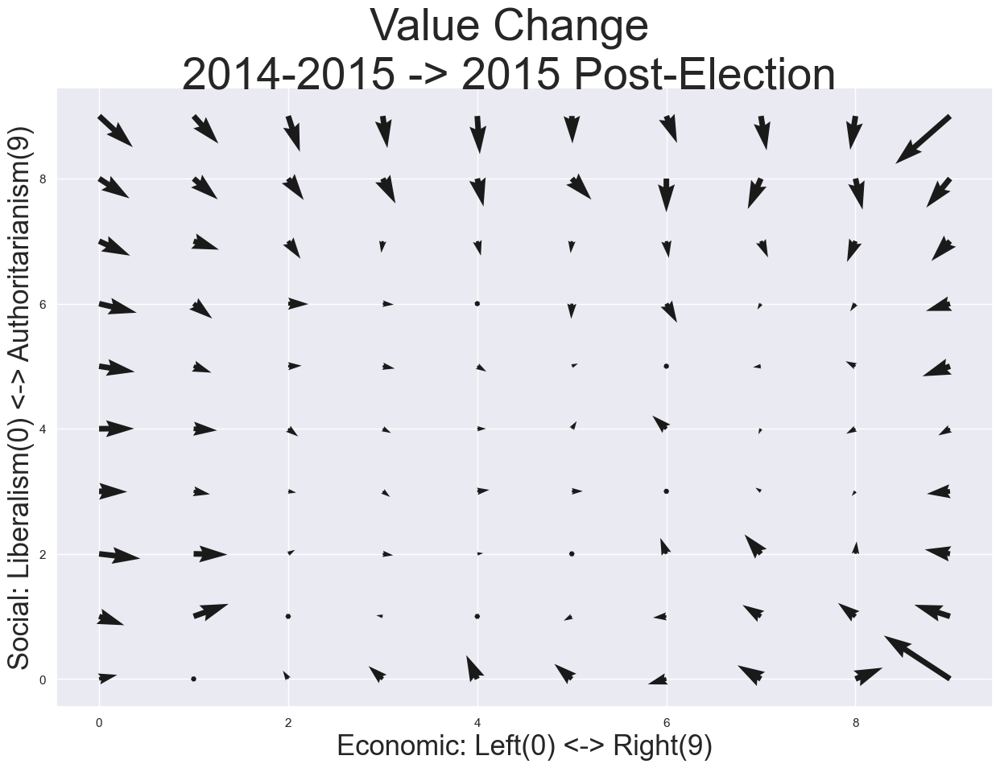

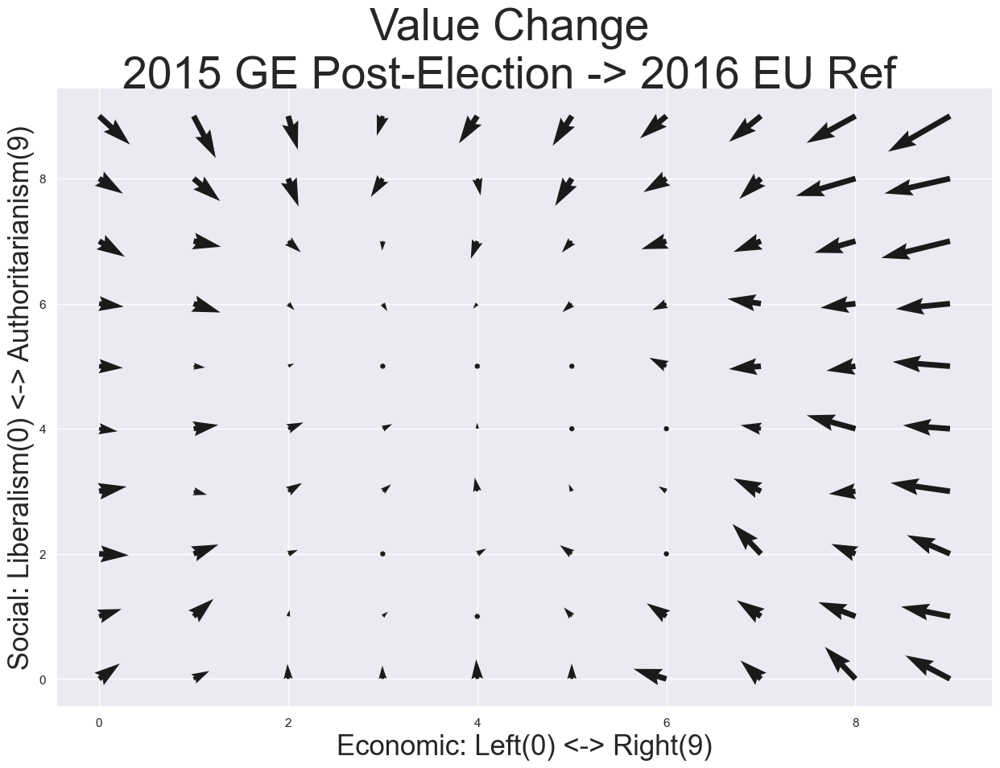

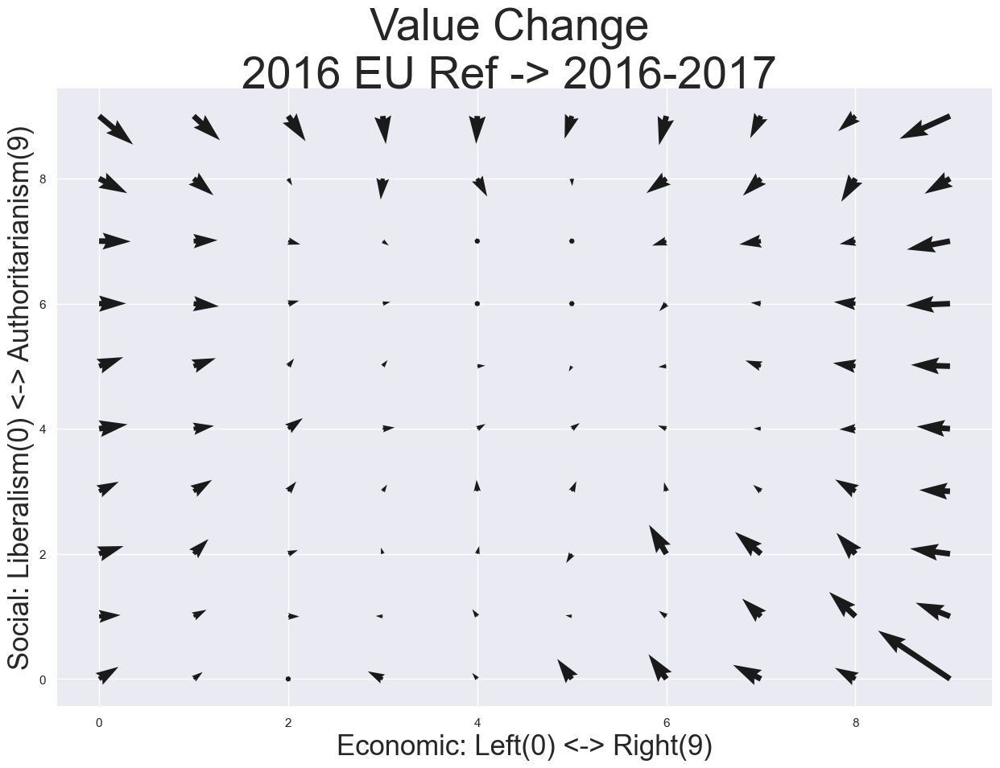

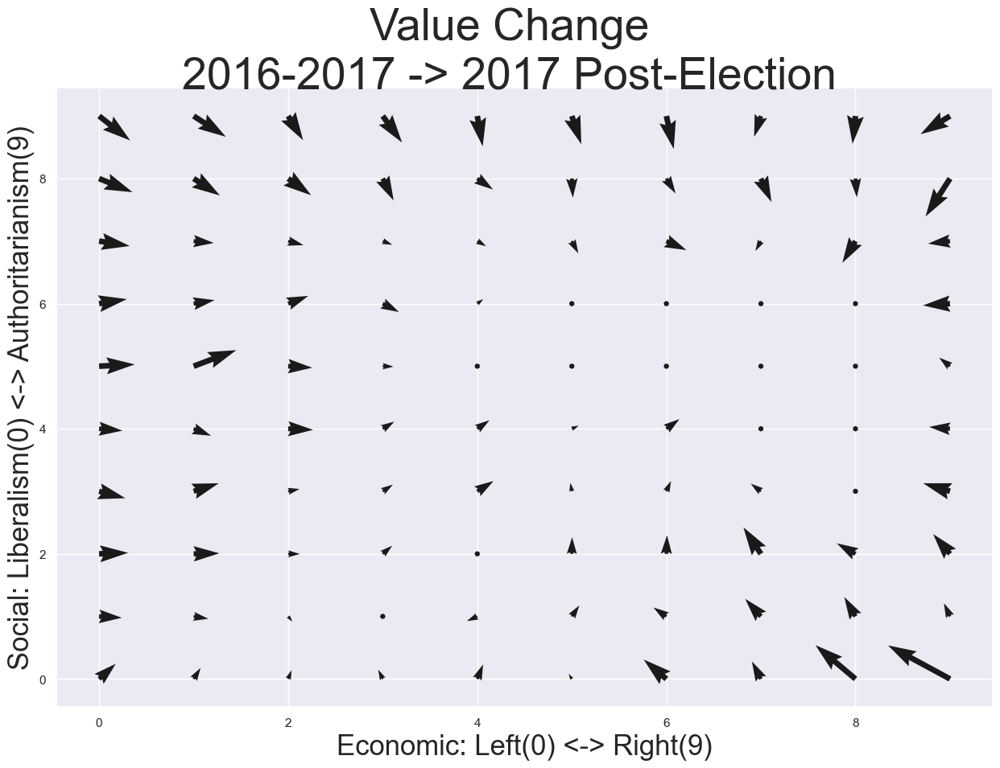

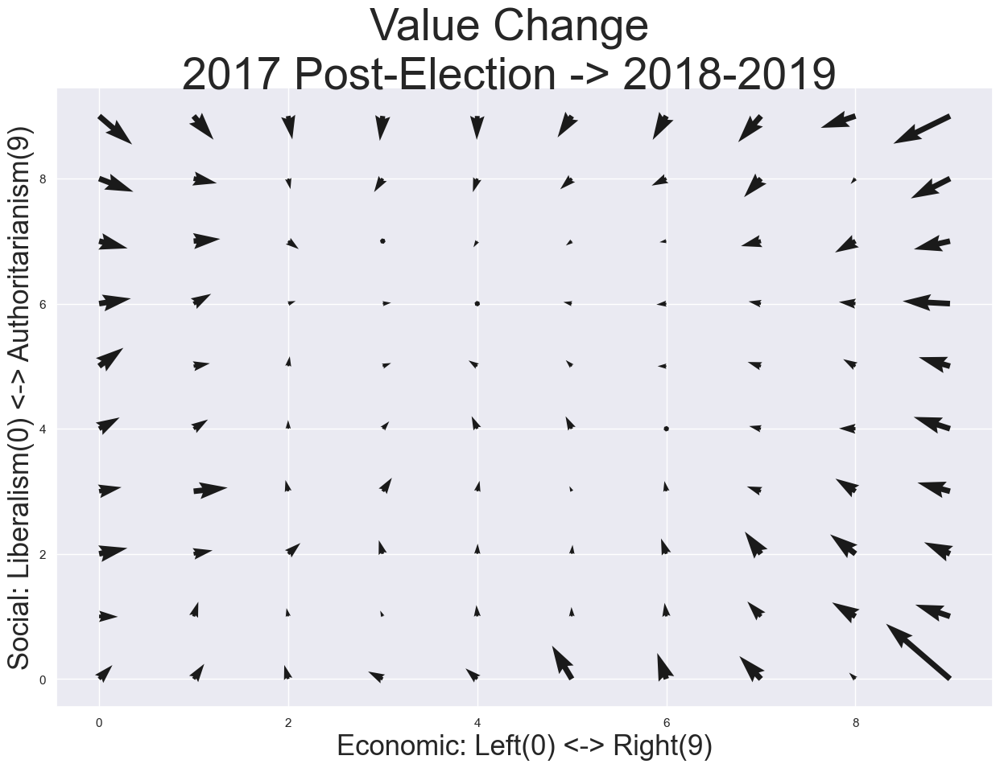

...

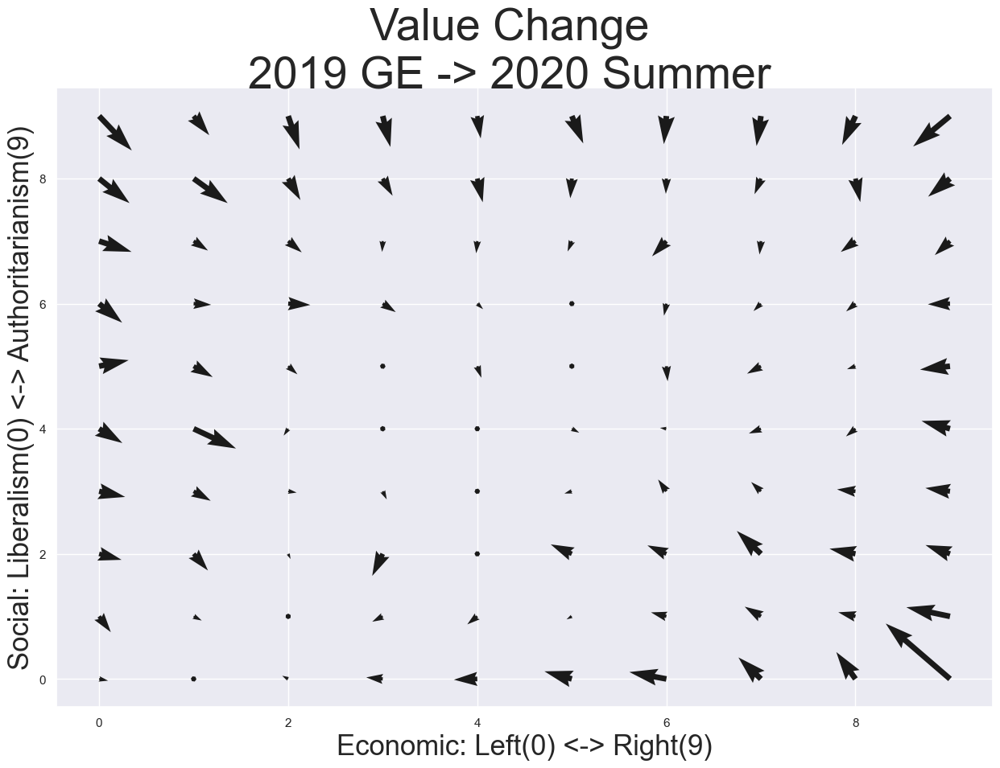

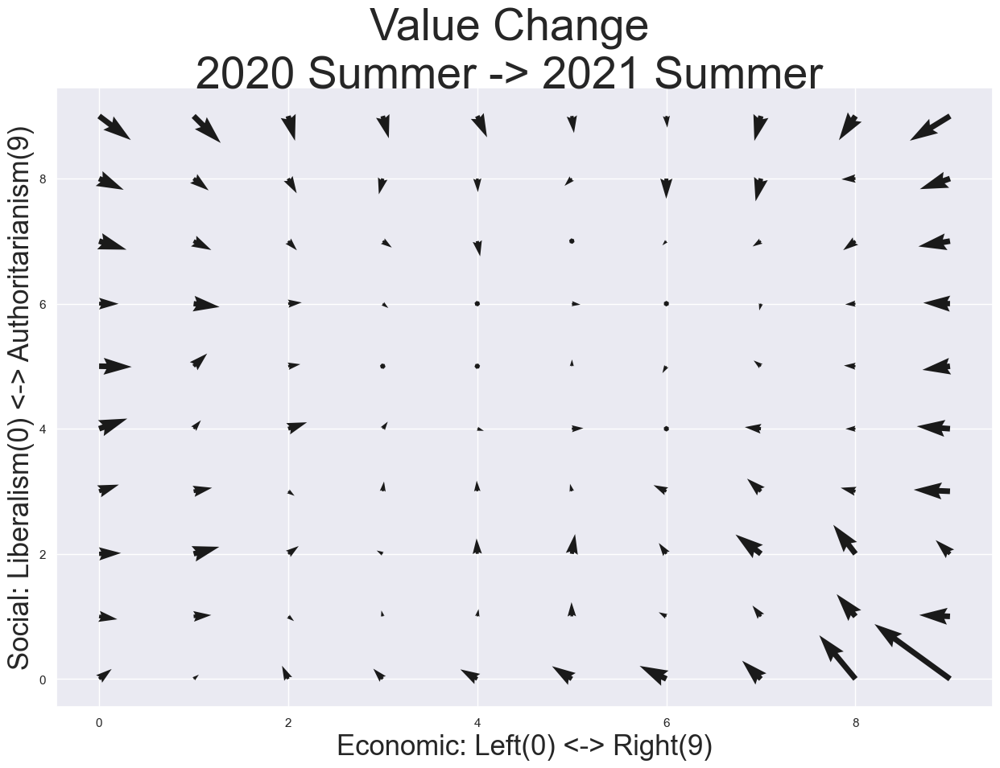

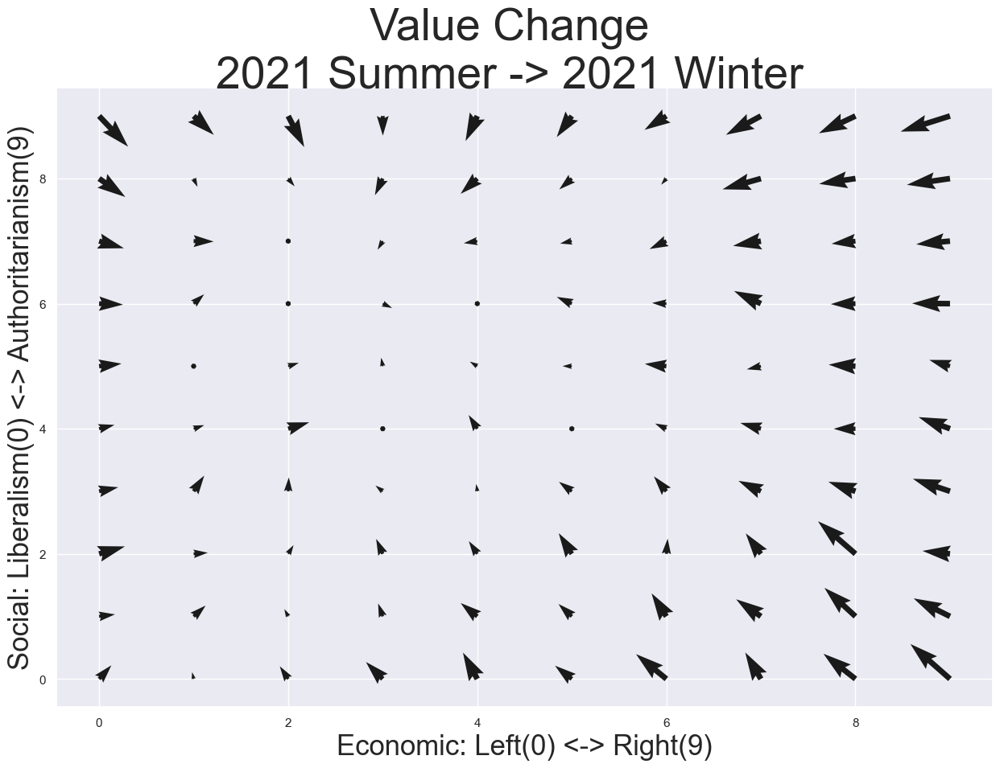

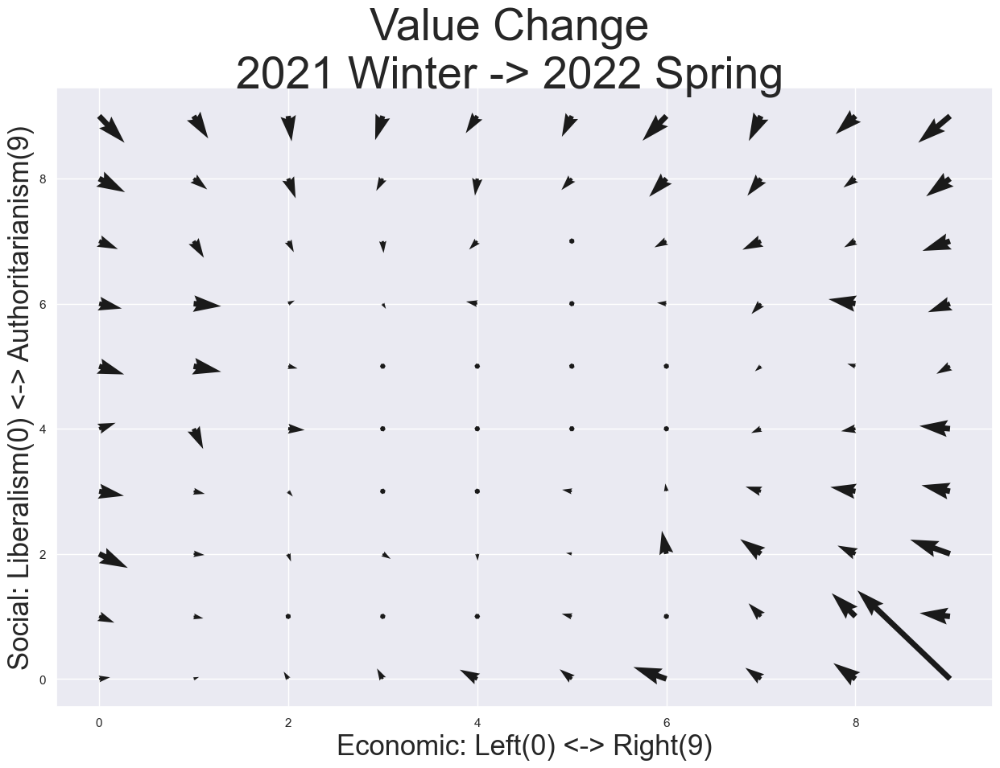

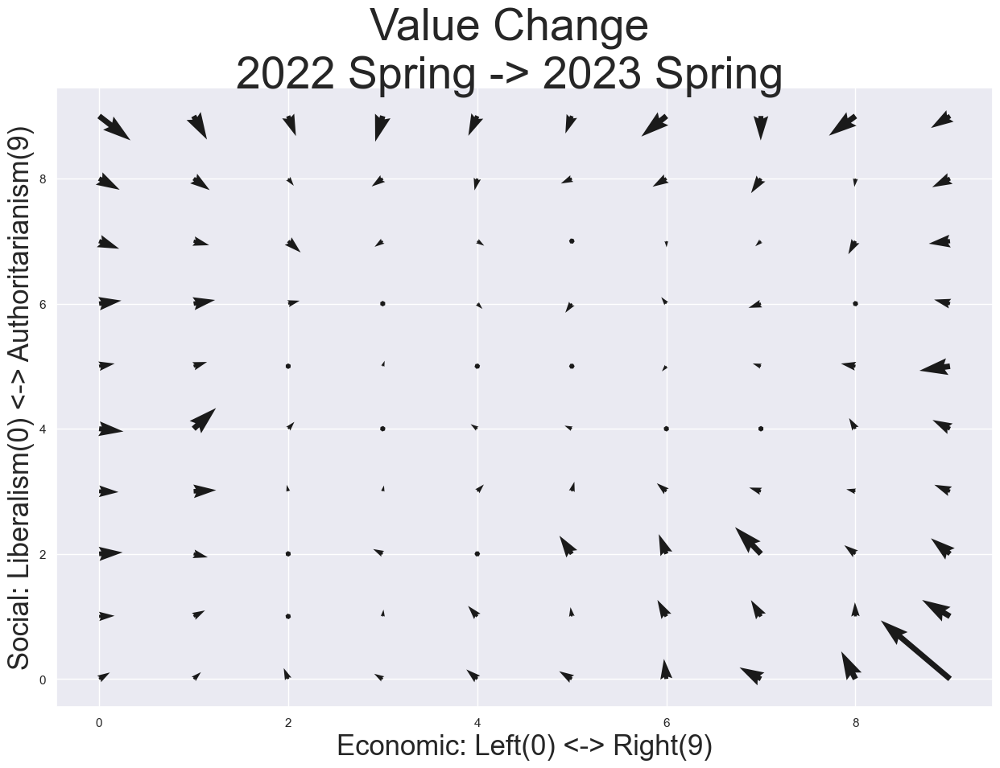

In [285]:
var_seq = ['W1_W5', 'W6', 'W7_W9', 'W10_W12',
       'W13', 'W14W15', 'W16', 'W17_W19',
       'W20', 'W21', 'W22', 'W23',
#        'al_scaleW24',
                 'W25']

wave_pair_dict = dict(zip(var_seq[:-1],var_seq[1:]))
wave_pair_to_wt = {'W1_W5':'wt_new_W6', 'W6':'wt_new_W7', 'W7_W9':'wt_new_W10', 'W10_W12':'wt_new_W13_result',
 'W13':'wt_new_W14', 'W14W15':'wt_new_W16', 'W16':'wt_new_W17', 'W17_W19':'wt_new_W20',
 'W20':'wt_new_W21', 'W21':'wt_new_W22', 'W22':'wt_new_W23', 'W23':'wt_new_W25'}
wave_pair_title = {'W1_W5':"2014-2015 -> 2015 Post-Election",
 'W6':"2015 GE Post-Election -> 2016 EU Ref",
 'W7_W9':"2016 EU Ref -> 2016-2017",
 'W10_W12':"2016-2017 -> 2017 Post-Election",
 'W13':"2017 Post-Election -> 2018-2019",
 'W14W15':"2018-2019 -> 2019 Post-Euro",
 'W16':"2019 Post-Euro -> 2019 GE",
 'W17_W19':"2019 GE -> 2020 Summer",
 'W20':"2020 Summer -> 2021 Summer",
 'W21':"2021 Summer -> 2021 Winter",
 'W22':"2021 Winter -> 2022 Spring",
 'W23':"2022 Spring -> 2023 Spring"}

q=10
temp, lr_bins = pd.qcut(BES_Panel[search(BES_Panel,"lr_scale").index].stack().cat.codes.replace(-1,np.nan),q,duplicates='drop',labels=False,retbins=True)
temp, al_bins = pd.qcut(BES_Panel[search(BES_Panel,"al_scale").index].stack().cat.codes.replace(-1,np.nan),q,duplicates='drop',labels=False,retbins=True)

uniform=True

output_dir = BES_output_folder+"value change vector plots"+os.sep

curve_dict = {}
save_list = []

for wave_pair_no in range(len(wave_pair_dict.keys())):

    first_wave = list(wave_pair_dict.keys())[wave_pair_no]
    second_wave = wave_pair_dict[first_wave]


    al_scale_first = BES_Panel["al_scale"+first_wave].cat.codes.replace(-1,np.nan)
    lr_scale_first = BES_Panel["lr_scale"+first_wave].cat.codes.replace(-1,np.nan)

    al_scale_second = BES_Panel["al_scale"+second_wave].cat.codes.replace(-1,np.nan)
    lr_scale_second = BES_Panel["lr_scale"+second_wave].cat.codes.replace(-1,np.nan)
    

    al_scale_shift = al_scale_second - al_scale_first
    lr_scale_shift = lr_scale_second - lr_scale_first
    
    if uniform:
        al_scale_first = pd.cut(al_scale_first,bins=al_bins,labels=False,include_lowest=True)
        lr_scale_first = pd.cut(lr_scale_first,bins=lr_bins,labels=False,include_lowest=True)       

    wt_var = wave_pair_to_wt[first_wave]
    title = wave_pair_title[first_wave]

    mask = al_scale_shift.notnull() & lr_scale_shift.notnull() & BES_Panel[wt_var].notnull()

    ct_al = pd.crosstab(
            lr_scale_first[mask],        
            al_scale_first[mask],
            values=list(zip(al_scale_shift[mask],BES_Panel[wt_var][mask])) ,
            aggfunc=weighted_mean,   ) 

    ct_al.index.name = "Economic Left-Right"
    ct_al.columns.name = "Social Liberal-Authoritarian"

    ct_lr = pd.crosstab(
            lr_scale_first[mask],        
            al_scale_first[mask],
            values=list(zip(lr_scale_shift[mask],BES_Panel[wt_var][mask])) ,
            aggfunc=weighted_mean,   ) 

    ct_lr.index.name = "Economic Left-Right"
    ct_lr.columns.name = "Social Liberal-Authoritarian"
    # ct_lr.loc[0,5]=50



    fig, ax1 = plt.subplots(1, 1)
    fig.set_figheight(10)
    fig.set_figwidth(15)
    fig.suptitle("Value Change\n"+title,fontsize=40)
    xlabel = 'Economic: Left(0) <-> Right('+str(q-1)+')'
    ylabel = 'Social: Liberalism(0) <-> Authoritarianism('+str(q-1)+')'
    # ax1.set_xlabel(xlabel);
    # ax1.set_ylabel(ylabel);
    if uniform:
        mesh_q = q
    else:
        mesh_q=21
        
    X = np.arange(0, mesh_q, 1)
    Y = np.arange(0, mesh_q, 1)
    U, V = np.meshgrid(X, Y)
    V[:]=0

    quiv = ax1.quiver(X, Y, (ct_lr).T, (ct_al).T, scale=50)

    ax1.set_xlabel(xlabel,fontsize=25);
    ax1.set_ylabel(ylabel,fontsize=25);
    
    curve_dict[wave_pair_no] = ax1
    fname = first_wave+"__"+second_wave
    fig.savefig(output_dir+fname+".png",format='png');
    save_list.append(fname)

# opts.defaults(opts.VectorField()) # height=400, width=500
# U= (ct_lr).values.T
# V= (ct_al).values.T
# mag = np.sqrt(U**2 + V**2)
# angle = (np.pi/2.) - np.arctan2(U/mag, V/mag)    
# vectorfield = hv.VectorField((X, Y, angle, mag)).opts(magnitude='Magnitude',
# #                                                       color='Magnitude',
#                                                       #cmap='bwr',
#                                                       xlabel=xlabel,ylabel=ylabel)

# vectorfield.opts(title=title,fig_inches=10,aspect=1)

# hmap = hv.HoloMap(curve_dict)

from PIL import Image
output_dir = output_dir
stub = ""
wave_list = save_list
gif_fn = "my_awesome.gif"
duration=1000

def make_gif(output_dir,stub,wave_list,gif_fn,duration):
    frames = [Image.open(output_dir+stub+str(wave)+".png") for wave in wave_list]
    frame_one = frames[0]
    frame_one.save(output_dir+gif_fn, format="GIF", append_images=frames,
               save_all=True, duration=1000, loop=0)
    
make_gif(output_dir,stub,wave_list,gif_fn,duration)

In [270]:
import os
output_dir = BES_output_folder+"value change vector plots"+os.sep
# os.mkdir(output_dir) 

FileExistsError: [WinError 183] Cannot create a file when that file already exists: '..\\BES_analysis_output\\value change vector plots\\'

In [266]:
output_dir+gif_fn

'..\\BES_analysis_output\\voter perception vector plots\\my_awesome.gif'

In [171]:
(ct_lr).values[::-1,:][0][0]

-12.421348838546084

<Axes: >

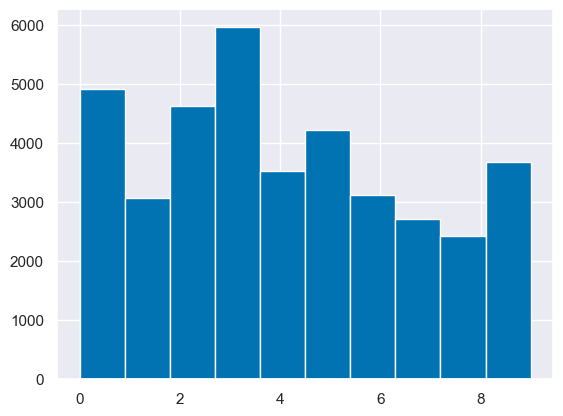

In [238]:
for 
q=10
temp = pd.qcut(BES_Panel["al_scaleW1_W5"].cat.codes.replace(-1,np.nan),q=q).cat.codes.replace(-1,np.nan)
temp.hist(bins=q)

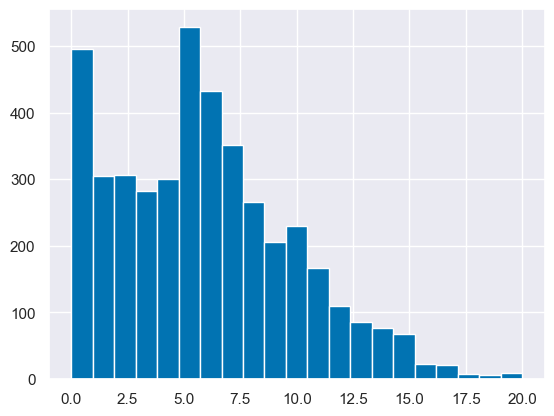

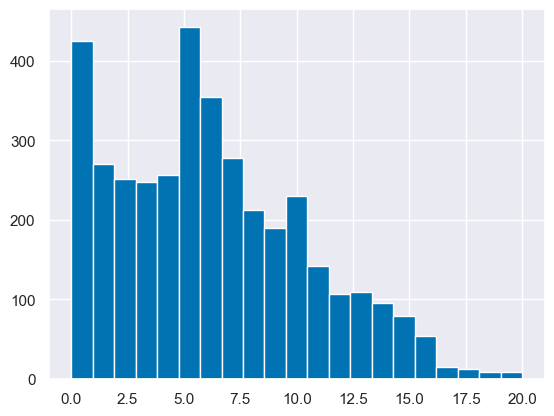

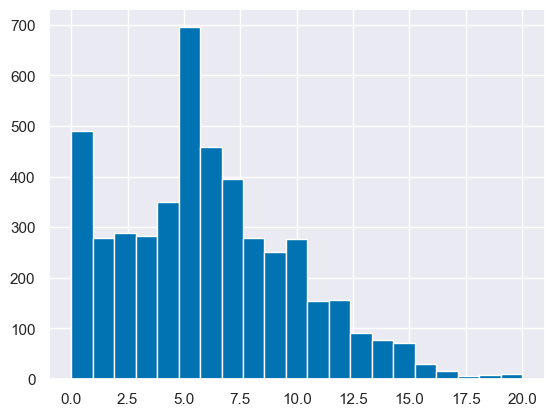

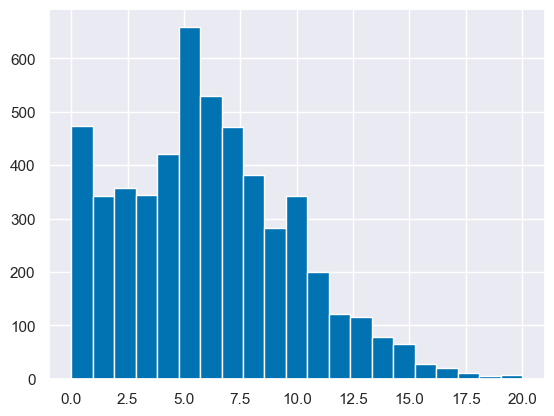

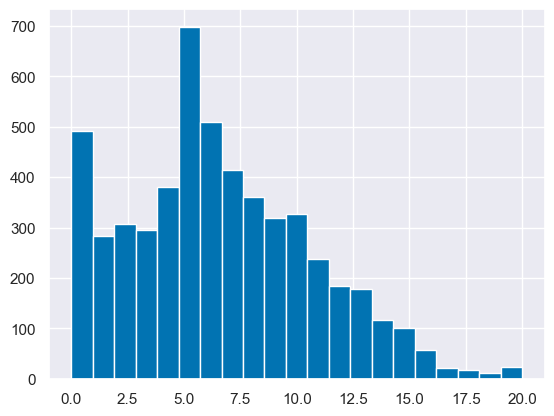

...

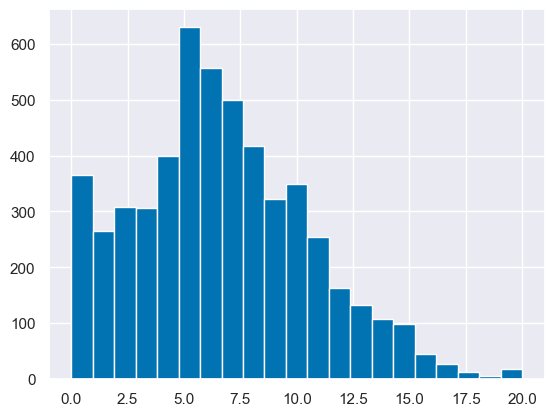

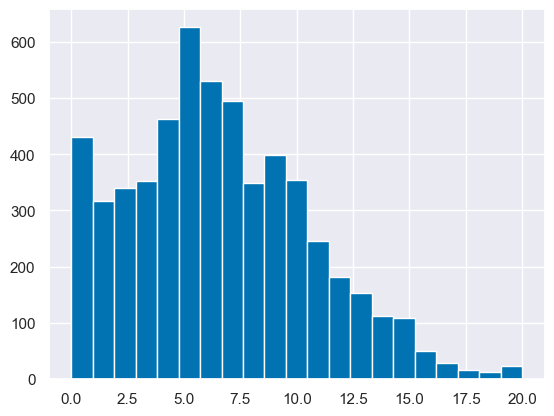

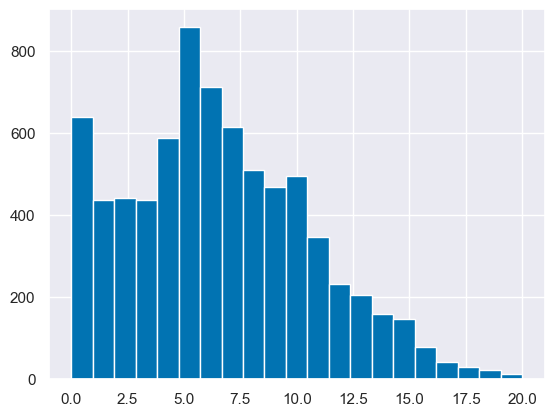

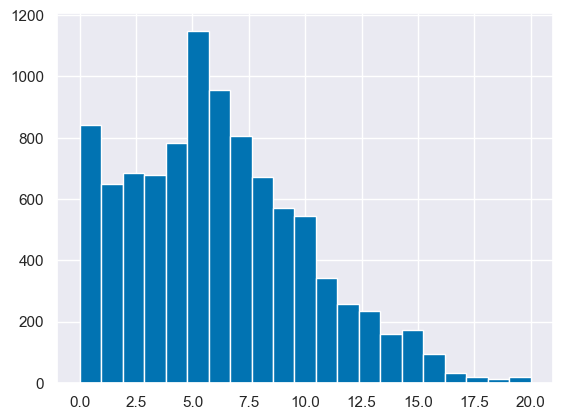

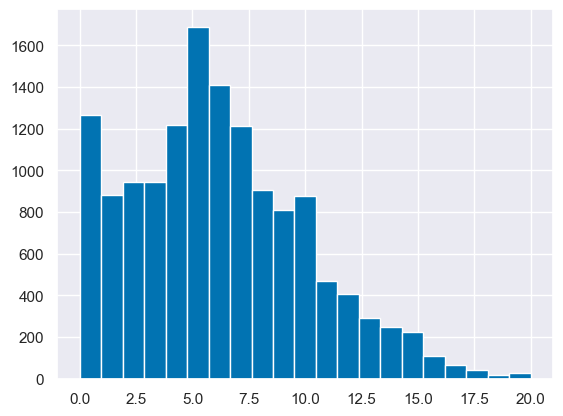

In [227]:
var_seq = ['W1_W5', 'W6', 'W7_W9', 'W10_W12',
       'W13', 'W14W15', 'W16', 'W17_W19',
       'W20', 'W21', 'W22', 'W23',
#        'al_scaleW24',
                 'W25']

wave_pair_dict = dict(zip(var_seq[:-1],var_seq[1:]))
wave_pair_to_wt = {'W1_W5':'wt_new_W6', 'W6':'wt_new_W7', 'W7_W9':'wt_new_W10', 'W10_W12':'wt_new_W13_result',
 'W13':'wt_new_W14', 'W14W15':'wt_new_W16', 'W16':'wt_new_W17', 'W17_W19':'wt_new_W20',
 'W20':'wt_new_W21', 'W21':'wt_new_W22', 'W22':'wt_new_W23', 'W23':'wt_new_W25'}


curve_dict = {}

for wave_pair_no in range(len(wave_pair_dict.keys())):

    first_wave = list(wave_pair_dict.keys())[wave_pair_no]
    second_wave = wave_pair_dict[first_wave]
    
    al_scale_first = BES_Panel["al_scale"+first_wave].cat.codes.replace(-1,np.nan)
    lr_scale_first = BES_Panel["lr_scale"+first_wave].cat.codes.replace(-1,np.nan)

    al_scale_second = BES_Panel["al_scale"+second_wave].cat.codes.replace(-1,np.nan)
    lr_scale_second = BES_Panel["lr_scale"+second_wave].cat.codes.replace(-1,np.nan)

    wt_var = wave_pair_to_wt[first_wave]

    mask = al_scale_shift.notnull() & lr_scale_shift.notnull() & BES_Panel[wt_var].notnull()
    
    plt.figure()
    lr_scale_first[mask].hist(bins=21)

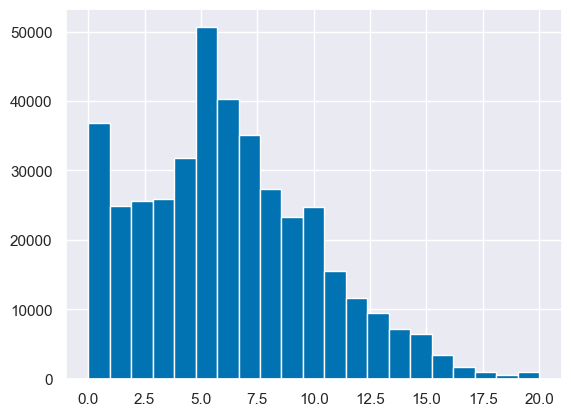

In [226]:
BES_Panel[search(BES_Panel,"lr_scale").index].stack().cat.codes.replace(-1,np.nan).hist(bins=21);

In [ ]:
## masked subsamples of al_scale look pretty eyeball-similar to full distribution
## same with lr_scale

# q=10 is ... adequate for both scales

q =  21
q =  20
q =  19
q =  18
q =  17
q =  16
q =  15
q =  14
q =  13
q =  12
q =  11
q =  10
q =  9
q =  8
q =  7
q =  6


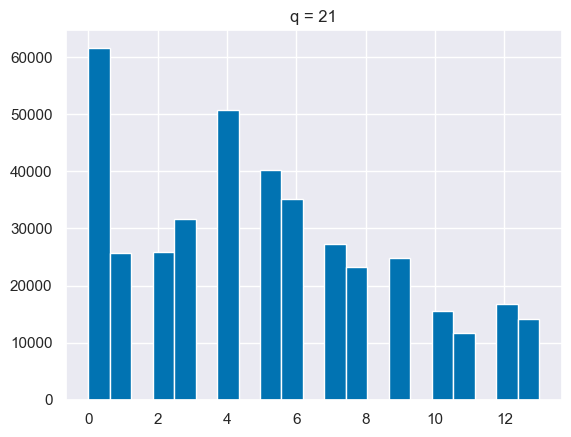

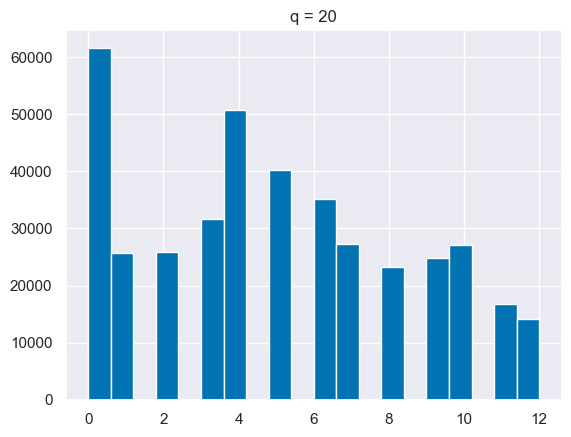

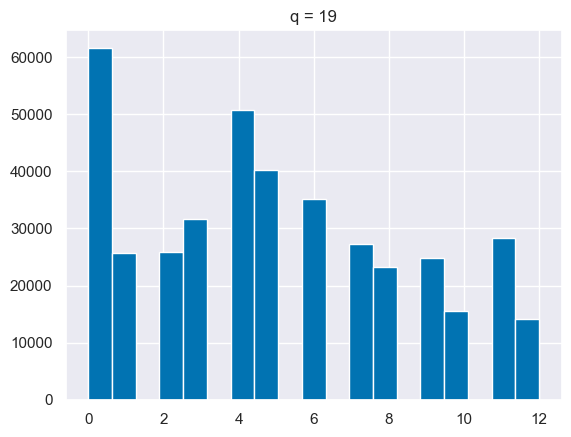

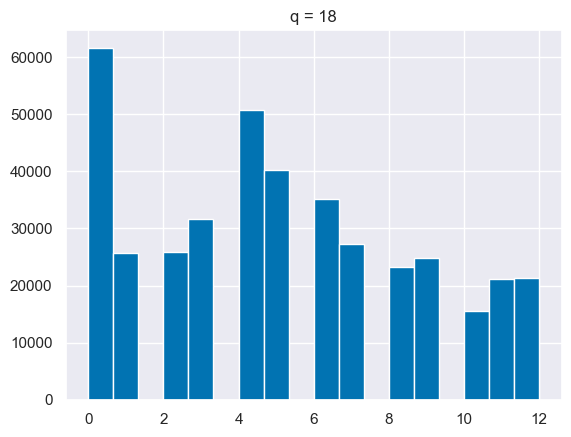

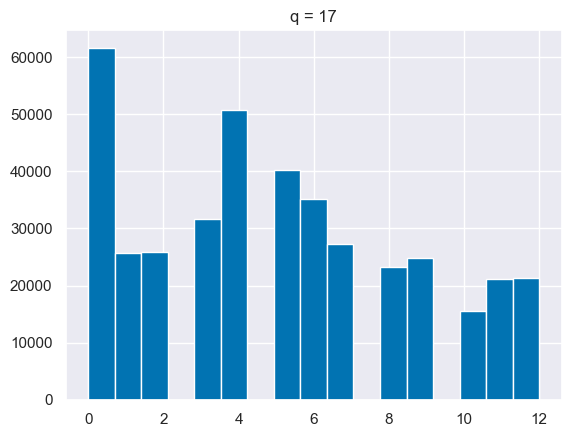

...

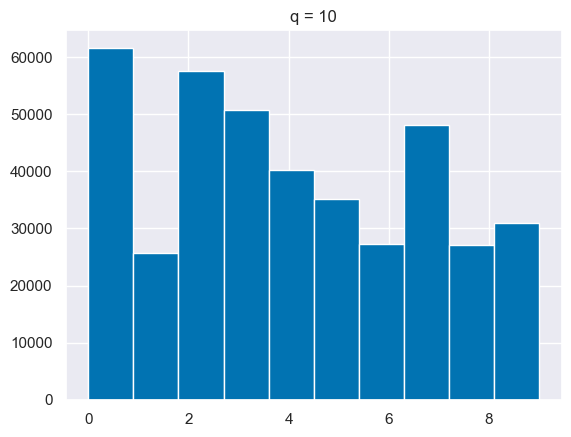

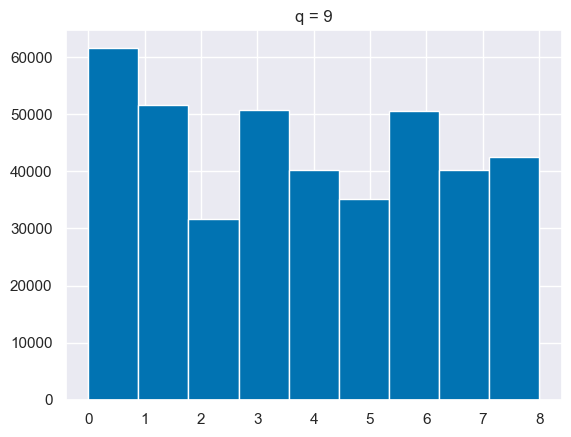

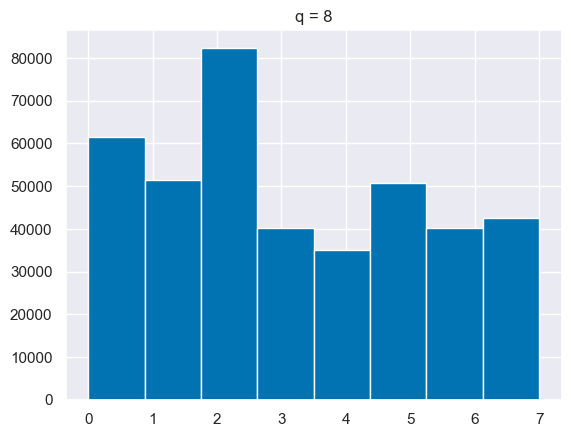

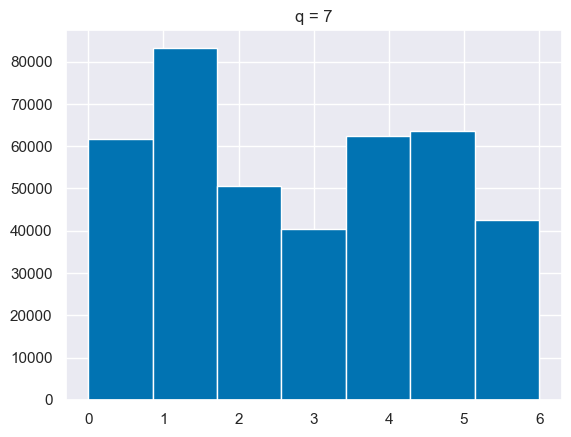

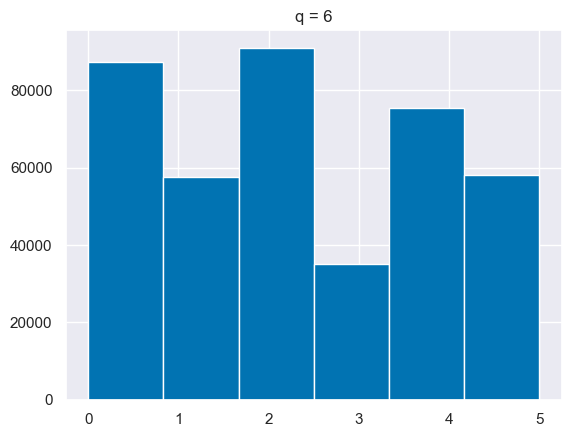

In [247]:
for q in range(21,5,-1):

    temp = pd.qcut(BES_Panel[search(BES_Panel,"lr_scale").index].stack().cat.codes.replace(-1,np.nan),q,duplicates='drop')
    print("q = ",q);
    plt.figure()
    temp.cat.codes.replace(-1,np.nan).hist(bins=q);
    plt.title("q = "+str(q))

q =  21
q =  20
q =  19
q =  18
q =  17
q =  16
q =  15
q =  14
q =  13
q =  12
q =  11
q =  10
q =  9
q =  8
q =  7
q =  6


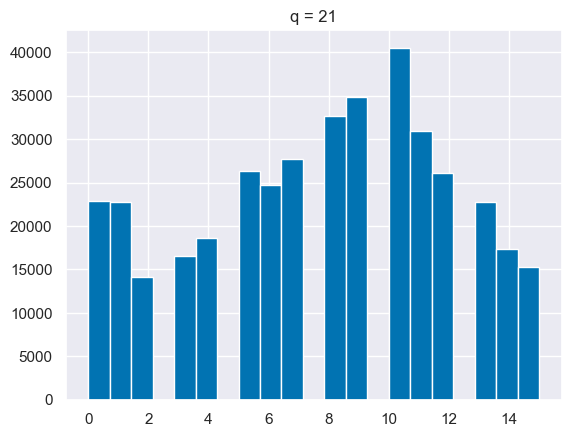

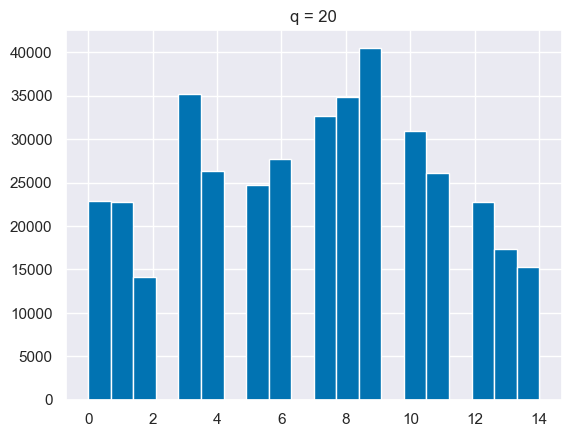

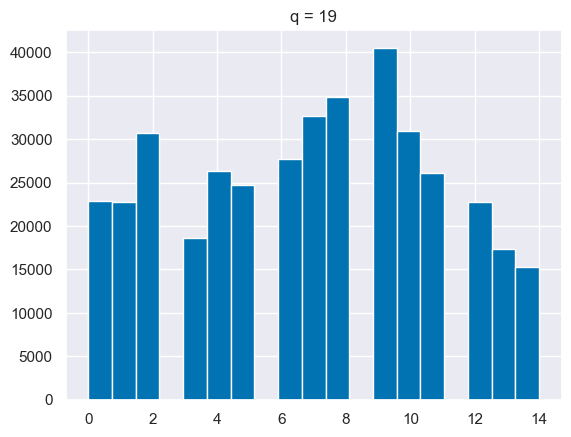

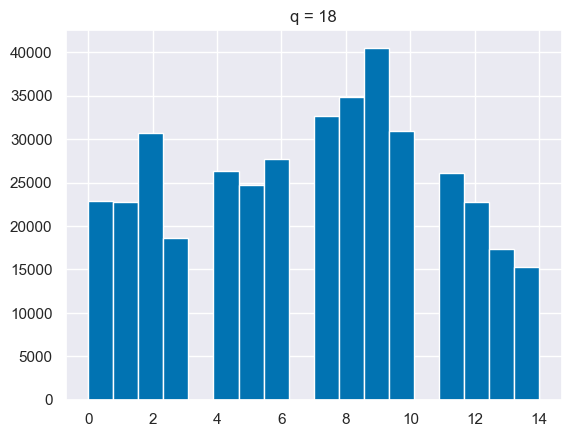

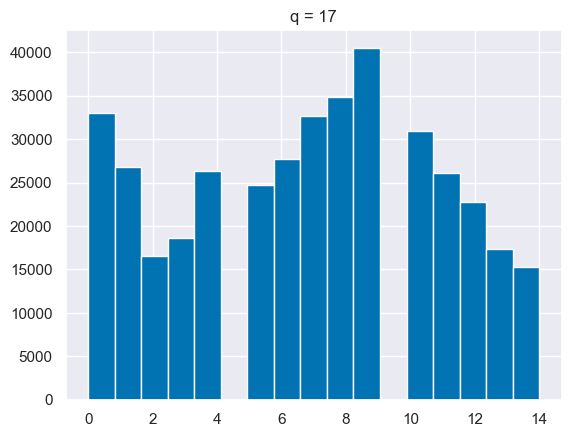

...

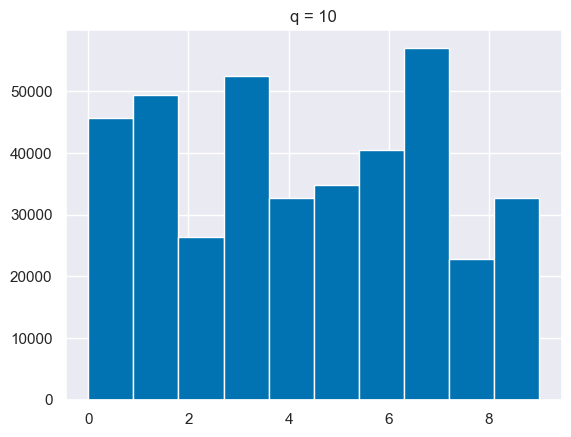

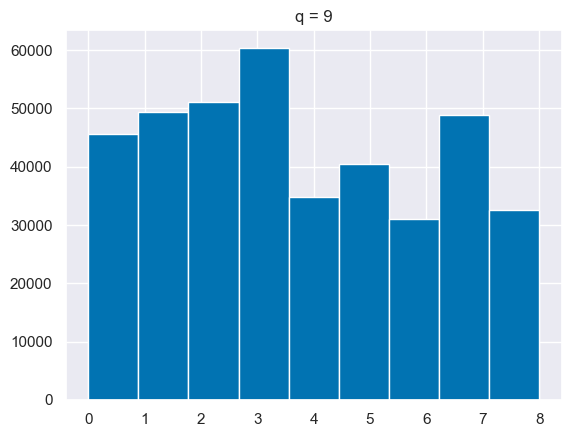

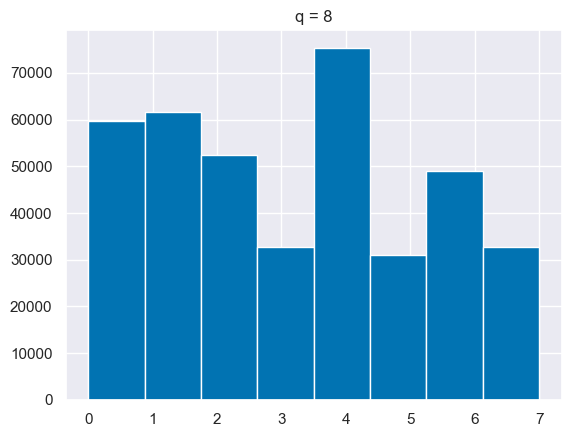

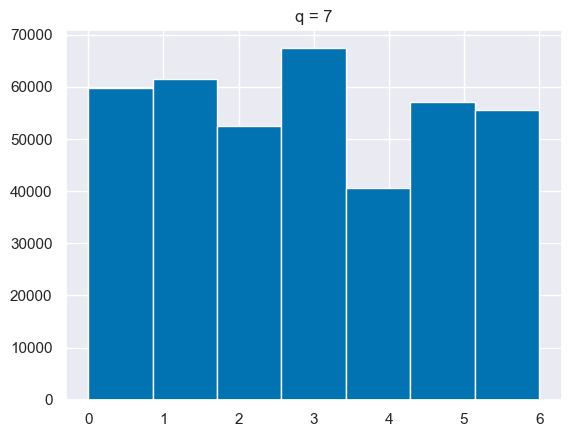

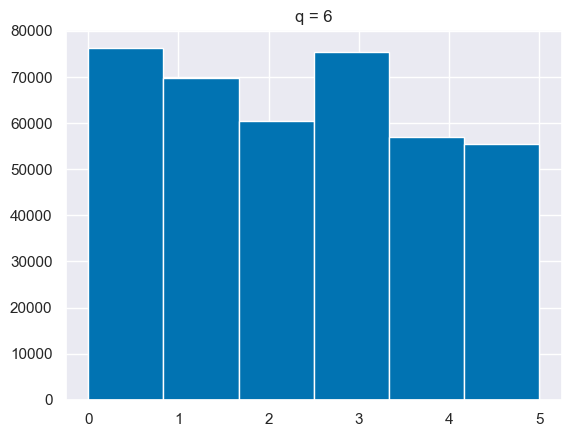

In [248]:
for q in range(21,5,-1):

    temp = pd.qcut(BES_Panel[search(BES_Panel,"al_scale").index].stack().cat.codes.replace(-1,np.nan),q,duplicates='drop')
    print("q = ",q);
    plt.figure()
    temp.cat.codes.replace(-1,np.nan).hist(bins=q);
    plt.title("q = "+str(q))

In [249]:
q=10
temp, lr_bins = pd.qcut(BES_Panel[search(BES_Panel,"lr_scale").index].stack().cat.codes.replace(-1,np.nan),q,duplicates='drop',labels=False,retbins=True)
temp, al_bins = pd.qcut(BES_Panel[search(BES_Panel,"al_scale").index].stack().cat.codes.replace(-1,np.nan),q,duplicates='drop',labels=False,retbins=True)

pd.cut(BES_Panel["lr_scaleW1_W5"].cat.codes.replace(-1,np.nan),bins=lr_bins,labels=False,include_lowest=True).hist(bins=10)

In [250]:
lr_bins

array([ 0.,  1.,  2.,  4.,  5.,  6.,  7.,  8., 10., 12., 20.])

In [1]:
%%time
dataset_name = "W25_comb"
df_list = "BES_Panel|BES_reduced_with_na"

%matplotlib inline 
%run BES_header.py {dataset_name} {df_list}

global BES_label_list, BES_df_list
# BES_reduced_with_na.index=BES_Panel.index

Toggle code

var_type (10365, 13)
CPU times: total: 2min 23s
Wall time: 3min 6s


In [2]:
BES_reduced_with_na.index = BES_Panel.index

In [4]:
id_list = []

var_seq = ['W1_W5', 'W6', 'W7_W9', 'W10_W12',
       'W13', 'W14W15', 'W16', 'W17_W19',
       'W20', 'W21', 'W22', 'W23',
#        'al_scaleW24',
                 'W25']

wave_pair_dict = dict(zip(var_seq[:-1],var_seq[1:]))
wave_pair_to_wt = {'W1_W5':'wt_new_W6', 'W6':'wt_new_W7', 'W7_W9':'wt_new_W10', 'W10_W12':'wt_new_W13_result',
 'W13':'wt_new_W14', 'W14W15':'wt_new_W16', 'W16':'wt_new_W17', 'W17_W19':'wt_new_W20',
 'W20':'wt_new_W21', 'W21':'wt_new_W22', 'W22':'wt_new_W23', 'W23':'wt_new_W25'}
wave_pair_title = {'W1_W5':"2014-2015 -> 2015 Post-Election",
 'W6':"2015 GE Post-Election -> 2016 EU Ref",
 'W7_W9':"2016 EU Ref -> 2016-2017",
 'W10_W12':"2016-2017 -> 2017 Post-Election",
 'W13':"2017 Post-Election -> 2018-2019",
 'W14W15':"2018-2019 -> 2019 Post-Euro",
 'W16':"2019 Post-Euro -> 2019 GE",
 'W17_W19':"2019 GE -> 2020 Summer",
 'W20':"2020 Summer -> 2021 Summer",
 'W21':"2021 Summer -> 2021 Winter",
 'W22':"2021 Winter -> 2022 Spring",
 'W23':"2022 Spring -> 2023 Spring"}

q=10
temp, lr_bins = pd.qcut(BES_Panel[search(BES_Panel,"lr_scale").index].stack().cat.codes.replace(-1,np.nan),q,duplicates='drop',labels=False,retbins=True)
temp, al_bins = pd.qcut(BES_Panel[search(BES_Panel,"al_scale").index].stack().cat.codes.replace(-1,np.nan),q,duplicates='drop',labels=False,retbins=True)

uniform=True

output_dir = BES_output_folder+"value change vector plots"+os.sep

curve_dict = {}
save_list = []

for wave_pair_no in range(len(wave_pair_dict.keys())):

    first_wave = list(wave_pair_dict.keys())[wave_pair_no]
    second_wave = wave_pair_dict[first_wave]


    al_scale_first = BES_Panel["al_scale"+first_wave].cat.codes.replace(-1,np.nan)
    lr_scale_first = BES_Panel["lr_scale"+first_wave].cat.codes.replace(-1,np.nan)

    al_scale_second = BES_Panel["al_scale"+second_wave].cat.codes.replace(-1,np.nan)
    lr_scale_second = BES_Panel["lr_scale"+second_wave].cat.codes.replace(-1,np.nan)
    

    al_scale_shift = al_scale_second - al_scale_first
    lr_scale_shift = lr_scale_second - lr_scale_first
    
    if uniform:
        al_scale_first = pd.cut(al_scale_first,bins=al_bins,labels=False,include_lowest=True)
        lr_scale_first = pd.cut(lr_scale_first,bins=lr_bins,labels=False,include_lowest=True)       

    wt_var = wave_pair_to_wt[first_wave]


    mask = al_scale_shift.notnull() & lr_scale_shift.notnull() & BES_Panel[wt_var].notnull()
    
    id_list.append(list(mask[mask].index))

In [5]:
id_list = list(set(flatten(id_list))) 

In [6]:
gc.collect()

0

In [7]:
BES_reduced_with_na = BES_reduced_with_na.loc[id_list]

In [10]:
BES_Panel = BES_Panel.loc[id_list]

In [11]:
gc.collect()

0

In [22]:
var_set = BES_reduced_with_na.var()

MemoryError: Unable to allocate 5.77 GiB for an array with shape (13180, 58807) and data type float64

In [23]:
memory_use(locs = locals().items())

           BES_reduced_with_na:   5.8GiB
                     BES_Panel: 831.5MiB
                       weights:  24.7MiB
                      var_type:   8.5MiB
                          temp:   8.3MiB
                al_scale_first:   4.3MiB
                lr_scale_first:   4.3MiB
               al_scale_second:   4.3MiB
               lr_scale_second:   4.3MiB
                al_scale_shift:   4.3MiB


In [49]:
BES_Panel_dict[25]

,turnoutUKGeneral__Very likely that I will vote,partyIdStrength__Not very strong,"anyUniW21W22W23__Yes, I graduated from higher education",polAttention__Pay a great deal of attention,pidWeThey__Strongly agree,pidInterestedOthers__Strongly agree,pidCriticiseParty__Strongly agree,pidCommonParty__Strongly agree,pidConnected__Strongly agree,pidPraiseGood__Strongly agree,...,statusActivities1_13_Yes,statusActivities2_11_Yes,statusActivities1_11_Yes,statusActivities1_12_Yes,statusActivities1_14_Yes,statusActivities2_10_Yes,statusActivities2_3_Yes,statusActivities2_9_Yes,statusActivities2_7_Yes,statusActivities2_8_Yes
0,4.0,1.0,0.0,6.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,4.0,2.0,0.0,8.0,NaN,2.0,0.0,1.0,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,4.0,1.0,3.0,10.0,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
3,3.0,2.0,3.0,6.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4.0,0.0,NaN,10.0,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30402,1.0,NaN,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
30403,1.0,2.0,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
30404,2.0,NaN,1.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
30405,4.0,1.0,1.0,7.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [23]:
var_seq = ['W1_W5', 'W6', 'W7_W9', 'W10_W12',
       'W13', 'W14W15', 'W16', 'W17_W19',
       'W20', 'W21', 'W22', 'W23',
#        'al_scaleW24',
                 'W25']

wave_pair_dict = dict(zip(var_seq[:-1],var_seq[1:]))

list( range(len(wave_pair_dict.keys())) )

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

In [25]:
var_seq = ['W1_W5', 'W6', 'W7_W9', 'W10_W12',
       'W13', 'W14W15', 'W16', 'W17_W19',
       'W20', 'W21', 'W22', 'W23',
#        'al_scaleW24',
                 'W25']

wave_pair_dict = dict(zip(var_seq[:-1],var_seq[1:]))
wave_pair_to_wt = {'W1_W5':'wt_new_W6', 'W6':'wt_new_W7', 'W7_W9':'wt_new_W10', 'W10_W12':'wt_new_W13_result',
 'W13':'wt_new_W14', 'W14W15':'wt_new_W16', 'W16':'wt_new_W17', 'W17_W19':'wt_new_W20',
 'W20':'wt_new_W21', 'W21':'wt_new_W22', 'W22':'wt_new_W23', 'W23':'wt_new_W25'}
wave_pair_title = {'W1_W5':"2014-2015 -> 2015 Post-Election",
 'W6':"2015 GE Post-Election -> 2016 EU Ref",
 'W7_W9':"2016 EU Ref -> 2016-2017",
 'W10_W12':"2016-2017 -> 2017 Post-Election",
 'W13':"2017 Post-Election -> 2018-2019",
 'W14W15':"2018-2019 -> 2019 Post-Euro",
 'W16':"2019 Post-Euro -> 2019 GE",
 'W17_W19':"2019 GE -> 2020 Summer",
 'W20':"2020 Summer -> 2021 Summer",
 'W21':"2021 Summer -> 2021 Winter",
 'W22':"2021 Winter -> 2022 Spring",
 'W23':"2022 Spring -> 2023 Spring"}

wave_pair_to_df_no = {'W1_W5':6, 'W6':7, 'W7_W9':10, 'W10_W12':13,
 'W13':14, 'W14W15':16, 'W16':17, 'W17_W19':20,
 'W20':21, 'W21':22, 'W22':23, 'W23':25}
wave_pair_to_df_no_first = {'W1_W5':5, 'W6':6, 'W7_W9':9, 'W10_W12':12,
 'W13':13, 'W14W15':15, 'W16':16, 'W17_W19':19,
 'W20':20, 'W21':21, 'W22':22, 'W23':23}

q=10
# temp, lr_bins = pd.qcut(BES_Panel[search(BES_Panel,"lr_scale").index].stack().cat.codes.replace(-1,np.nan),q,duplicates='drop',labels=False,retbins=True)
# temp, al_bins = pd.qcut(BES_Panel[search(BES_Panel,"al_scale").index].stack().cat.codes.replace(-1,np.nan),q,duplicates='drop',labels=False,retbins=True)

uniform=True

output_dir = BES_output_folder+"value change vector plots"+os.sep

curve_dict = {}
save_list = []

for wave_pair_no in range(len(wave_pair_dict.keys())):

    first_wave = list(wave_pair_dict.keys())[wave_pair_no]
    second_wave = wave_pair_dict[first_wave]


    al_scale_first = BES_Panel_dict[wave_pair_to_df_no_first[first_wave]]["al_scale"]
#     BES_Panel["al_scale"+first_wave].cat.codes.replace(-1,np.nan)
    lr_scale_first = BES_Panel_dict[wave_pair_to_df_no_first[first_wave]]["lr_scale"]
    # BES_Panel["lr_scale"+first_wave].cat.codes.replace(-1,np.nan)

    al_scale_second = BES_Panel_dict[wave_pair_to_df_no_first[first_wave]]["al_scale"]
#     BES_Panel["al_scale"+second_wave].cat.codes.replace(-1,np.nan)
    lr_scale_second = BES_Panel["lr_scale"+second_wave].cat.codes.replace(-1,np.nan)
    

    al_scale_shift = al_scale_second - al_scale_first
    lr_scale_shift = lr_scale_second - lr_scale_first
    
#     if uniform:
#         al_scale_first = pd.cut(al_scale_first,bins=al_bins,labels=False,include_lowest=True)
#         lr_scale_first = pd.cut(lr_scale_first,bins=lr_bins,labels=False,include_lowest=True)       

    wt_var = wave_pair_to_wt[first_wave]


    mask = al_scale_shift.notnull() & lr_scale_shift.notnull() & BES_Panel[wt_var].notnull()
    
#     %%time
#     name = title
    # BES_reduced_with_na[name] = Acq_df[name+"_acq"]

    # BES_num[name] = BES_Panel[name].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan).loc[BES_num.index]
#     df, corr_type = make_corr_summary(BES_reduced_with_na, name)
#     display_corr(df,name,corr_type)
    
    BES_reduced_with_na = BES_Panel_dict[wave_pair_to_df_no[first_wave]]
    name = "target"
    BES_reduced_with_na[name]= al_scale_shift
    title = "al_scale: " + wave_pair_title[first_wave]
    print(title)

    (explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics) = xgboost_run(
        title = title,dataset=BES_reduced_with_na,
                                                        var_list = [name],
                                                        var_stub_list = [name,"al_scale","lr_scale",
                                                                         "al1","al2","al2","al3","al4","al5",
                                                                         "lr1","lr2","lr2","lr3","lr4","lr5",
                                                                        ],
                                                        verbosity=0)
#     del BES_reduced_with_na[name]
    
    name = "target"
    BES_reduced_with_na[name]= lr_scale_shift
    title = "lr_scale: " + wave_pair_title[first_wave]
    print(title)

    (explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics) = xgboost_run(
        title = title,dataset=BES_reduced_with_na,
                                                        var_list = [name],
                                                        var_stub_list = [name,"al_scale","lr_scale",
                                                                         "al1","al2","al2","al3","al4","al5",
                                                                         "lr1","lr2","lr2","lr3","lr4","lr5",
                                                                        ],
                                                        verbosity=0)
#     del BES_reduced_with_na[name]

al_scale: 2014-2015 -> 2015 Post-Election


MemoryError: Unable to allocate 2.39 GiB for an array with shape (13004, 24638) and data type float64

In [12]:
gc.collect()

0

In [10]:
del BES_reduced_with_na["lr_scale_shift"]

KeyError: 'lr_scale_shift'

In [306]:
mask = al_scale_shift.notnull() & lr_scale_shift.notnull() & BES_Panel[wt_var].notnull()
corrs = BES_reduced_with_na[mask].corrwith(al_scale_shift[mask])

In [311]:
# corrs.dropna().sort_values().tail(50)

In [605]:
%%time
dataset_name = "W16_only"
df_list = "BES_Panel|BES_reduced_with_na"

%matplotlib inline 
%run BES_header.py {dataset_name} {df_list}

global BES_label_list, BES_df_list

BES_PanelW16 = BES_Panel
BES_reduced_with_naW16 = BES_reduced_with_na
BES_reduced_with_naW16.index= BES_PanelW16.index

Toggle code

var_type (468, 13)
CPU times: total: 422 ms
Wall time: 599 ms


<Figure size 640x480 with 0 Axes>

In [587]:
BES_Panel

,starttime,endtime,wt,wt_daily,turnoutUKGeneral,generalElectionVote,generalElectionVotePost,generalElectionVoteUnsqueeze,generalElectionVoteSqueeze,generalElectionVoteRetro2017,...,profile_past_vote_2005,profile_past_vote_2010,profile_past_vote_2017,profile_turnout_2017,profile_past_vote_2015,profile_turnout_2015,profile_eurefvote,profile_eurefturnout,profile_scotref_turnout,profile_scotref_vote
id,,,,,,,,,,,,,,,,,,,,,
2,2019-11-19 03:29:51.560,2019-11-19 03:42:21.329,0.510781,0.514479,Very likely that I would vote,Conservative,NaN,Conservative,NaN,Conservative,...,Conservative,Conservative,Conservative,"Yes, voted",Conservative,"Yes, voted",Leave the EU,"Yes, voted",NaN,NaN
6,2019-12-02 16:09:34.036,2019-12-02 16:23:45.976,0.569739,0.673079,NaN,Labour,Labour,NaN,NaN,Labour,...,I would not vote,Labour,Labour,"Yes, voted",Labour,"Yes, voted",Leave the EU,"Yes, voted",NaN,NaN
9,2019-12-06 10:30:35.291,2019-12-06 10:46:16.632,0.638157,0.357642,Very likely that I would vote,Liberal Democrat,NaN,Liberal Democrat,NaN,NaN,...,Labour,Labour,Liberal Democrat,"Yes, voted",Labour,"Yes, voted",Stay/remain in the EU,"Yes, voted",NaN,NaN
11,2019-12-01 10:16:35.533,2019-12-01 10:38:51.205,1.072766,1.041357,Very likely that I would vote,Conservative,NaN,Conservative,NaN,Conservative,...,Conservative,Conservative,Conservative,"Yes, voted",Conservative,"Yes, voted",Leave the EU,"Yes, voted",NaN,NaN
13,2019-12-11 12:02:00.147,2019-12-11 13:11:19.856,0.751090,0.614324,Very likely that I would vote,Labour,NaN,Labour,NaN,NaN,...,Labour,I would not vote,Conservative,"Yes, voted",Conservative,"Yes, voted",NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98333,2019-11-14 20:36:23.084,2019-11-14 20:56:28.705,1.521457,1.323361,Very likely that I would vote,Conservative,NaN,Conservative,NaN,NaN,...,NaN,NaN,NaN,"No, did not vote",NaN,"No, did not vote",Leave the EU,"Yes, voted",NaN,NaN
98334,2019-12-01 10:11:33.867,2019-12-01 10:29:26.542,6.523828,2.489784,Fairly likely,Labour,NaN,Labour,NaN,NaN,...,NaN,NaN,NaN,"No, did not vote",NaN,"No, did not vote",NaN,"No, did not vote",NaN,NaN
98339,2019-11-14 11:27:36.670,2019-11-14 11:43:37.533,1.769785,0.989846,Very likely that I would vote,Green Party,NaN,NaN,Green Party,NaN,...,NaN,NaN,Green Party,"Yes, voted",Green Party,"Yes, voted",Leave the EU,"Yes, voted",NaN,NaN


In [586]:
BES_reduced_with_naW18

,turnoutUKGeneral__Very likely that I will vote,partyIdStrength__Not very strong,polAttention__Pay a great deal of attention,pidWeThey__Strongly agree,pidInterestedOthers__Strongly agree,pidCriticiseParty__Strongly agree,pidCommonParty__Strongly agree,pidRuinDay__Strongly agree,pidConnected__Strongly agree,pidMyParty__Strongly agree,...,responsibleEconC_7_Yes,responsibleEconC_6_Yes,responsibleEconC_5_Yes,responsibleEconC_4_Yes,responsibleEconC_3_Yes,responsibleEconC_2_Yes,responsibleEconC_1_Yes,coronaMeasures_2_Yes,coronaMeasures_1_Yes,coronaMeasures_4_Yes
id,,,,,,,,,,,,,,,,,,,,,
2,4.0,2.0,7.0,1.0,1.0,1.0,NaN,0.0,2.0,1.0,...,False,False,<NA>,<NA>,True,False,False,True,False,False
7,4.0,0.0,8.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,<NA>,False,False,False,True,True,True,True
8,4.0,2.0,9.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,<NA>,<NA>,True,False,False,True,True,False
9,4.0,2.0,9.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,False,<NA>,True,False,False,True,True,False
15,4.0,0.0,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,<NA>,<NA>,True,False,False,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102854,4.0,0.0,9.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,<NA>,False,True,False,True,True,False,False
102855,4.0,2.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,<NA>,<NA>,True,False,False,True,True,False
102856,4.0,1.0,9.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,<NA>,<NA>,True,False,True,True,True,False


In [596]:
%%time
dataset_name = "W1_only"
df_list = "BES_Panel|BES_reduced_with_na|BES_reduced"

%matplotlib inline 
%run BES_header.py {dataset_name} {df_list}

global BES_label_list, BES_df_list

BES_PanelW18 = BES_Panel
BES_reduced_with_naW18 = BES_reduced_with_na
BES_reduced_with_naW18.index= BES_PanelW18.index

# there is no W18 BES_reduced_with_na!

Toggle code

var_type (409, 13)


ValueError: Length mismatch: Expected axis has 30236 elements, new values have 30569 elements

In [599]:
BES_reduced

,age,turnoutUKGeneral__Very likely that I will vote,generalElectionCertainty__Completely certain,partyIdStrength__Not very strong,polAttention__Pay a great deal of attention,trustMPs__A great deal of trust,trustYourMP__A great deal of trust,likeCameron__Strongly like,likeMiliband__Strongly like,likeClegg__Strongly like,...,responsibleDebtConservatives_Yes,responsibleDebtLiberalDems_Yes,responsibleDebtLabour_Yes,responsibleDebtUKBanks_Yes,responsibleDebtGlobalBanks_Yes,responsibleDebtTradeUnions_Yes,responsibleDebtEU_Yes,responsibleDebtOther_Yes,responsibleDebtNone_Yes,responsibleDebtDontKnow_Yes
0,58.0,4.0,6.0,1.0,5.0,0.0,0.0,1.0,6.0,1.0,...,0,0,0,1,1,0,1,0,0,0
1,62.0,4.0,6.0,1.0,8.0,4.0,5.0,7.0,3.0,5.0,...,0,0,1,1,1,0,0,0,0,0
2,76.0,4.0,6.0,2.0,8.0,1.0,3.0,1.0,8.0,1.0,...,0,0,0,1,1,0,0,0,0,0
3,51.0,4.0,6.0,0.0,8.0,1.0,0.0,9.0,0.0,0.0,...,0,0,1,1,1,0,0,0,0,0
4,68.0,4.0,5.0,2.0,6.0,3.0,3.0,6.0,5.0,6.0,...,0,0,1,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30231,71.0,4.0,2.0,2.0,9.0,2.0,5.0,7.0,0.0,0.0,...,0,0,1,1,1,0,0,0,0,1
30232,55.0,4.0,6.0,0.0,7.0,2.0,1.0,0.0,3.0,2.0,...,1,0,0,1,1,0,0,0,0,0
30233,54.0,4.0,6.0,2.0,8.0,3.0,4.0,0.0,5.0,0.0,...,0,0,0,1,1,0,1,0,0,0
30234,48.0,3.0,6.0,1.0,3.0,1.0,4.0,5.0,5.0,5.0,...,1,0,1,1,1,0,0,0,0,0


In [594]:
BES_reduced_with_na["age"]

0        58.0
1        62.0
2        76.0
3        51.0
4        68.0
         ... 
30231    71.0
30232    55.0
30233    54.0
30234    48.0
30235    50.0
Name: age, Length: 30236, dtype: float64

In [595]:
BES_Panel["age"]

id
1        58
2        62
3        76
4        51
5        68
         ..
30586    16
30587    17
30588    17
30589    16
30590    17
Name: age, Length: 30569, dtype: category
Categories (82, int64): [4 < 14 < 15 < 16 ... 95 < 100 < 105 < 114]

In [590]:
%%time
dataset_name = "W18_only"
df_list = "BES_Panel|BES_reduced_with_na"

%matplotlib inline 
%run BES_header.py {dataset_name} {df_list}

global BES_label_list, BES_df_list

BES_PanelW18 = BES_Panel
BES_reduced_with_naW18 = BES_reduced_with_na
BES_reduced_with_naW18.index= BES_PanelW18.index

# there is no W18 BES_reduced_with_na!

Toggle code

FileNotFoundError: [Errno 2] No such file or directory: '..\\BES_analysis_data\\W18_only\\BES_reduced_with_na.zip'

ValueError: Length mismatch: Expected axis has 31468 elements, new values have 37825 elements

In [584]:
%%time
dataset_name = "W20_only"
df_list = "BES_Panel|BES_reduced_with_na"

%matplotlib inline 
%run BES_header.py {dataset_name} {df_list}

global BES_label_list, BES_df_list

BES_PanelW20 = BES_Panel
BES_reduced_with_naW20 = BES_reduced_with_na
BES_reduced_with_naW20.index= BES_PanelW20.index

Toggle code

var_type (463, 14)
CPU times: total: 359 ms
Wall time: 571 ms


<Figure size 640x480 with 0 Axes>

In [36]:
%%time
dataset_name = "W19_only"
df_list = "BES_Panel|BES_reduced_with_na"

%matplotlib inline 
%run BES_header.py {dataset_name} {df_list}

global BES_label_list, BES_df_list

BES_PanelW19 = BES_Panel
BES_reduced_with_naW19 = BES_reduced_with_na
BES_reduced_with_naW19.index= BES_PanelW19.index

Toggle code

FileNotFoundError: [Errno 2] No such file or directory: '..\\BES_analysis_data\\W19_only\\BES_reduced_with_na.zip'

ValueError: Length mismatch: Expected axis has 37959 elements, new values have 32177 elements

<Figure size 640x480 with 0 Axes>

In [582]:
BES_reduced_with_naW19.index = [int(x) for x in BES_reduced_with_naW19.index]

In [583]:
BES_reduced_with_naW19

,turnoutUKGeneral__Very likely that I will vote,partyIdStrength__Not very strong,churchAttendanceW15__Once a week or more,polAttention__Pay a great deal of attention,pidWeThey__Strongly agree,pidInterestedOthers__Strongly agree,pidCriticiseParty__Strongly agree,pidCommonParty__Strongly agree,pidRuinDay__Strongly agree,pidConnected__Strongly agree,...,remainVnodeal_Remain in the EU,euKnow5_False,euKnow2_False,euKnow6_False,voteMethodEurope_1_Yes,cuKnow4_False,euRefVote_Leave the EU,voteMethodEurope_4_Yes,voteMethodEurope_2_Yes,voteMethodEurope_3_Yes
3,3.0,2.0,2.0,8.0,1.0,1.0,1.0,NaN,1.0,2.0,...,0.0,NaN,NaN,NaN,1.0,NaN,1.0,0.0,0.0,0.0
7,4.0,1.0,0.0,5.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,1.0
14,4.0,0.0,NaN,6.0,2.0,2.0,2.0,2.0,2.0,2.0,...,0.0,NaN,NaN,NaN,0.0,NaN,1.0,0.0,1.0,0.0
15,4.0,1.0,NaN,10.0,0.0,2.0,0.0,2.0,0.0,2.0,...,0.0,NaN,NaN,NaN,0.0,0.0,1.0,0.0,1.0,0.0
18,4.0,2.0,0.0,6.0,1.0,2.0,1.0,2.0,0.0,1.0,...,1.0,NaN,NaN,NaN,0.0,NaN,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94883,0.0,NaN,0.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
94884,4.0,1.0,7.0,1.0,1.0,2.0,2.0,NaN,1.0,1.0,...,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,1.0
94885,0.0,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.0,1.0,NaN,0.0,NaN,NaN,1.0,0.0,0.0
94886,NaN,2.0,0.0,0.0,NaN,2.0,1.0,NaN,1.0,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN


In [323]:
%%time
dataset_name = "W21_only"
df_list = "BES_Panel|BES_reduced_with_na"

%matplotlib inline 
%run BES_header.py {dataset_name} {df_list}

global BES_label_list, BES_df_list

BES_PanelW21 = BES_Panel
BES_reduced_with_naW21 = BES_reduced_with_na
BES_reduced_with_naW21.index= BES_PanelW21.index

Toggle code

var_type (548, 13)
CPU times: total: 406 ms
Wall time: 396 ms


In [324]:
%%time
dataset_name = "W22_only"
df_list = "BES_Panel|BES_reduced_with_na"

%matplotlib inline 
%run BES_header.py {dataset_name} {df_list}

global BES_label_list, BES_df_list

BES_PanelW22 = BES_Panel
BES_reduced_with_naW22 = BES_reduced_with_na
BES_reduced_with_naW22.index= BES_PanelW22.index

Toggle code

var_type (319, 13)
CPU times: total: 297 ms
Wall time: 302 ms


In [1]:
%%time
dataset_name = "W25_only"
df_list = "BES_Panel|BES_reduced_with_na"

%matplotlib inline 
%run BES_header.py {dataset_name} {df_list}

global BES_label_list, BES_df_list
# BES_reduced_with_na.index=BES_Panel.index

Toggle code

var_type (570, 13)
CPU times: total: 2.41 s
Wall time: 2.69 s


In [2]:
BES_PanelW25 = BES_Panel
BES_reduced_with_naW25 = BES_reduced_with_na
BES_reduced_with_naW25.index= BES_PanelW25.index

In [6]:
%%time
dataset_name = "W23_only"
df_list = "BES_Panel|BES_reduced_with_na"

%matplotlib inline 
%run BES_header.py {dataset_name} {df_list}

global BES_label_list, BES_df_list
# BES_reduced_with_na.index=BES_Panel.index

Toggle code

var_type (457, 13)
CPU times: total: 344 ms
Wall time: 346 ms


In [7]:
BES_PanelW23 = BES_Panel
BES_reduced_with_naW23 = BES_reduced_with_na
BES_reduced_with_naW23.index= BES_PanelW23.index

In [8]:
search(BES_reduced_with_naW23,"al_scale")

al_scale__Authoritarian    26399
dtype: int64

In [9]:
search(BES_reduced_with_naW25,"al_scale")

al_scale__Authoritarian    26208
dtype: int64

In [11]:
BES_reduced_with_naW25["al_scale__Diff"] = BES_reduced_with_naW25["al_scale__Authoritarian"]-BES_reduced_with_naW23["al_scale__Authoritarian"]

al_scale
MSE: 4.33, MAE: 1.52, EV: 0.01, R2: 0.01


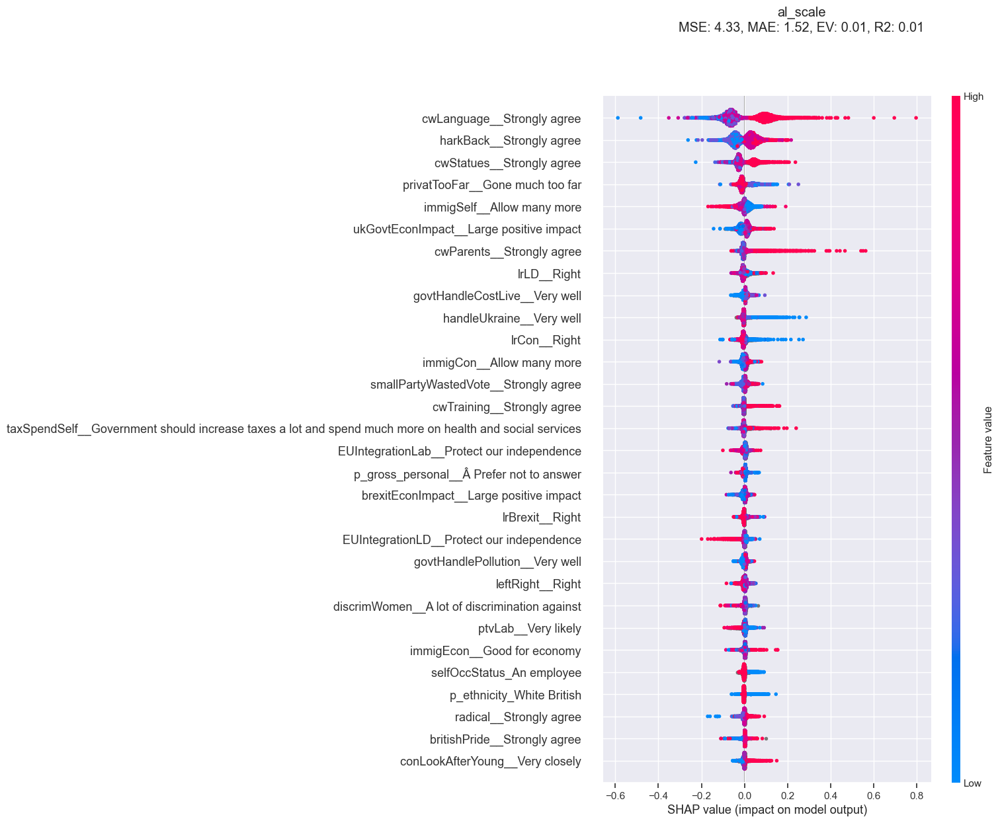

In [12]:
name = "al_scale__Diff"

title = "al_scale"
print(title)

(explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics) = xgboost_run(
    title = title,dataset=BES_reduced_with_naW25,
                                                    var_list = [name],
                                                    var_stub_list = [name,"al_scale","lr_scale",
                                                                     "al1","al2","al2","al3","al4","al5",
                                                                     "lr1","lr2","lr2","lr3","lr4","lr5",
                                                                    ],
                                                    verbosity=0)

<Axes: >

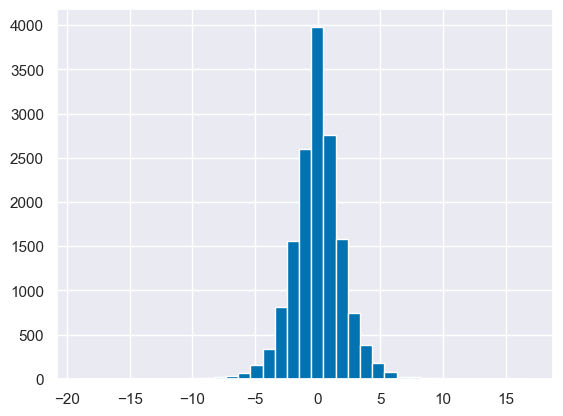

In [17]:
BES_reduced_with_naW25["al_scale__Diff"].hist(bins=37)

In [18]:
del BES_reduced_with_naW25["al_scale__Diff"]

In [19]:
search(BES_reduced_with_naW25,"lr_scale")

lr_scale__Right    26932
dtype: int64

In [20]:
BES_reduced_with_naW25["lr_scale__Diff"] = BES_reduced_with_naW25["lr_scale__Right"]-BES_reduced_with_naW23["lr_scale__Right"]

lr_scale
MSE: 5.62, MAE: 1.74, EV: 0.01, R2: 0.01


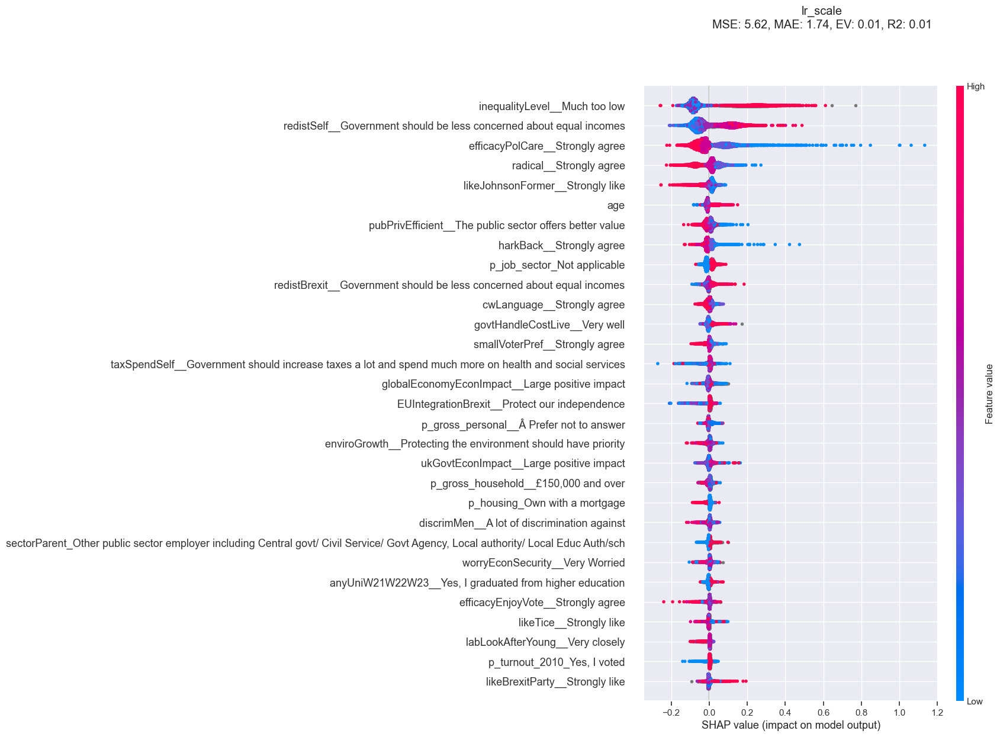

In [21]:
name = "lr_scale__Diff"

title = "lr_scale"
print(title)

(explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics) = xgboost_run(
    title = title,dataset=BES_reduced_with_naW25,
                                                    var_list = [name],
                                                    var_stub_list = [name,"al_scale","lr_scale",
                                                                     "al1","al2","al2","al3","al4","al5",
                                                                     "lr1","lr2","lr2","lr3","lr4","lr5",
                                                                    ],
                                                    verbosity=0)

# age predicts with Ec. Rightward shift
# inequalityLevel, redistSelf correlated with lr vals
# efficacyPolCare likewise/some overlap with Con govt specific judgement
# radical (and hardBack)
# **likeJohnsonFormer** correlates *with shifting left* 23->25

In [ ]:
# inequalityLevel, redistSelf (heavy correlates, expected that they'd predict ec right/left shifts )
    # pubPrivEfficient similar
# efficacyPolCare -> politicians don't care predicts left-ward shift, they do care -> right-ward shift
# radical -> agree left-ward shift (guess makes sense after 12/14 years of Tory govt?)
    # harkBack similar
# likeJohnsonFormer -> asked explicitly when he was no longer leader -> liking Johnson predicts *leftward shift*!
# age -> older predicts rightward shift

In [22]:
del BES_reduced_with_naW25["lr_scale__Diff"]

In [ ]:
# diffs so very noisy ...
# cwParents|Language|Statues
# immigSelf
# 

lr_scale
MSE: 9.32, MAE: 2.38, EV: 0.45, R2: 0.45


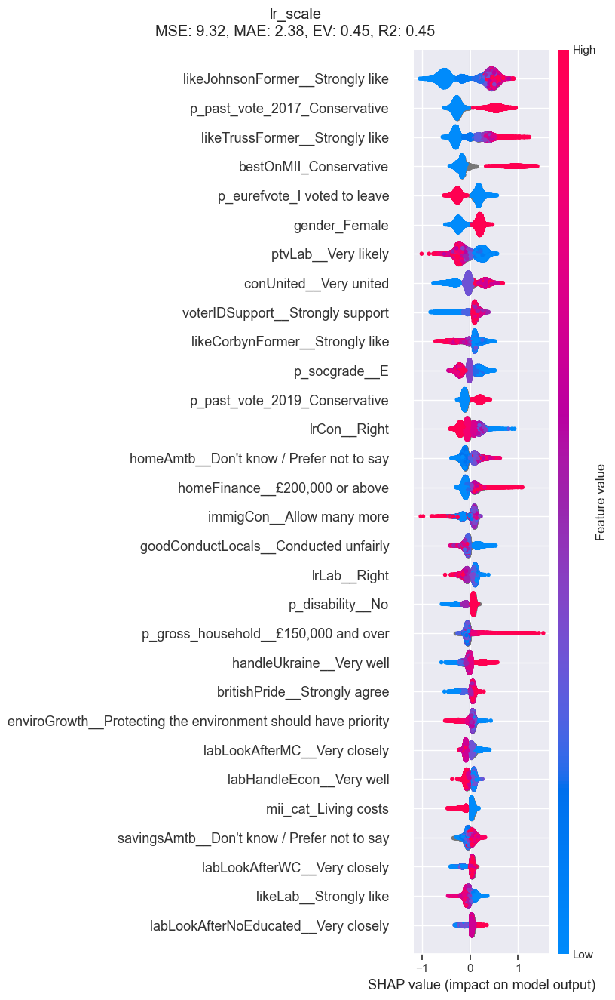

CPU times: total: 6min 22s
Wall time: 53 s


In [632]:
%%time
name = "lr_scale__Right"

title = "lr_scale"
print(title)

(explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics) = xgboost_run(
    title = title,dataset=BES_reduced_with_naW25,
                                                    var_list = [name],
                                                    var_stub_list = [name,"al_scale","lr_scale",
                                                                     "al1","al2","al2","al3","al4","al5",
                                                                     "lr1","lr2","lr2","lr3","lr4","lr5",
                                                                     "inequalityLevel",
                                                                     "privatTooFar","pubPrivEfficient",
                                                                     "efficacyPolCare","radical","harkBack",
                                                                     "conLookAfter","worryEconSecurity","riskPoverty",
                                                                     "trustMPs",
                                                                     "govtHandle",
                                                                     "cutsToo","subjClass",
                                                                     "leftRight","taxSpendSelf","nationalize",
                                                                     "cw","monarch","change","efficacy","ukGovt",
                                                                     "smallParty","econ","redist","discrim",
                                                                     "EconSecurityFuture","immigSelf","smallVoterPref",
                                                                     "enviroProtection","euID","natSecuritySpending",
                                                                     "renationaliseRail","riskUnemployment",
                                                                     
                                                                     "likeCon","ptvCon","likeSunak",
                                                                     "partyId","generalElectionVote","p_past_vote_2015",
                                                                    ],
                                                    verbosity=0)

#r2 == .67 with just al/lrd, al/lr_scales removed
# just 6 vars -> .58

lr_scale
MSE: 6.80, MAE: 2.02, EV: 0.58, R2: 0.58


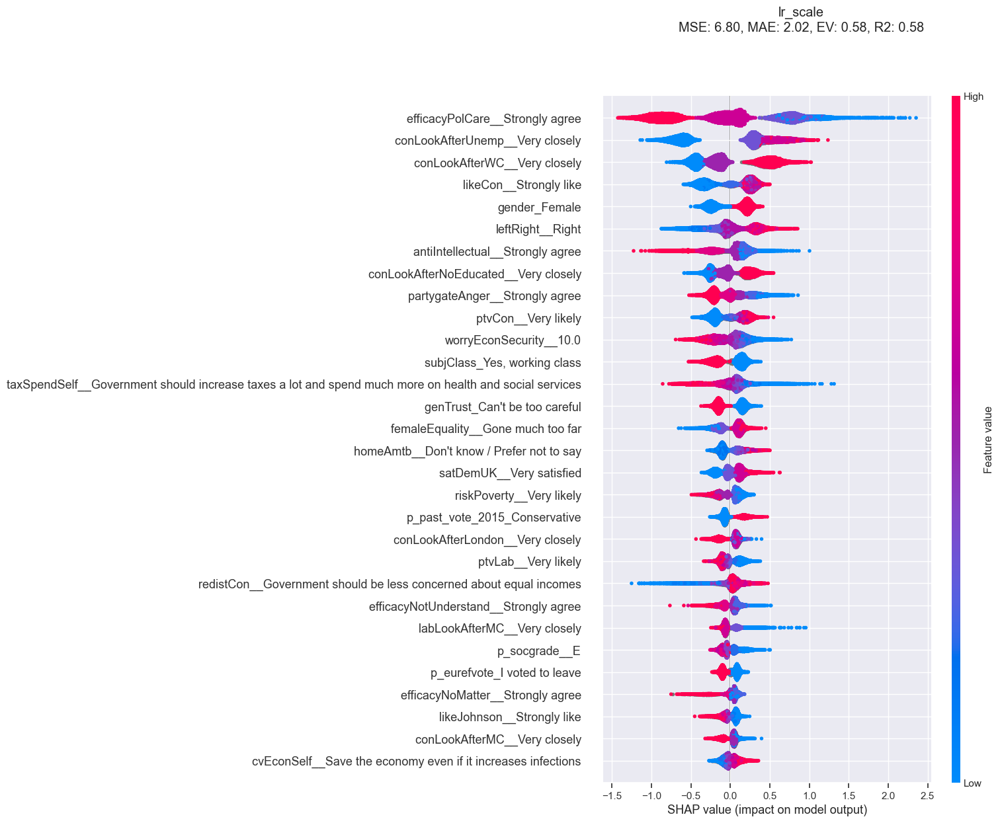

In [600]:
name = "lr_scale__Right"

title = "lr_scale"
print(title)

(explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics) = xgboost_run(
    title = title,dataset=BES_reduced_with_naW23,
                                                    var_list = [name],
                                                    var_stub_list = [name,"al_scale","lr_scale",
                                                                     "al1","al2","al2","al3","al4","al5",
                                                                     "lr1","lr2","lr2","lr3","lr4","lr5",
                                                                     
                                                                     "redistSelf","efficacyPolCare",
                                                                    ],
                                                    verbosity=0)

lr_scale
MSE: 8.07, MAE: 2.20, EV: 0.48, R2: 0.48


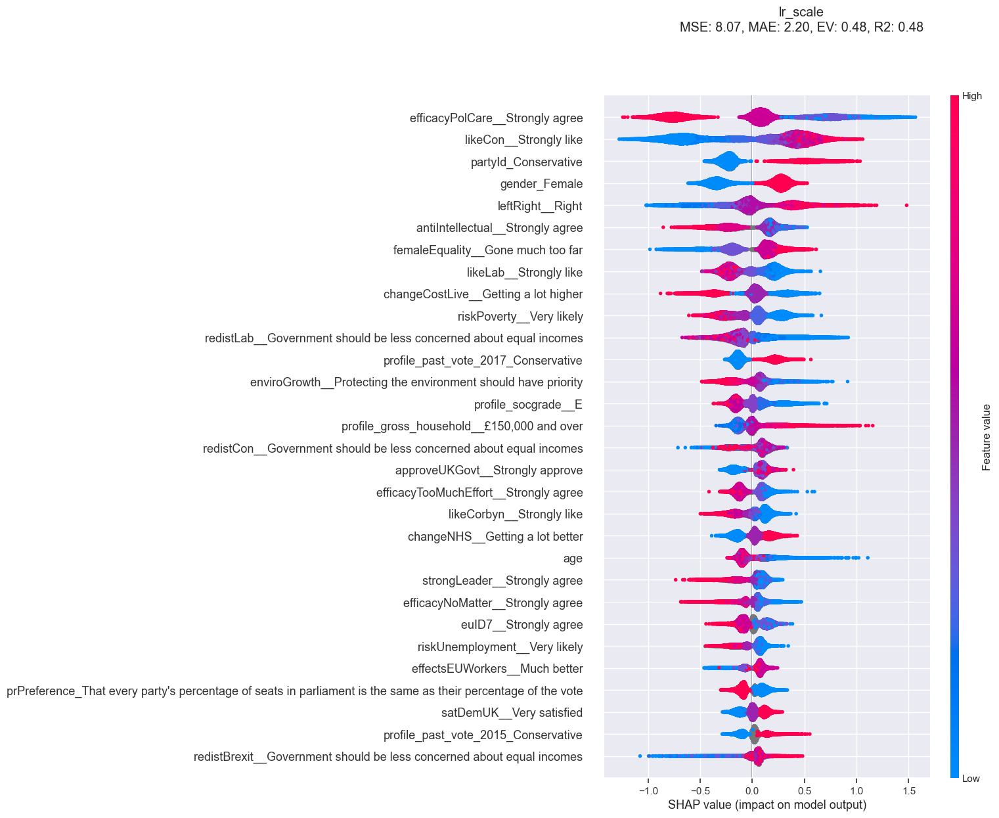

In [606]:
name = "lr_scale__Right"

title = "lr_scale"
print(title)

(explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics) = xgboost_run(
    title = title,dataset=BES_reduced_with_naW16,
                                                    var_list = [name],
                                                    var_stub_list = [name,"al_scale","lr_scale",
                                                                     "al1","al2","al2","al3","al4","al5",
                                                                     "lr1","lr2","lr2","lr3","lr4","lr5",
                                                                     "redistSelf"
                                                                    ],
                                                    verbosity=0)

In [ ]:
# inequalityLevel, redistSelf - heavy lr_scale correlates


In [604]:
search(BES_reduced_with_naW16,"lr_scale")

lr_scaleW10W11__Right    22536
dtype: int64

al_scale
MSE: 9.68, MAE: 2.46, EV: 0.56, R2: 0.56


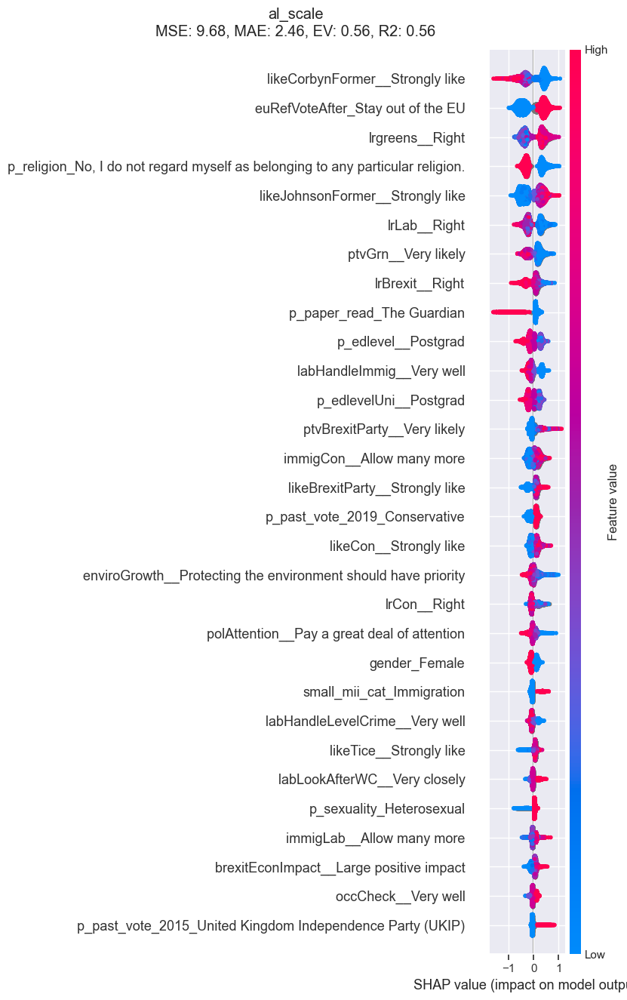

In [630]:
name = "al_scale__Authoritarian"

title = "al_scale"
print(title)

(explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics) = xgboost_run(
    title = title,dataset=BES_reduced_with_naW25,
                                                    var_list = [name],
                                                    var_stub_list = [name,"al_scale","lr_scale",
                                                                     "al1","al2","al2","al3","al4","al5",
                                                                     "lr1","lr2","lr2","lr3","lr4","lr5",
                                                                     "leftRight",
                                                                     "inequalityLevel",
                                                                     "privatTooFar","pubPrivEfficient",
                                                                     "efficacyPolCare","radical","harkBack",
                                                                     "conLookAfter","worryEconSecurity","riskPoverty",
                                                                     "trustMPs",
                                                                     "govtHandle",
                                                                     "cutsToo","subjClass",
                                                                     "leftRight","taxSpendSelf","nationalize",
                                                                     "cw","monarch","change","efficacy","ukGovt",
                                                                     "smallParty","econ","redist","discrim",
                                                                     "EconSecurityFuture","immigSelf","smallVoterPref",
                                                                     "enviroProtection","euID","natSecuritySpending",
                                                                     "renationaliseRail",
                                                                     
                                                                     "voterID","EUIntegration","europeanness","englishness",
                                                                     "deficitReduce","asylumMore","britishness",
                                                                     "britishPride",
                                                                     
                                                                     "p_eurefvote","age",
                                                                     
                                                                    ],
                                                    verbosity=0)

al_scale
MSE: 7.74, MAE: 2.19, EV: 0.65, R2: 0.65


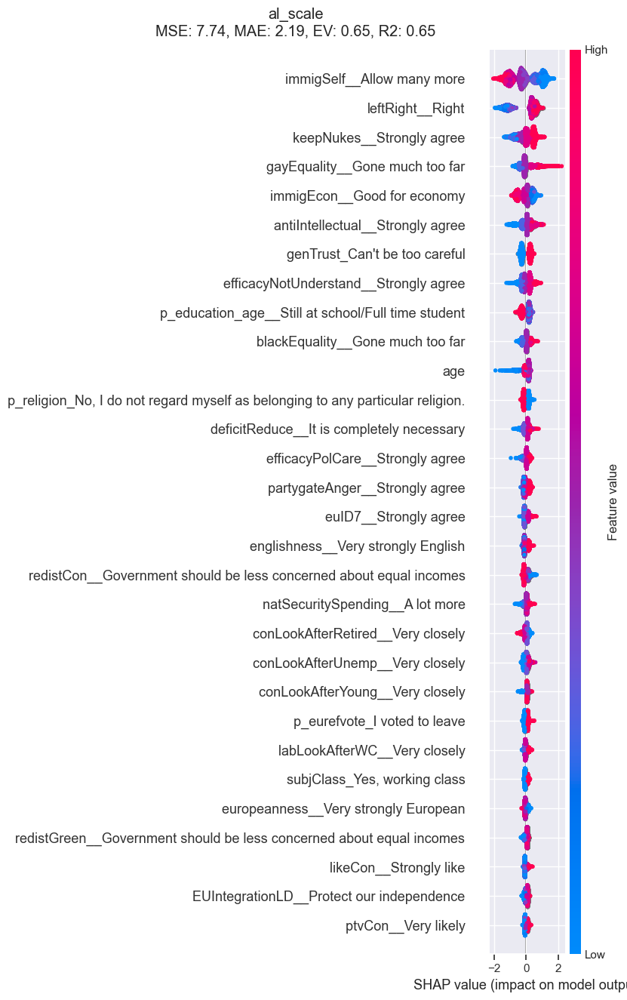

In [25]:
name = "al_scale__Authoritarian"

title = "al_scale"
print(title)

(explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics) = xgboost_run(
    title = title,dataset=BES_reduced_with_naW23,
                                                    var_list = [name],
                                                    var_stub_list = [name,"al_scale","lr_scale",
                                                                     "al1","al2","al2","al3","al4","al5",
                                                                     "lr1","lr2","lr2","lr3","lr4","lr5",
                                                                     "leftRight"
                                                                    ],
                                                    verbosity=0)

al_scale
MSE: 7.38, MAE: 2.13, EV: 0.63, R2: 0.63


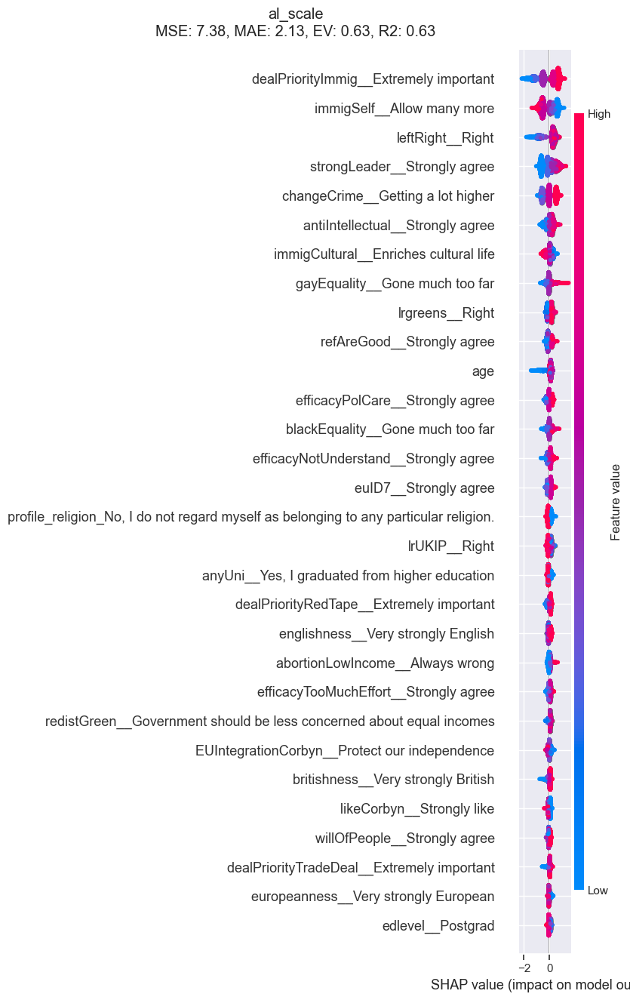

In [33]:
name = "al_scale__Authoritarian"

title = "al_scale"
print(title)

(explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics) = xgboost_run(
    title = title,dataset=BES_reduced_with_naW16,
                                                    var_list = [name],
                                                    var_stub_list = [name,"al_scale","lr_scale",
                                                                     "al1","al2","al2","al3","al4","al5",
                                                                     "lr1","lr2","lr2","lr3","lr4","lr5",
                                                                    ],
                                                    verbosity=0)

In [ ]:
### we're probably not looking to *attitudinal* variables (certainly not if they could have acquiescence bias)

In [ ]:
### trust changes

In [156]:
search(BES_PanelW23,"past_vote")

p_past_vote_2010    19988
p_past_vote_2005    18482
p_past_vote_2015    25230
p_past_vote_2017    25580
p_past_vote_2019    26608
dtype: int64

In [ ]:
## variables in both plots

## approveUKGovt only in W21
## leftRight in both datasets, only appears in W23 predictors

## gender, likeCon, likeJohnson, satDemUK, efficacyPolCare, al_scale__Au
## ptvCon/Lab appears in one but not other


# W23/25 pandemicEconImpact / ukGovtEconImpact

trustMPsDiff
MSE: 1.23, MAE: 0.83, EV: 0.08, R2: 0.08


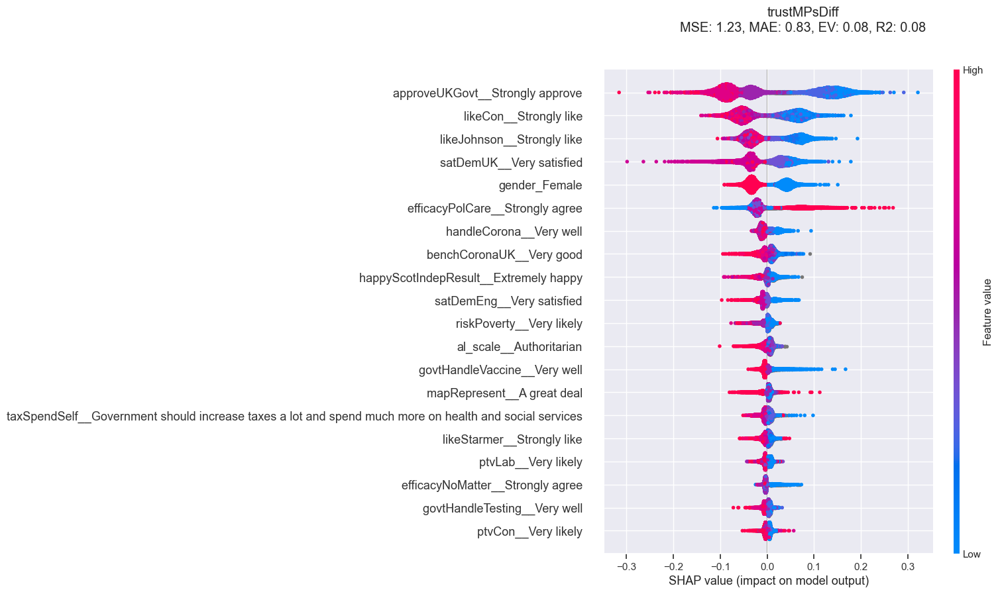

In [73]:
name = "trustMPsDiff"

title = "trustMPsDiff"
print(title)

BES_reduced_with_naW21["trustMPsDiff"] = BES_reduced_with_naW23["trustMPs__A great deal of trust"]\
    - BES_reduced_with_naW21["trustMPs__A great deal of trust"]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics) = xgboost_run(
    title = title,dataset=BES_reduced_with_naW21,
                                                    var_list = [name],
                                                    var_stub_list = [name,"trustMPs"
                                                                    ],
                                                    verbosity=0,min_features=20)

trustMPsDiff
MSE: 1.25, MAE: 0.84, EV: 0.07, R2: 0.07


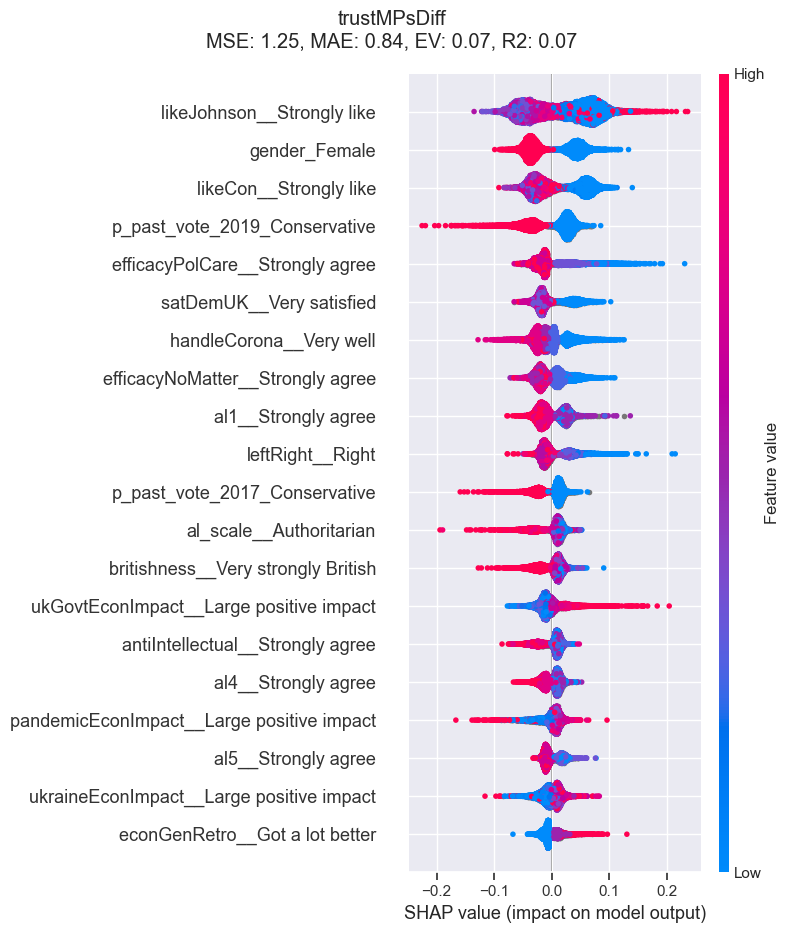

In [66]:
name = "trustMPsDiff"

title = "trustMPsDiff"
print(title)

BES_reduced_with_naW23["trustMPsDiff"] = BES_reduced_with_naW23["trustMPs__A great deal of trust"]\
    - BES_reduced_with_naW21["trustMPs__A great deal of trust"]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics) = xgboost_run(
    title = title,dataset=BES_reduced_with_naW23,
                                                    var_list = [name],
                                                    var_stub_list = [name,"trustMPs"
                                                                    ],
                                                    verbosity=0,min_features=20)

MSE: 1.35, MAE: 0.91, EV: 0.03, R2: 0.03


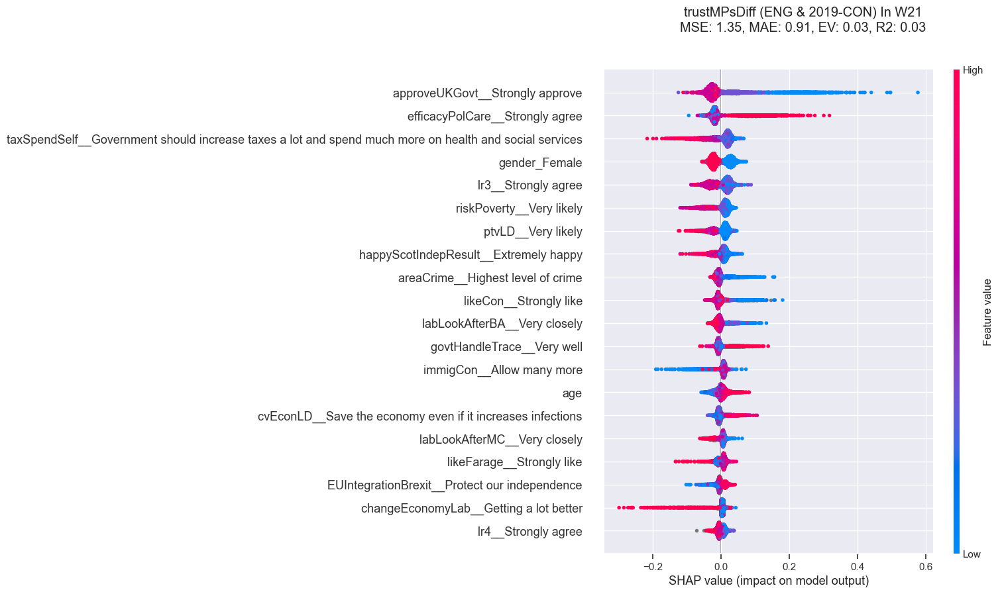

In [168]:
name = "trustMPsDiff"

title = "trustMPsDiff (ENG & 2019-CON) In W21"
# print(title)
mask = (BES_PanelW21["country"]=="England") & (BES_PanelW21["p_past_vote_2019"]=="Conservative")

BES_reduced_with_naW21["trustMPsDiff"] = BES_reduced_with_naW23["trustMPs__A great deal of trust"]\
    - BES_reduced_with_naW21["trustMPs__A great deal of trust"]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics) = xgboost_run(
    title = title,dataset=BES_reduced_with_naW21[mask],
                                                    var_list = [name],
                                                    var_stub_list = [name,"trustMPs"
                                                                    ],
                                                    verbosity=0,min_features=20)

trustMPsDiff (ENG & 2019-CON) In W23
MSE: 1.32, MAE: 0.90, EV: 0.04, R2: 0.04


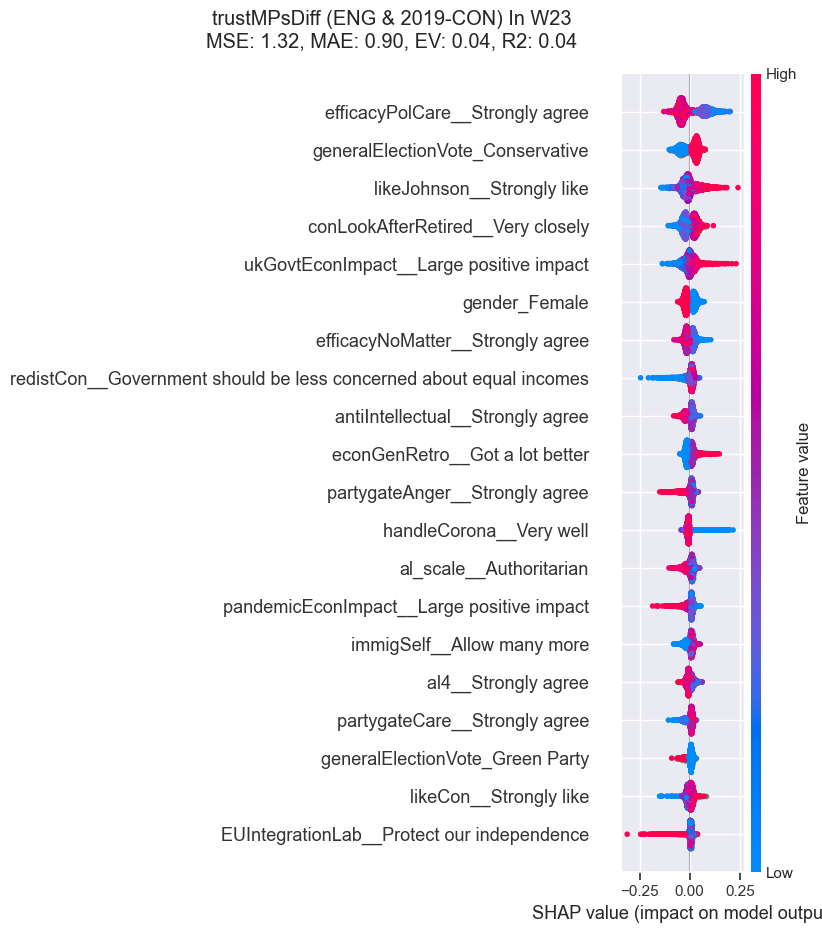

In [169]:
name = "trustMPsDiff"

title = "trustMPsDiff (ENG & 2019-CON) In W23"
print(title)
mask = (BES_PanelW23["country"]=="England") & (BES_PanelW23["p_past_vote_2019"]=="Conservative")
BES_reduced_with_naW23["trustMPsDiff"] = BES_reduced_with_naW23["trustMPs__A great deal of trust"]\
    - BES_reduced_with_naW21["trustMPs__A great deal of trust"]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics) = xgboost_run(
    title = title,dataset=BES_reduced_with_naW23[mask],
                                                    var_list = [name],
                                                    var_stub_list = [name,"trustMPs"
                                                                    ],
                                                    verbosity=0,min_features=20)

MSE: 1.37, MAE: 0.91, EV: 0.02, R2: 0.02


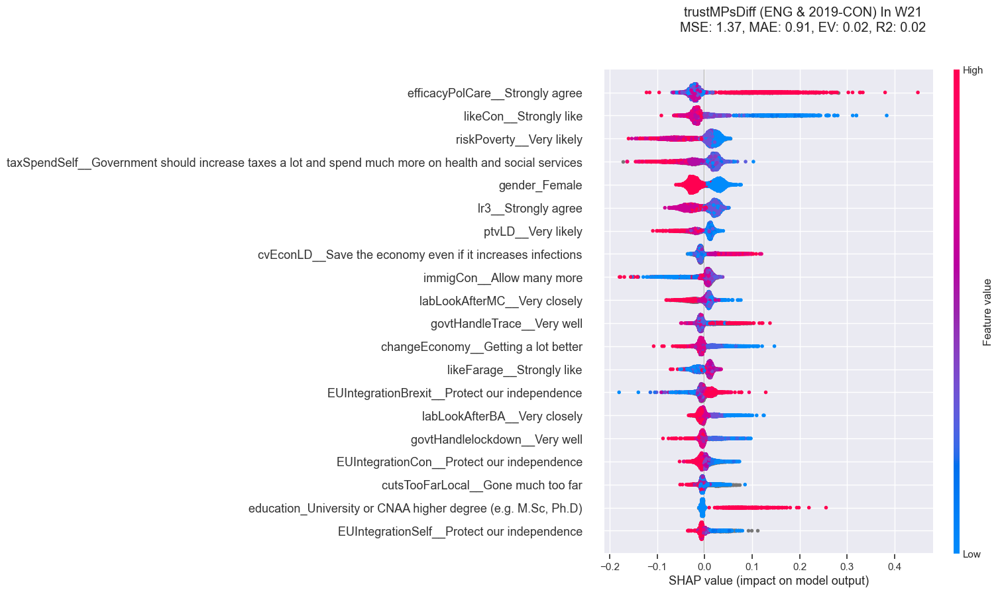

In [188]:
name = "trustMPsDiff"

title = "trustMPsDiff (ENG & 2019-CON) In W21"
# print(title)
mask = (BES_PanelW21["country"]=="England") & (BES_PanelW21["p_past_vote_2019"]=="Conservative")

BES_reduced_with_naW21["trustMPsDiff"] = BES_reduced_with_naW23["trustMPs__A great deal of trust"]\
    - BES_reduced_with_naW21["trustMPs__A great deal of trust"]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics) = xgboost_run(
    title = title,dataset=BES_reduced_with_naW21[mask],
                                                    var_list = [name],
                                                    var_stub_list = [name,"trustMPs","approveUKGovt", "happyScotIndep", "areaCrime", 
                                                                    "benchCorona","changeEconomyLab",
                                                                    
                                                                    ],
                                                    verbosity=0,min_features=20)

In [192]:
BES_reduced_with_naW21_W23 = BES_reduced_with_naW23.copy()
BES_reduced_with_naW21_W23.columns = [x+"W23" for x in BES_reduced_with_naW21_W23.columns]
BES_reduced_with_naW21_W23[[x+"W21" for x in BES_reduced_with_naW21.columns]] = BES_reduced_with_naW21
BES_reduced_with_naW21_W23 = BES_reduced_with_naW21_W23[(BES_reduced_with_naW21_W23[["country_EnglandW21","country_EnglandW21"]]==1.0).all(axis=1)]


In [196]:
BES_reduced_with_naW21

,turnoutUKGeneral__Very likely that I will vote,partyIdStrength__Not very strong,polAttention__Pay a great deal of attention,pidWeThey__Strongly agree,pidInterestedOthers__Strongly agree,pidCriticiseParty__Strongly agree,pidCommonParty__Strongly agree,pidConnected__Strongly agree,pidPraiseGood__Strongly agree,pidWeTheyb__Strongly agree,...,responsibleCorona_11_Yes,responsibleCorona_8_Yes,responsibleCorona_7_Yes,responsibleCorona_6_Yes,responsibleCorona_1_Yes,responsibleEconNone_Yes,responsibleEconOther_Yes,responsibleEconBrexit_Yes,responsibleCorona_2_Yes,trustMPsDiff
id,,,,,,,,,,,,,,,,,,,,,
2,4.0,2.0,8.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,-2.0
7,4.0,1.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,NaN
14,4.0,0.0,9.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,NaN,0.0
15,3.0,1.0,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,-1.0
18,4.0,2.0,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,NaN,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106078,4.0,1.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,NaN
106079,4.0,1.0,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,0.0
106080,4.0,1.0,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,NaN,0.0


MSE: 1.23, MAE: 0.86, EV: 0.11, R2: 0.11


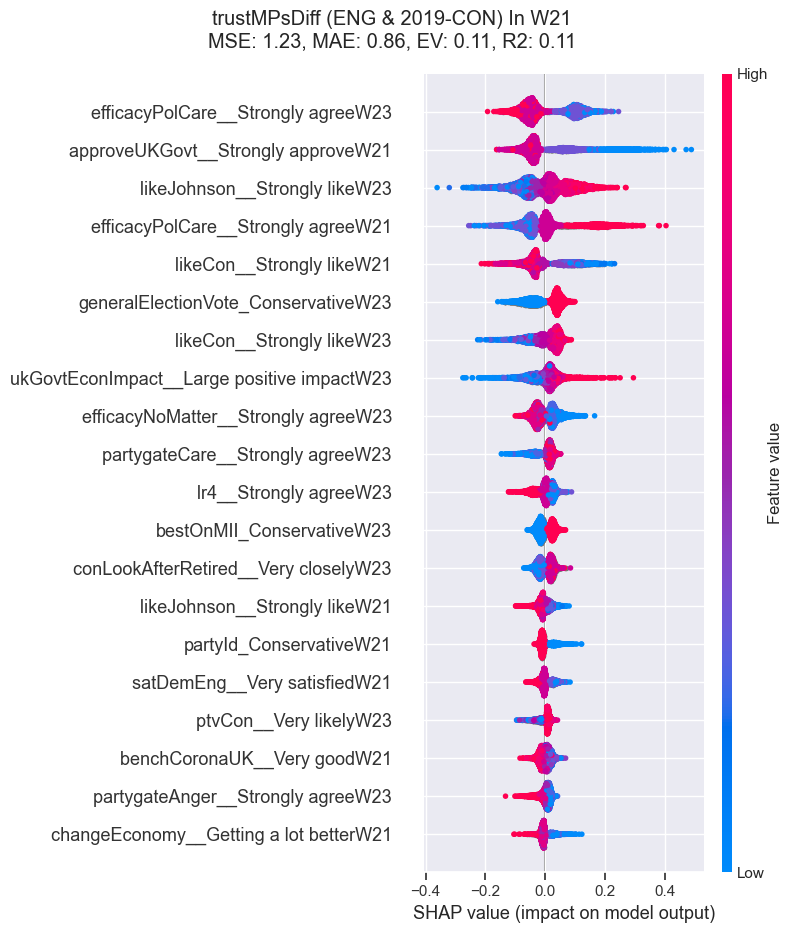

In [226]:
name = "trustMPsDiff"

title = "trustMPsDiff (ENG & 2019-CON) In W21"
# print(title)
mask = (BES_reduced_with_naW21_W23[search(BES_reduced_with_naW21_W23,"p_past_vote_2019_Conservative").index]==1.0).all(axis=1)

# BES_reduced_with_naW21["trustMPsDiff"] = BES_reduced_with_naW23["trustMPs__A great deal of trust"]\
#     - BES_reduced_with_naW21["trustMPs__A great deal of trust"]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics) = xgboost_run(
    title = title,dataset=BES_reduced_with_naW21_W23[mask],
                                                    var_list = [name],
                                                    var_stub_list = [name,"trustMPs",
#                                                                      "approveUKGovt", "happyScotIndep", "areaCrime", 
#                                                                     "benchCorona","changeEconomyLab",
                                                                    
                                                                    ],
                                                    verbosity=0,min_features=20)

In [236]:
# efficacyPolCare, likeJohnson, likeCon, ptvCon,
BES_reduced_with_naW21_W23["efficacyPolCareDiff"] = BES_reduced_with_naW21_W23["efficacyPolCare__Strongly agreeW23"] \
    - BES_reduced_with_naW21_W23["efficacyPolCare__Strongly agreeW21"]
BES_reduced_with_naW21_W23["likeJohnsonDiff"] = BES_reduced_with_naW21_W23["likeJohnson__Strongly likeW23"] \
    - BES_reduced_with_naW21_W23["likeJohnson__Strongly likeW21"]
BES_reduced_with_naW21_W23["likeConDiff"] = BES_reduced_with_naW21_W23["likeCon__Strongly likeW23"] \
    - BES_reduced_with_naW21_W23["likeCon__Strongly likeW21"]
BES_reduced_with_naW21_W23["ptvConDiff"] = BES_reduced_with_naW21_W23["ptvCon__Very likelyW23"] \
    - BES_reduced_with_naW21_W23["ptvCon__Very likelyW21"]
BES_reduced_with_naW21_W23["lr4Diff"] = BES_reduced_with_naW21_W23["lr4__Strongly agreeW23"] \
    - BES_reduced_with_naW21_W23["lr4__Strongly agreeW21"]
BES_reduced_with_naW21_W23["efficacyNoMatteDiff"] = BES_reduced_with_naW21_W23["efficacyNoMatter__Strongly agreeW23"] \
    - BES_reduced_with_naW21_W23["efficacyNoMatter__Strongly agreeW21"]
search(BES_reduced_with_naW21_W23,"efficacyNoMatter")

efficacyNoMatter__Strongly agreeW23    14283
efficacyNoMatter__Strongly agreeW21    14374
dtype: int64

MSE: 1.24, MAE: 0.87, EV: 0.10, R2: 0.10


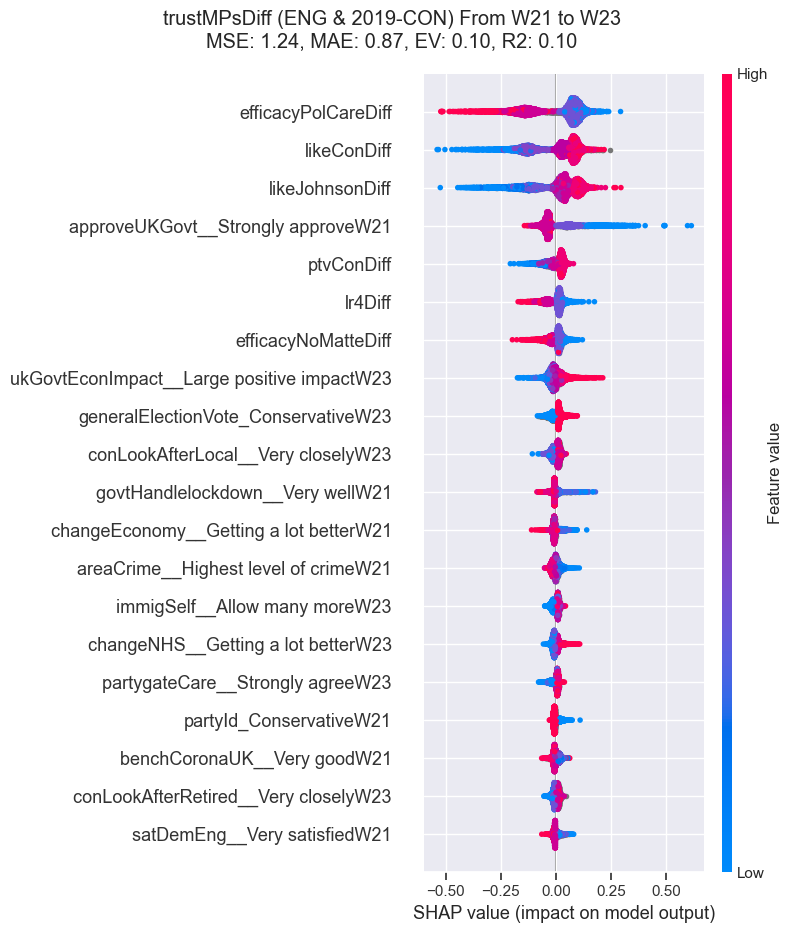

In [252]:
name = "trustMPsDiff"

title = "trustMPsDiff (ENG & 2019-CON) From W21 to W23"
# print(title)
mask = (BES_reduced_with_naW21_W23[search(BES_reduced_with_naW21_W23,"p_past_vote_2019_Conservative").index]==1.0).all(axis=1)




# BES_reduced_with_naW21["trustMPsDiff"] = BES_reduced_with_naW23["trustMPs__A great deal of trust"]\
#     - BES_reduced_with_naW21["trustMPs__A great deal of trust"]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics) = xgboost_run(
    title = title,dataset=BES_reduced_with_naW21_W23[mask],
                                                    var_list = [name],
                                                    var_stub_list = [name,"trustMPs",
#                                                                      "approveUKGovt", "happyScotIndep", "areaCrime", 
#                                                                     "benchCorona","changeEconomyLab",
#                                                                      "approveUKGovt","ukGovtEcon",
                                                                    "likeCon__","efficacyPolCare__","efficacyNoMatter__",
                                                                     "lr4__","likeJohnson__","ptvCon__","likeCon__","lr_scale",
                                                                    ],
                                                    verbosity=0,min_features=20)

MSE: 1.04, MAE: 0.74, EV: 0.12, R2: 0.12


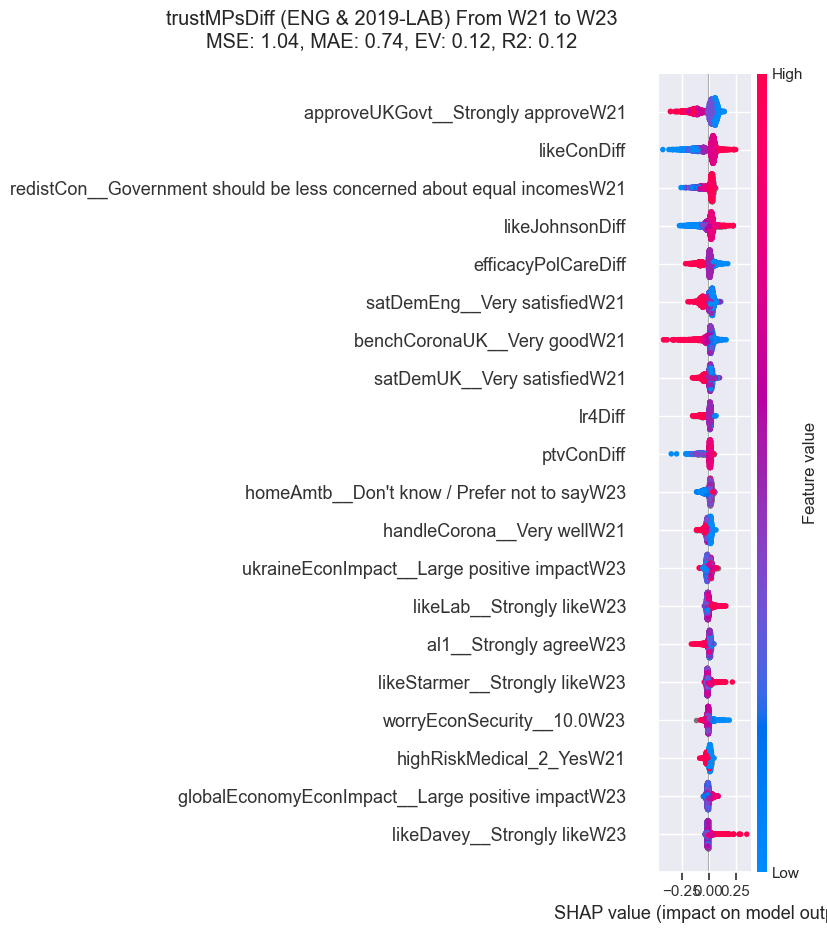

In [245]:
name = "trustMPsDiff"

title = "trustMPsDiff (ENG & 2019-LAB) From W21 to W23"
# print(title)
mask = (BES_reduced_with_naW21_W23[search(BES_reduced_with_naW21_W23,"p_past_vote_2019_Labour").index]==1.0).all(axis=1)




# BES_reduced_with_naW21["trustMPsDiff"] = BES_reduced_with_naW23["trustMPs__A great deal of trust"]\
#     - BES_reduced_with_naW21["trustMPs__A great deal of trust"]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics) = xgboost_run(
    title = title,dataset=BES_reduced_with_naW21_W23[mask],
                                                    var_list = [name],
                                                    var_stub_list = [name,"trustMPs",
#                                                                      "approveUKGovt", "happyScotIndep", "areaCrime", 
#                                                                     "benchCorona","changeEconomyLab",
#                                                                      "approveUKGovt","ukGovtEcon",
                                                                    "likeCon__","efficacyPolCare__","efficacyNoMatter__",
                                                                     "lr4__","likeJohnson__","ptvCon__","likeCon__","lr_scale",
                                                                    ],
                                                    verbosity=0,min_features=20)

MSE: 1.21, MAE: 0.82, EV: 0.05, R2: 0.05


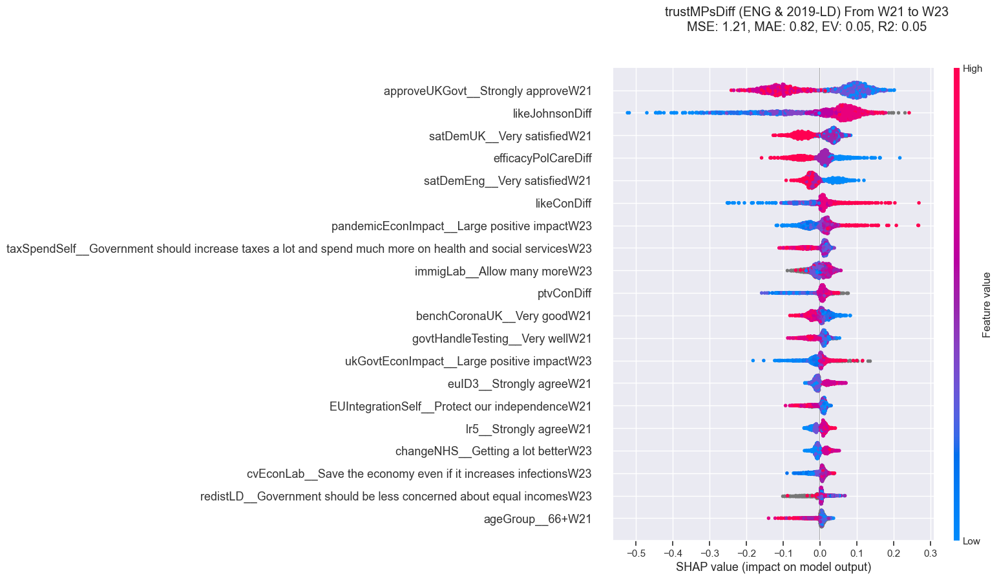

In [244]:
name = "trustMPsDiff"

title = "trustMPsDiff (ENG & 2019-LD) From W21 to W23"
# print(title)
mask = (BES_reduced_with_naW21_W23[search(BES_reduced_with_naW21_W23,"p_past_vote_2019_Liberal Democrat").index]==1.0).all(axis=1)




# BES_reduced_with_naW21["trustMPsDiff"] = BES_reduced_with_naW23["trustMPs__A great deal of trust"]\
#     - BES_reduced_with_naW21["trustMPs__A great deal of trust"]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics) = xgboost_run(
    title = title,dataset=BES_reduced_with_naW21_W23[mask],
                                                    var_list = [name],
                                                    var_stub_list = [name,"trustMPs",
#                                                                      "approveUKGovt", "happyScotIndep", "areaCrime", 
#                                                                     "benchCorona","changeEconomyLab",
#                                                                      "approveUKGovt","ukGovtEcon",
                                                                    "likeCon__","efficacyPolCare__","efficacyNoMatter__",
                                                                     "lr4__","likeJohnson__","ptvCon__","likeCon__","lr_scale",
                                                                    ],
                                                    verbosity=0,min_features=20)

In [200]:
BES_reduced_with_naW21_W23["trustMPsDiff"]=BES_reduced_with_naW21_W23["trustMPsDiffW23"]
BES_reduced_with_naW21_W23.drop(["trustMPsDiffW23","trustMPsDiffW21",],axis=1,inplace=True)
BES_reduced_with_naW21_W23 = BES_reduced_with_naW21_W23[BES_reduced_with_naW21_W23["trustMPsDiff"].notnull()]

In [256]:
BES_reduced_with_naW23_W25 = BES_reduced_with_naW25.copy()
BES_reduced_with_naW23_W25.columns = [x+"W25" for x in BES_reduced_with_naW23_W25.columns]
BES_reduced_with_naW23_W25[[x+"W23" for x in BES_reduced_with_naW23.columns]] = BES_reduced_with_naW23
BES_reduced_with_naW23_W25 = BES_reduced_with_naW23_W25[(BES_reduced_with_naW23_W25[["country_EnglandW23","country_EnglandW25"]]==1.0).all(axis=1)]


In [259]:
search(BES_reduced_with_naW23_W25,"trustMPs")

BES_reduced_with_naW23_W25.drop("trustMPsDiffW23",axis=1,inplace=True)

BES_reduced_with_naW23_W25["trustMPsDiff"] = BES_reduced_with_naW23_W25["trustMPs__A great deal of trustW25"] -\
    BES_reduced_with_naW23_W25["trustMPs__A great deal of trustW23"]

MSE: 1.13, MAE: 0.78, EV: 0.12, R2: 0.12


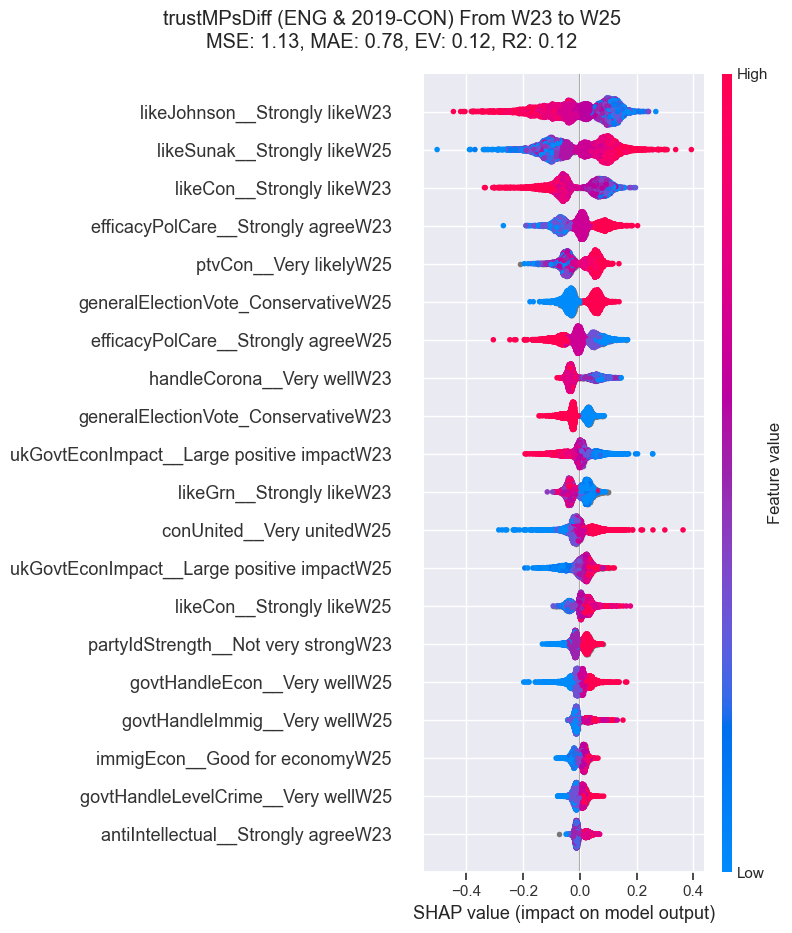

In [260]:
name = "trustMPsDiff"

title = "trustMPsDiff (ENG & 2019-CON) From W23 to W25"
# print(title)
mask = (BES_reduced_with_naW23_W25[search(BES_reduced_with_naW23_W25,"p_past_vote_2019_Conservative").index]==1.0).all(axis=1)




# BES_reduced_with_naW21["trustMPsDiff"] = BES_reduced_with_naW23["trustMPs__A great deal of trust"]\
#     - BES_reduced_with_naW21["trustMPs__A great deal of trust"]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics) = xgboost_run(
    title = title,dataset=BES_reduced_with_naW23_W25[mask],
                                                    var_list = [name],
                                                    var_stub_list = [name,"trustMPs",
#                                                                      "approveUKGovt", "happyScotIndep", "areaCrime", 
#                                                                     "benchCorona","changeEconomyLab",
#                                                                      "approveUKGovt","ukGovtEcon",
#                                                                     "likeCon__","efficacyPolCare__","efficacyNoMatter__",
#                                                                      "lr4__","likeJohnson__","ptvCon__","likeCon__","lr_scale",
                                                                    ],
                                                    verbosity=0,min_features=20)

MSE: 0.97, MAE: 0.69, EV: 0.01, R2: 0.01


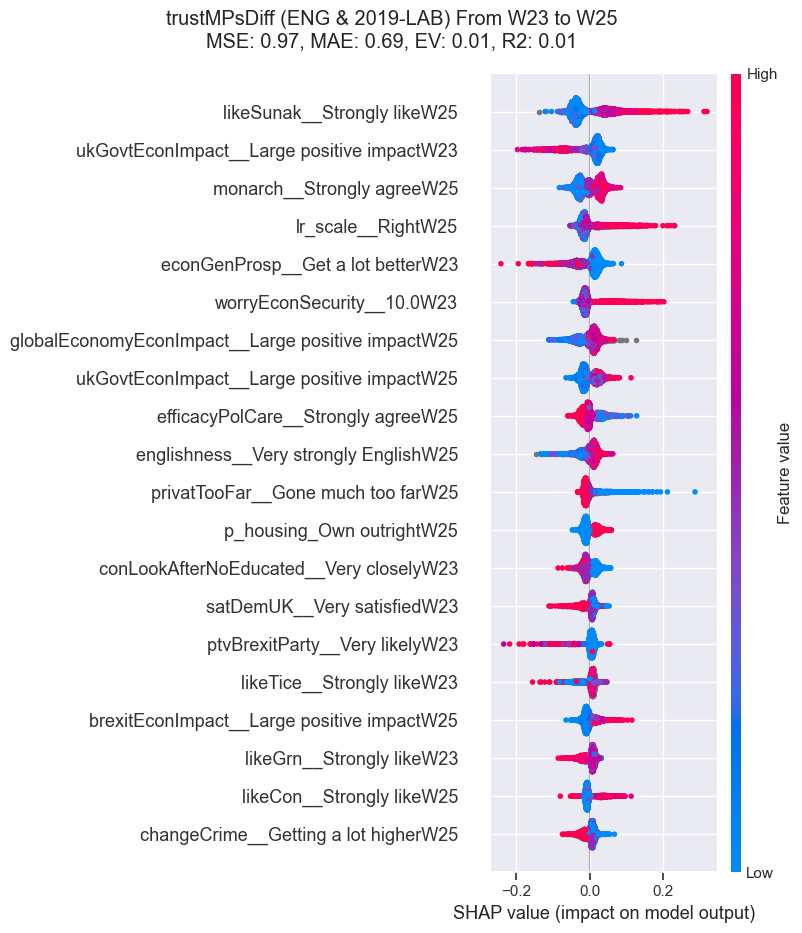

In [261]:
name = "trustMPsDiff"

title = "trustMPsDiff (ENG & 2019-LAB) From W23 to W25"
# print(title)
mask = (BES_reduced_with_naW23_W25[search(BES_reduced_with_naW23_W25,"p_past_vote_2019_Labour").index]==1.0).all(axis=1)




# BES_reduced_with_naW21["trustMPsDiff"] = BES_reduced_with_naW23["trustMPs__A great deal of trust"]\
#     - BES_reduced_with_naW21["trustMPs__A great deal of trust"]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics) = xgboost_run(
    title = title,dataset=BES_reduced_with_naW23_W25[mask],
                                                    var_list = [name],
                                                    var_stub_list = [name,"trustMPs",
#                                                                      "approveUKGovt", "happyScotIndep", "areaCrime", 
#                                                                     "benchCorona","changeEconomyLab",
#                                                                      "approveUKGovt","ukGovtEcon",
#                                                                     "likeCon__","efficacyPolCare__","efficacyNoMatter__",
#                                                                      "lr4__","likeJohnson__","ptvCon__","likeCon__","lr_scale",
                                                                    ],
                                                    verbosity=0,min_features=20)

In [269]:
# name = "trustMPsDiff"

# title = "trustMPsDiff (ENG & 2019-LD) From W23 to W25"
# # print(title)
# mask = (BES_reduced_with_naW23_W25[search(BES_reduced_with_naW23_W25,"p_past_vote_2019_Liberal Democrat").index]==1.0).all(axis=1)




# # BES_reduced_with_naW21["trustMPsDiff"] = BES_reduced_with_naW23["trustMPs__A great deal of trust"]\
# #     - BES_reduced_with_naW21["trustMPs__A great deal of trust"]

# (explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics) = xgboost_run(
#     title = title,dataset=BES_reduced_with_naW23_W25[mask],
#                                                     var_list = [name],
#                                                     var_stub_list = [name,"trustMPs",
# #                                                                      "approveUKGovt", "happyScotIndep", "areaCrime", 
# #                                                                     "benchCorona","changeEconomyLab",
# #                                                                      "approveUKGovt","ukGovtEcon",
# #                                                                     "likeCon__","efficacyPolCare__","efficacyNoMatter__",
# #                                                                      "lr4__","likeJohnson__","ptvCon__","likeCon__","lr_scale",
#                                                                     ],
#                                                     verbosity=0,min_features=20)

In [277]:
search(BES_PanelW25_comb,"country|wt_new_W21")

wt_new_W21                     30281
abroadCountry_1W8               5258
abroadCountry_2W8               5258
motherCountryBornW8            24295
fatherCountryBornW8            24295
automationEffectsCountryW16     9330
environCountrysideW25           7636
countryW1                      30587
countryW2                      30221
countryW3                      28104
countryW4                      31552
countryW5                      30809
countryW6                      30131
countryW7                      30895
countryW8                      33502
countryW9                      30036
countryW10                     30214
countryW11                     30956
countryW12                     34394
countryW13                     31114
countryW14                     31063
countryW15                     30842
countryW16                     37959
countryW17                     34366
countryW18                     37825
countryW19                     32177
countryW20                     31468
c

In [279]:
for wave in ["W21","W22","W23"]:

    mask = BES_PanelW25_comb["p_past_vote_2019"]=="Conservative"
    mask = mask&(BES_PanelW25_comb["country"+wave]=="England")

    print( np.mean(BES_PanelW25_comb["likeJohnson"+wave][mask].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)\
        *BES_PanelW25_comb["wt_new_"+wave][mask]) )

6.5490853126463024
5.210310310521731
5.174045810381109


In [280]:
for wave in ["W21","W22","W23"]:

    mask = BES_PanelW25_comb["p_past_vote_2019"]=="Conservative"
    mask = mask&(BES_PanelW25_comb["country"+wave]=="England")

    print( np.mean(BES_PanelW25_comb["ptvCon"+wave][mask].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)\
        *BES_PanelW25_comb["wt_new_"+wave][mask]) )

7.628820962846959
6.747320957845004
6.697317093943311


In [281]:
for wave in ["W21","W22","W23"]:

    mask = BES_PanelW25_comb["p_past_vote_2019"]=="Conservative"
    mask = mask&(BES_PanelW25_comb["country"+wave]=="England")

    print( np.mean(BES_PanelW25_comb["likeCon"+wave][mask].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)\
        *BES_PanelW25_comb["wt_new_"+wave][mask]) )

6.560324892710201
5.641117044167234
5.5777723860718345


In [282]:
for wave in ["W21","W22","W23"]:

    mask = BES_PanelW25_comb["p_past_vote_2019"]=="Conservative"
    mask = mask&(BES_PanelW25_comb["country"+wave]=="England")

    print( np.mean(BES_PanelW25_comb["lr4"+wave][mask].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)\
        *BES_PanelW25_comb["wt_new_"+wave][mask]) )

2.266872525926866
2.420866034991886
2.5035297429875025


In [283]:
search(BES_PanelW25_comb,"start")

starttimeW1     30590
starttimeW2     30895
starttimeW3     28574
starttimeW4     31552
starttimeW5     30970
starttimeW6     30258
starttimeW7     30895
starttimeW8     33502
starttimeW9     30036
starttimeW10    30237
starttimeW11    30956
starttimeW12    34394
starttimeW13    31135
starttimeW14    31063
starttimeW15    30842
starttimeW16    37959
starttimeW17    34366
starttimeW18    37825
starttimeW19    32177
starttimeW20    31468
starttimeW21    30281
starttimeW22    28113
starttimeW23    30949
starttimeW24    15439
starttimeW25    30407
dtype: int64

In [285]:
BES_PanelW25_comb["starttimeW22"].dropna().sort_values()

# woah - partyGate drops on 30th November! so in the middle of this 

id
73971    2021-11-26 13:03:46.340
97181    2021-11-26 13:03:59.819
62368    2021-11-26 13:05:25.970
43795    2021-11-26 13:06:06.667
674      2021-11-26 13:06:20.479
                   ...          
104576   2021-12-15 14:13:41.591
105275   2021-12-15 14:17:22.735
88403    2021-12-15 14:19:43.570
94179    2021-12-15 14:31:27.144
45633    2021-12-15 14:37:28.905
Name: starttimeW22, Length: 28113, dtype: datetime64[ns]

In [287]:
BES_PanelW25_comb["endtimeW22"].dropna().sort_values()

id
97181    2021-11-26 13:13:41.582
62368    2021-11-26 13:16:54.418
12318    2021-11-26 13:18:13.308
73971    2021-11-26 13:20:14.328
88527    2021-11-26 13:20:22.451
                   ...          
106164   2021-12-15 14:37:02.223
88403    2021-12-15 14:42:49.410
104576   2021-12-15 14:43:56.043
94179    2021-12-15 14:47:39.853
45633    2021-12-15 14:50:07.437
Name: endtimeW22, Length: 28113, dtype: datetime64[ns]

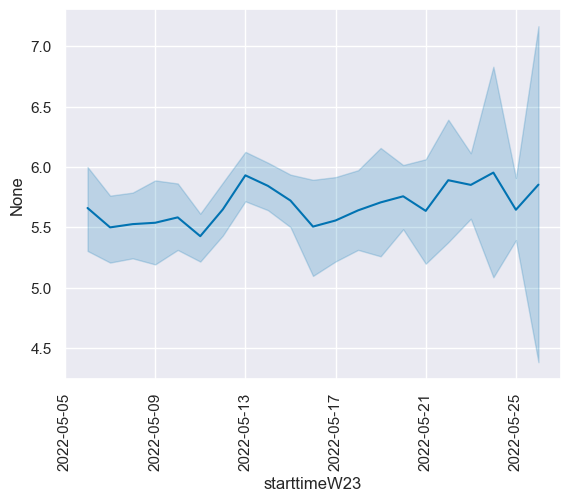

In [303]:
wave = "W23"
mask = BES_PanelW25_comb["p_past_vote_2019"]=="Conservative"
mask = mask&(BES_PanelW25_comb["country"+wave]=="England")

sns.lineplot(x=BES_PanelW25_comb["starttime"+wave][mask].dt.date,
             y=BES_PanelW25_comb["likeJohnson"+wave][mask].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan),
            weights = BES_PanelW25_comb["wt_new_"+wave][mask]);
plt.xticks(rotation=90);

In [506]:
pd.qcut(BES_PanelW25_comb["starttime"+wave][mask],q=20)[2].mid# + pd.qcut(BES_PanelW25_comb["starttime"+wave][mask],q=20)[2].right

Timestamp('2021-12-03 18:21:01.170200064')

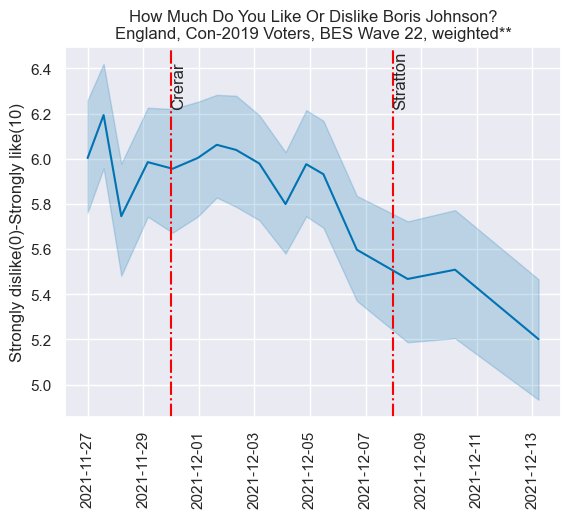

In [564]:
wave = "W22"
var_name = "likeJohnson"
q=16
mask = BES_PanelW25_comb["p_past_vote_2019"]=="Conservative"
mask = mask&(BES_PanelW25_comb["country"+wave]=="England")


y_var = BES_PanelW25_comb[var_name+wave][mask].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)
x_var = pd.qcut(BES_PanelW25_comb["starttime"+wave][mask],q=q).apply(lambda x: x.mid)

sns.lineplot(x=x_var,
             #BES_PanelW25_comb["starttime"+wave][mask].dt.date,
             y=y_var,
            weights = BES_PanelW25_comb["wt_new_"+wave][mask]);
plt.xticks(rotation=90);
plt.xlabel("");
plt.ylabel("Strongly dislike(0)-Strongly like(10)");
plt.axvline(pd.to_datetime("2021-11-30"),c='red',linestyle="-.");
plt.text(pd.to_datetime("2021-11-30"),y_var.groupby(x_var).mean().max(),'Crerar',rotation=90);
plt.axvline(pd.to_datetime("2021-12-08"),c='red',linestyle="-.");
plt.text(pd.to_datetime("2021-12-08"),y_var.groupby(x_var).mean().max(),'Stratton',rotation=90);
plt.title("How Much Do You Like Or Dislike Boris Johnson?\nEngland, Con-2019 Voters, BES Wave 22, weighted**");

In [551]:
search(BES_PanelW25_comb,"competentJohnson")

competentJohnsonW19    8037
competentJohnsonW22    7081
competentJohnsonW23    7593
dtype: int64

In [543]:
BES_PanelW25_comb["partyIdConservativeW21"] = BES_PanelW25_comb["partyIdW21"]=="Conservative"
BES_PanelW25_comb["partyIdConservativeW21"][BES_PanelW25_comb["partyIdW21"].isnull()] = np.nan

BES_PanelW25_comb["partyIdConservativeW22"] = BES_PanelW25_comb["partyIdW22"]=="Conservative"
BES_PanelW25_comb["partyIdConservativeW22"][BES_PanelW25_comb["partyIdW22"].isnull()] = np.nan

BES_PanelW25_comb["partyIdConservativeW23"] = BES_PanelW25_comb["partyIdW23"]=="Conservative"
BES_PanelW25_comb["partyIdConservativeW23"][BES_PanelW25_comb["partyIdW23"].isnull()] = np.nan

BES_PanelW25_comb["generalElectionVoteConW21"] = BES_PanelW25_comb["generalElectionVoteW21"]=="Conservative"
BES_PanelW25_comb["generalElectionVoteConW21"][BES_PanelW25_comb["generalElectionVoteW21"].isnull()] = np.nan

BES_PanelW25_comb["generalElectionVoteConW22"] = BES_PanelW25_comb["generalElectionVoteW22"]=="Conservative"
BES_PanelW25_comb["generalElectionVoteConW22"][BES_PanelW25_comb["generalElectionVoteW22"].isnull()] = np.nan

BES_PanelW25_comb["generalElectionVoteConW23"] = BES_PanelW25_comb["generalElectionVoteW23"]=="Conservative"
BES_PanelW25_comb["generalElectionVoteConW23"][BES_PanelW25_comb["generalElectionVoteW23"].isnull()] = np.nan

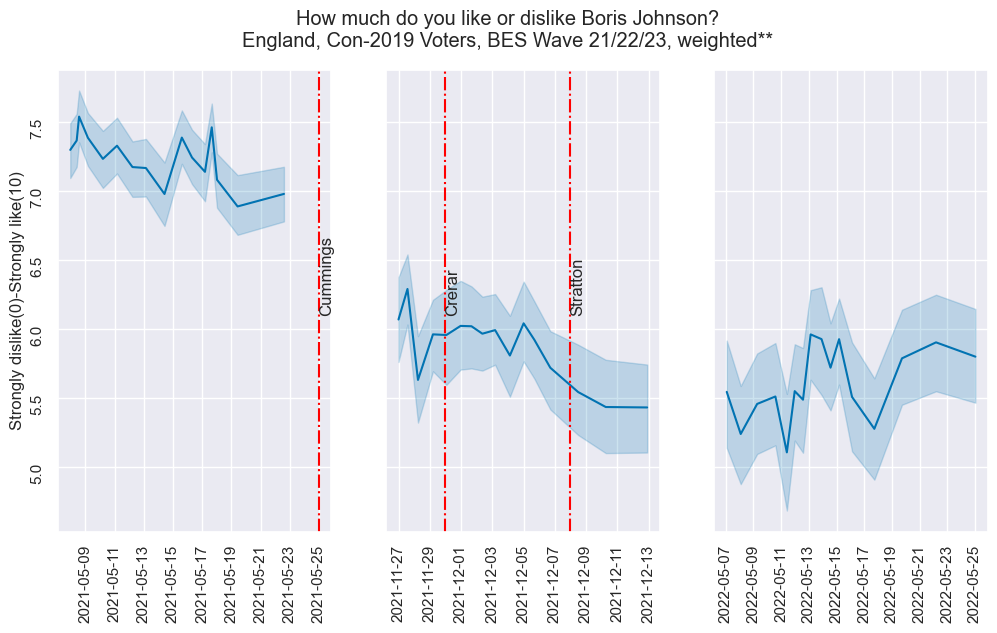

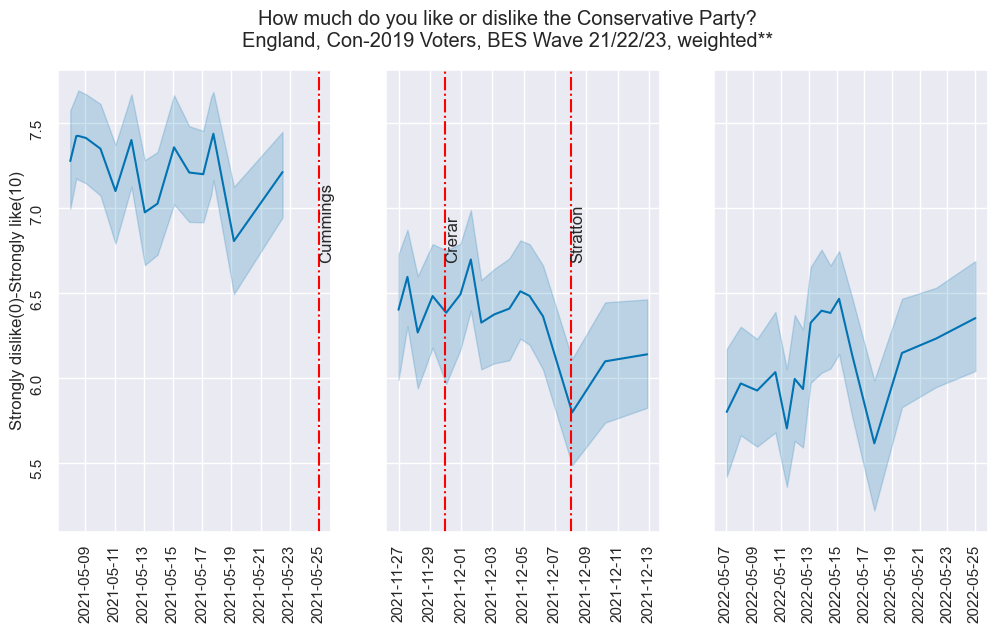

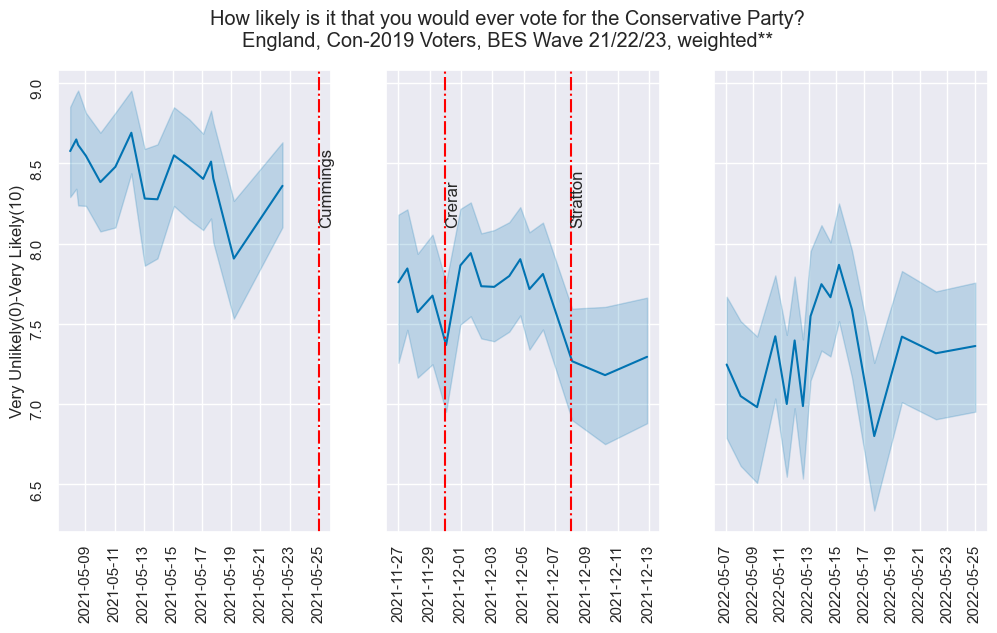

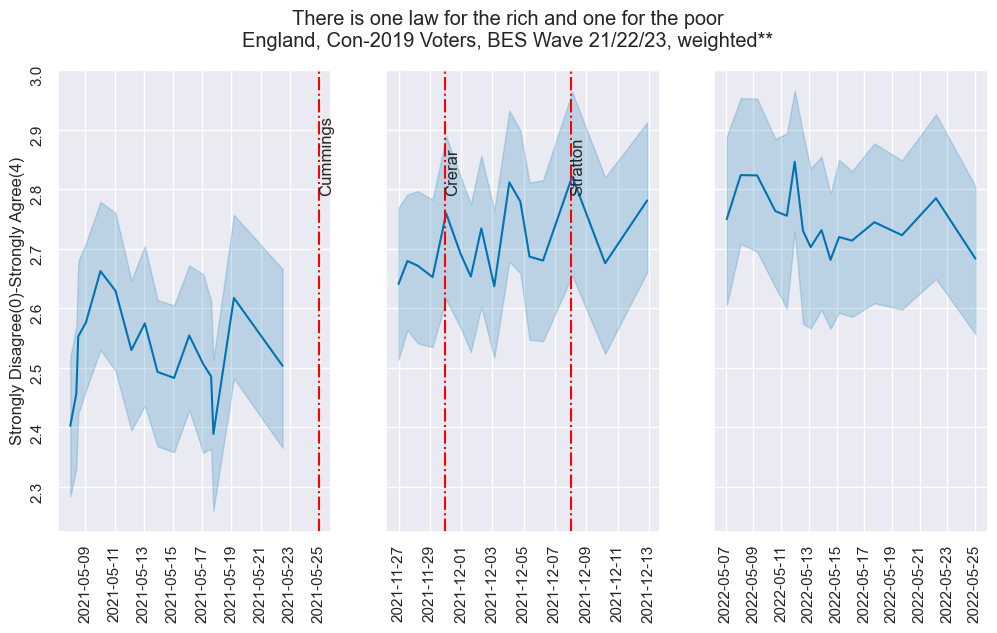

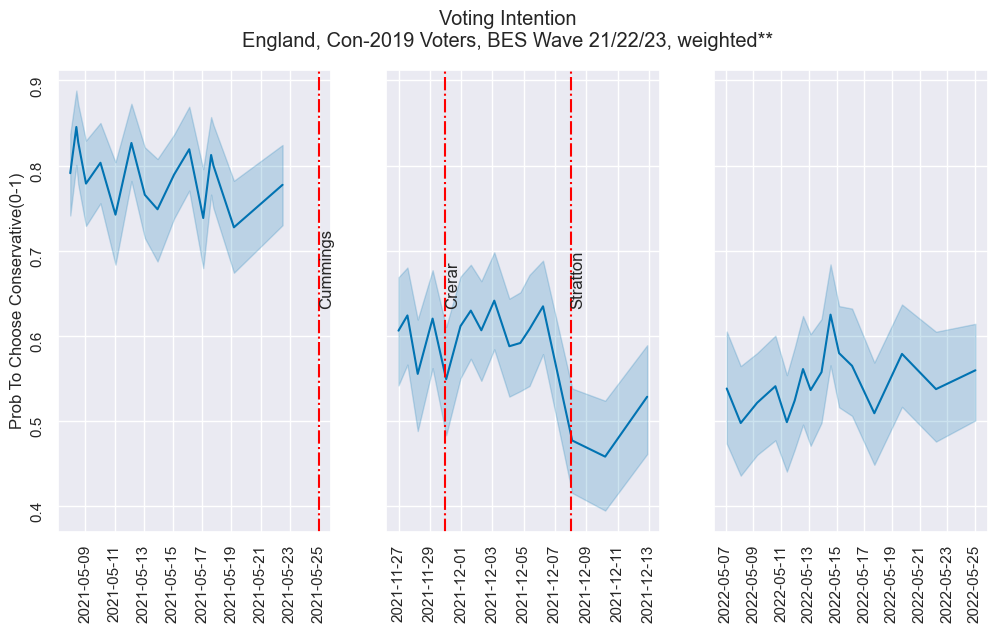

In [563]:
# var_name = "likeJohnson"
mask = BES_PanelW25_comb["p_past_vote_2019"]=="Conservative"
title_dict = {"likeJohnson":"How much do you like or dislike Boris Johnson?",
             "likeCon":"How much do you like or dislike the Conservative Party?",
              "ptvCon":"How likely is it that you would ever vote for the Conservative Party?",
              "lr4":"There is one law for the rich and one for the poor",
              "generalElectionVoteCon":"Voting Intention",
             }
label_dict = {"likeJohnson":"Strongly dislike(0)-Strongly like(10)",
             "likeCon":"Strongly dislike(0)-Strongly like(10)",
              "ptvCon":"Very Unlikely(0)-Very Likely(10)",
              "lr4":"Strongly Disagree(0)-Strongly Agree(4)",
              "generalElectionVoteCon":"Prob To Choose Conservative(0-1)",
             }
q=16

for var_name in ["likeJohnson","likeCon","ptvCon",
#                  "ptvLab","ptvBrexitParty","ptvLD",
#                  "competentJohnson","integrityJohnson",
                 "lr4",
#                  "partyIdConservative",
                 "generalElectionVoteCon",
#                  "trustMPs",
                ]:

    fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(12,6),sharey=True)

    for (wave,ax) in zip(("W21","W22","W23"),(ax1,ax2,ax3)):
        
        mask = mask&(BES_PanelW25_comb["country"+wave]=="England")
        if var_name+wave in BES_PanelW25_comb.columns:
            if BES_PanelW25_comb[var_name+wave].dtype=='category':
                y_var = BES_PanelW25_comb[var_name+wave][mask].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)
            else:
                y_var = BES_PanelW25_comb[var_name+wave][mask]
        else:
            continue
        x_var = pd.qcut(BES_PanelW25_comb["starttime"+wave][mask],q=q).apply(lambda x: x.mid)
        sns.lineplot(x=x_var, y=y_var, weights = BES_PanelW25_comb["wt_new_"+wave][mask],ax=ax);

    ax1.set_xlabel("");
    ax2.set_xlabel("");
    ax3.set_xlabel("");
    ax1.tick_params(labelrotation=90);
    ax2.tick_params(labelrotation=90);
    ax3.tick_params(labelrotation=90);
    ax1.set_ylabel(label_dict[var_name]);
    ax1.axvline(pd.to_datetime("2021-05-25"),c='red',linestyle="-.");
    ax1.text(pd.to_datetime("2021-05-25"),y_var.groupby(x_var).mean().max(),'Cummings',rotation=90);

    ax2.axvline(pd.to_datetime("2021-11-30"),c='red',linestyle="-.");
    ax2.text(pd.to_datetime("2021-11-30"),y_var.groupby(x_var).mean().max(),'Crerar',rotation=90);
    ax2.axvline(pd.to_datetime("2021-12-08"),c='red',linestyle="-.");
    ax2.text(pd.to_datetime("2021-12-08"),y_var.groupby(x_var).mean().max(),'Stratton',rotation=90);
    plt.suptitle(title_dict[var_name]+"\nEngland, Con-2019 Voters, BES Wave 21/22/23, weighted**");

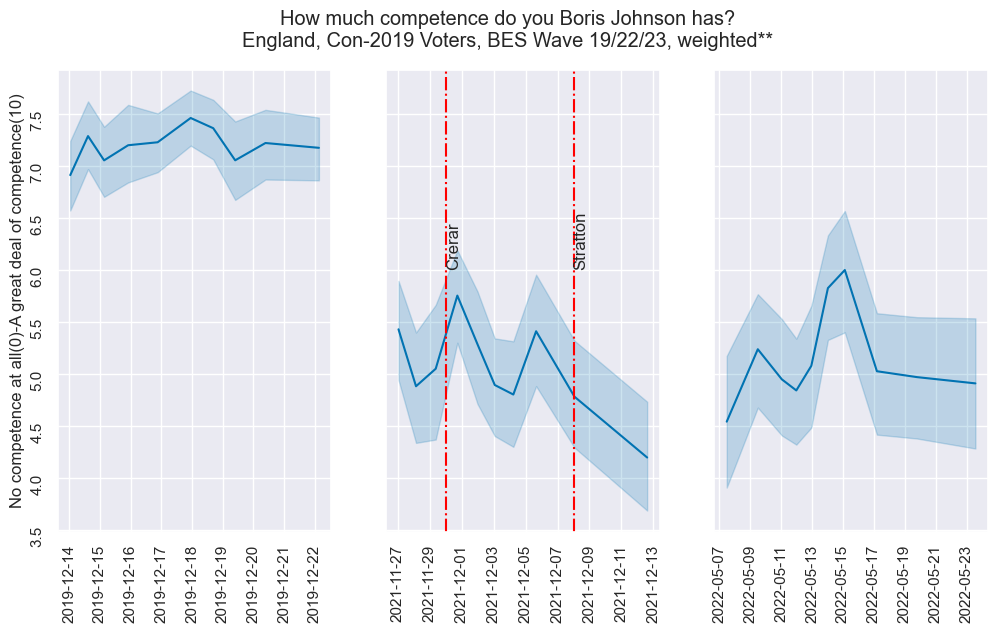

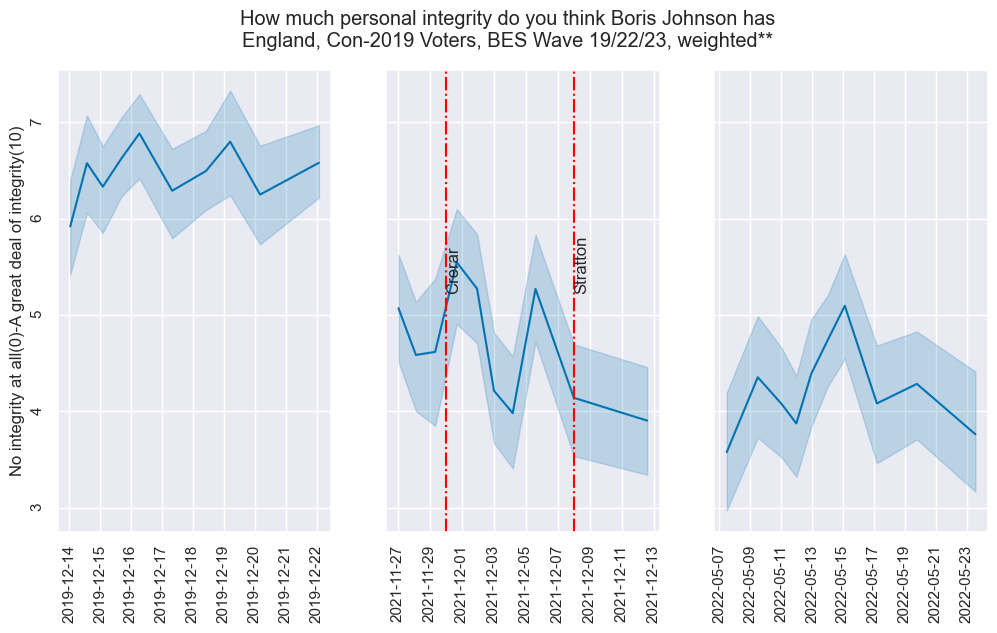

In [567]:
# var_name = "likeJohnson"
mask = BES_PanelW25_comb["p_past_vote_2019"]=="Conservative"
q=10

title_dict = {"competentJohnson":"How much competence do you Boris Johnson has?",
             "integrityJohnson":"How much personal integrity do you think Boris Johnson has",
             }
label_dict = {"competentJohnson":"No competence at all(0)-A great deal of competence(10)",
             "integrityJohnson":"No integrity at all(0)-A great deal of integrity(10)",
             }

for var_name in [
#     "likeJohnson","likeCon","ptvCon",
#                  "ptvLab","ptvBrexitParty","ptvLD",
                 "competentJohnson","integrityJohnson",
#                  "lr4",
#                  "partyIdConservative",
#                  "generalElectionVoteCon"
                ]:

    fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(12,6),sharey=True)

    for (wave,ax) in zip(("W19","W22","W23"),(ax1,ax2,ax3)):
        
        mask = mask&(BES_PanelW25_comb["country"+wave]=="England")
        if var_name+wave in BES_PanelW25_comb.columns:
            if BES_PanelW25_comb[var_name+wave].dtype=='category':
                y_var = BES_PanelW25_comb[var_name+wave][mask].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)
            else:
                y_var = BES_PanelW25_comb[var_name+wave][mask]
        else:
            continue
        x_var = pd.qcut(BES_PanelW25_comb["starttime"+wave][mask],q=q).apply(lambda x: x.mid)
        wt_var = "wt_new_"+wave
        if wave=="W19":
            wt_var = wt_var+"_result"
        sns.lineplot(x=x_var, y=y_var, weights = BES_PanelW25_comb[wt_var][mask],ax=ax);

    ax1.set_xlabel("");
    ax2.set_xlabel("");
    ax3.set_xlabel("");
    ax1.tick_params(labelrotation=90);
    ax2.tick_params(labelrotation=90);
    ax3.tick_params(labelrotation=90);
    ax1.set_ylabel(label_dict[var_name]);
#     ax1.axvline(pd.to_datetime("2021-05-25"),c='red',linestyle="-.");
#     ax1.text(pd.to_datetime("2021-05-25"),y_var.groupby(x_var).mean().max(),'Cummings',rotation=90);

    ax2.axvline(pd.to_datetime("2021-11-30"),c='red',linestyle="-.");
    ax2.text(pd.to_datetime("2021-11-30"),y_var.groupby(x_var).mean().max(),'Crerar',rotation=90);
    ax2.axvline(pd.to_datetime("2021-12-08"),c='red',linestyle="-.");
    ax2.text(pd.to_datetime("2021-12-08"),y_var.groupby(x_var).mean().max(),'Stratton',rotation=90);
    plt.suptitle(title_dict[var_name]+"\nEngland, Con-2019 Voters, BES Wave 19/22/23, weighted**");

In [554]:
search(BES_PanelW25_comb,"wt_new")

wt_new_W10           30237
wt_new_W11           30956
wt_new_W14           31063
wt_new_W15           30842
wt_new_W16           37959
wt_new_W1_W16         2427
wt_new_W18           37825
wt_new_W20           31468
wt_new_W21           30281
wt_new_W22           28113
wt_new_W23           30949
wt_new_W24           15439
wt_new_W25           30407
wt_new_W6W7          21081
wt_new_W2W6          23163
wt_new_W2W6W7        17076
wt_new_W9_W13        12562
wt_new_W12           34394
wt_new_W1_W11         6473
wt_new_W1_W12         5833
wt_new_W1_W13         5301
wt_new_W6_W11         9373
wt_new_W6_W12         8398
wt_new_W6_W13         7622
wt_new_W11_W13       21520
wt_new_W13W16        14647
wt_new_W13_result    31135
wt_new_W6W16          9587
wt_new_W2W16          8388
wt_new_W17           34366
wt_new_W13W17        15744
wt_new_W6W13W19       8743
wt_new_W9W19         13604
wt_new_W13_W19        5861
wt_new_W13W19        15811
wt_new_W16W19        21840
wt_new_W17W18W19     19000
w

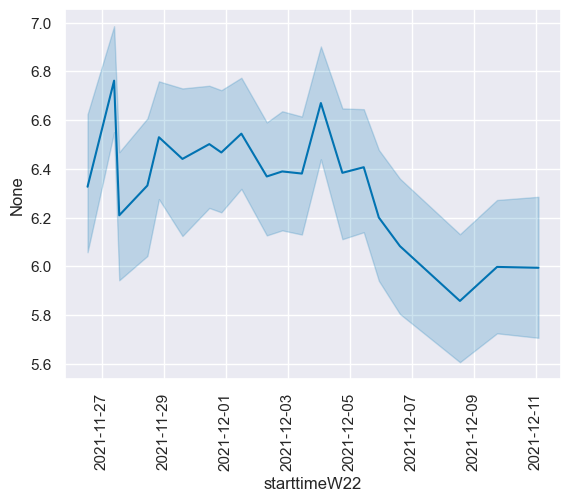

In [408]:
wave = "W22"
var_name = "likeCon"
mask = BES_PanelW25_comb["p_past_vote_2019"]=="Conservative"
mask = mask&(BES_PanelW25_comb["country"+wave]=="England")

sns.lineplot(x=pd.qcut(BES_PanelW25_comb["starttime"+wave][mask],q=20).apply(lambda x: x.left),
             #BES_PanelW25_comb["starttime"+wave][mask].dt.date,
             y=BES_PanelW25_comb[var_name+wave][mask].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan),
            weights = BES_PanelW25_comb["wt_new_"+wave][mask]);
plt.xticks(rotation=90);

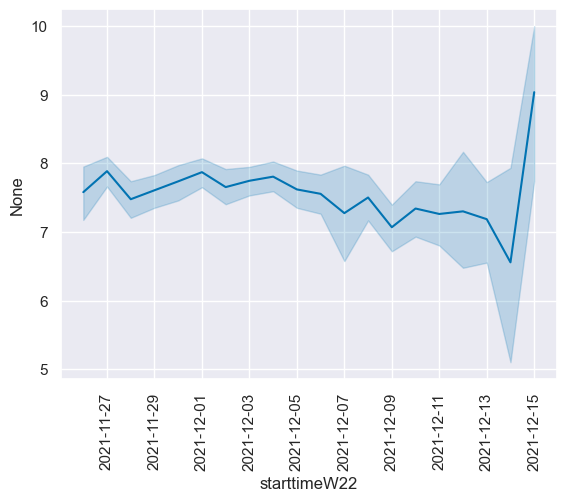

In [305]:
wave = "W22"
var_name = "ptvCon"
mask = BES_PanelW25_comb["p_past_vote_2019"]=="Conservative"
mask = mask&(BES_PanelW25_comb["country"+wave]=="England")

sns.lineplot(x=BES_PanelW25_comb["starttime"+wave][mask].dt.date,
             y=BES_PanelW25_comb[var_name+wave][mask].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan),
            weights = BES_PanelW25_comb["wt_new_"+wave][mask]);
plt.xticks(rotation=90);

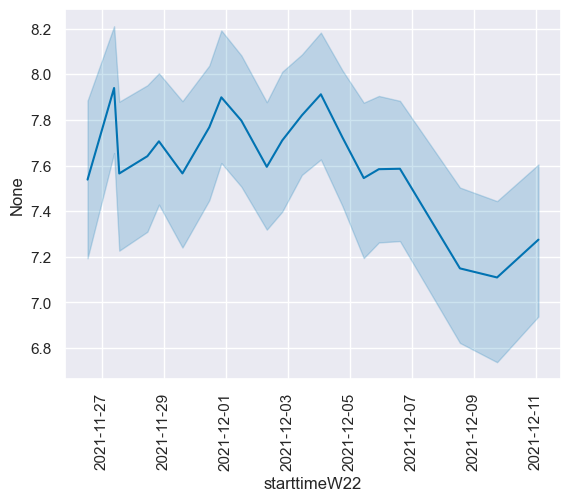

In [416]:
wave = "W22"
var_name = "ptvCon"
mask = BES_PanelW25_comb["p_past_vote_2019"]=="Conservative"
mask = mask&(BES_PanelW25_comb["country"+wave]=="England")

sns.lineplot(x=pd.qcut(BES_PanelW25_comb["starttime"+wave][mask],q=20).apply(lambda x: x.left),
#              BES_PanelW25_comb["starttime"+wave][mask].dt.date,
             y=BES_PanelW25_comb[var_name+wave][mask].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan),
            weights = BES_PanelW25_comb["wt_new_"+wave][mask]
            );
plt.xticks(rotation=90);

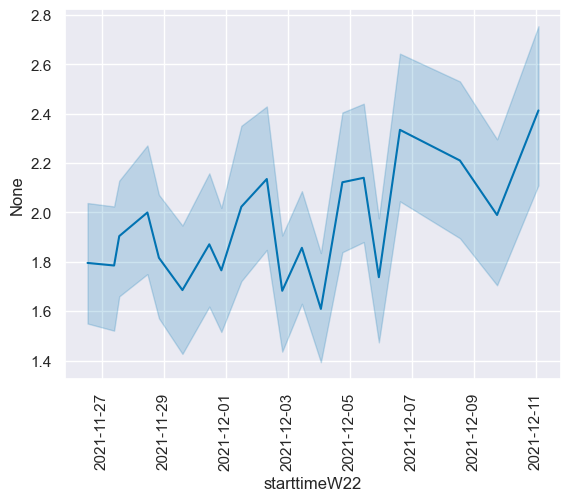

In [417]:
wave = "W22"
var_name = "ptvLab"
mask = BES_PanelW25_comb["p_past_vote_2019"]=="Conservative"
mask = mask&(BES_PanelW25_comb["country"+wave]=="England")

sns.lineplot(x=pd.qcut(BES_PanelW25_comb["starttime"+wave][mask],q=20).apply(lambda x: x.left),
#              BES_PanelW25_comb["starttime"+wave][mask].dt.date,
             y=BES_PanelW25_comb[var_name+wave][mask].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan),
            weights = BES_PanelW25_comb["wt_new_"+wave][mask]
            );
plt.xticks(rotation=90);

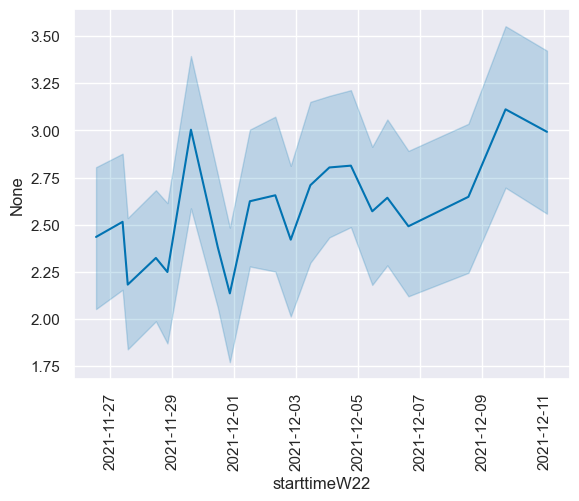

In [418]:
wave = "W22"
var_name = "ptvBrexitParty"
mask = BES_PanelW25_comb["p_past_vote_2019"]=="Conservative"
mask = mask&(BES_PanelW25_comb["country"+wave]=="England")

sns.lineplot(x=pd.qcut(BES_PanelW25_comb["starttime"+wave][mask],q=20).apply(lambda x: x.left),
#              BES_PanelW25_comb["starttime"+wave][mask].dt.date,
             y=BES_PanelW25_comb[var_name+wave][mask].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan),
            weights = BES_PanelW25_comb["wt_new_"+wave][mask]
            );
plt.xticks(rotation=90);

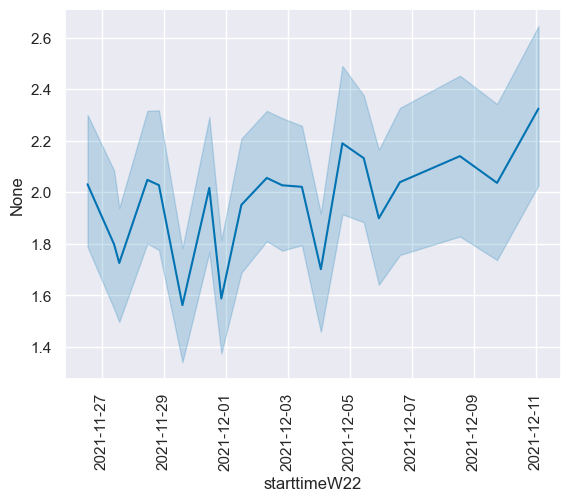

In [419]:
wave = "W22"
var_name = "ptvLD"
mask = BES_PanelW25_comb["p_past_vote_2019"]=="Conservative"
mask = mask&(BES_PanelW25_comb["country"+wave]=="England")

sns.lineplot(x=pd.qcut(BES_PanelW25_comb["starttime"+wave][mask],q=20).apply(lambda x: x.left),
#              BES_PanelW25_comb["starttime"+wave][mask].dt.date,
             y=BES_PanelW25_comb[var_name+wave][mask].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan),
            weights = BES_PanelW25_comb["wt_new_"+wave][mask]
            );
plt.xticks(rotation=90);

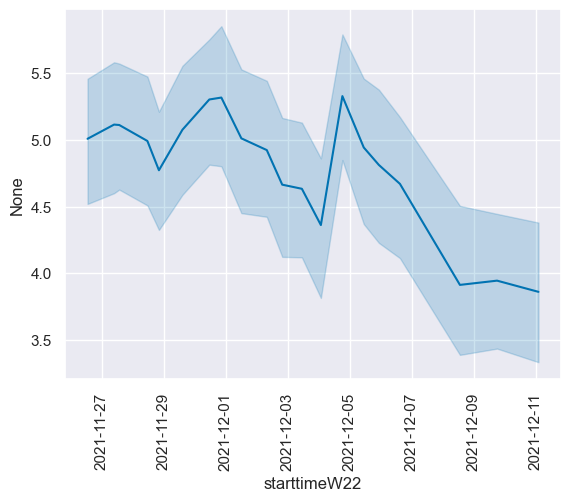

In [406]:
wave = "W22"
var_name = "integrityJohnson"
mask = BES_PanelW25_comb["p_past_vote_2019"]=="Conservative"
mask = mask&(BES_PanelW25_comb["country"+wave]=="England")

sns.lineplot(x=pd.qcut(BES_PanelW25_comb["starttime"+wave][mask],q=20).apply(lambda x: x.left),
             #BES_PanelW25_comb["starttime"+wave][mask].dt.date,
             y=BES_PanelW25_comb[var_name+wave][mask].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan),
#             weights = BES_PanelW25_comb["wt_new_"+wave][mask]
            );
plt.xticks(rotation=90);

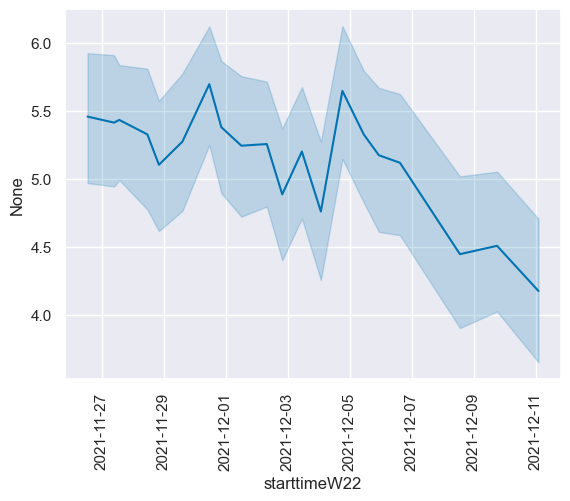

In [404]:
wave = "W22"
var_name = "competentJohnson"
mask = BES_PanelW25_comb["p_past_vote_2019"]=="Conservative"
mask = mask&(BES_PanelW25_comb["country"+wave]=="England")

sns.lineplot(x= pd.qcut(BES_PanelW25_comb["starttime"+wave][mask],q=20).apply(lambda x: x.left),
             #BES_PanelW25_comb["starttime"+wave][mask].dt.date,
             y=BES_PanelW25_comb[var_name+wave][mask].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan),
#             weights = BES_PanelW25_comb["wt_new_"+wave][mask]
            );
plt.xticks(rotation=90);

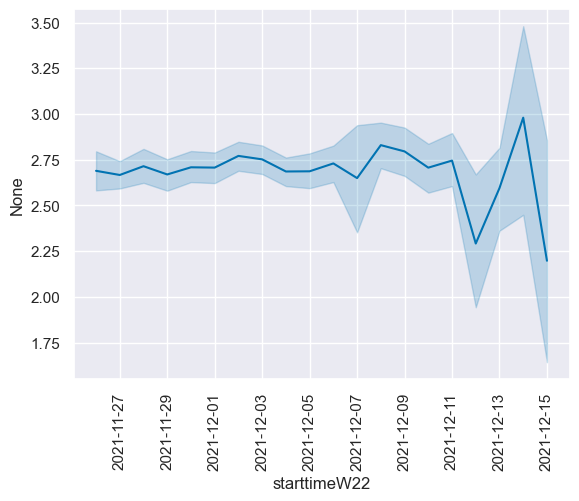

In [306]:
wave = "W22"
var_name = "lr4"
mask = BES_PanelW25_comb["p_past_vote_2019"]=="Conservative"
mask = mask&(BES_PanelW25_comb["country"+wave]=="England")

sns.lineplot(x=BES_PanelW25_comb["starttime"+wave][mask].dt.date,
             y=BES_PanelW25_comb[var_name+wave][mask].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan),
            weights = BES_PanelW25_comb["wt_new_"+wave][mask]);
plt.xticks(rotation=90);

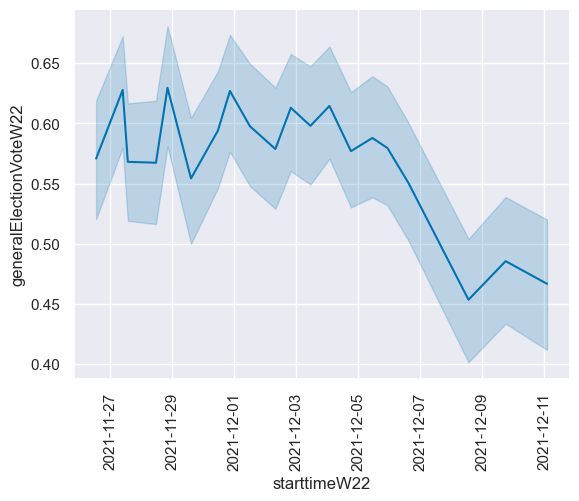

In [403]:
wave = "W22"
var_name = "generalElectionVote"
mask = BES_PanelW25_comb["p_past_vote_2019"]=="Conservative"
mask = mask&(BES_PanelW25_comb["country"+wave]=="England")

sns.lineplot(x=pd.qcut(BES_PanelW25_comb["starttime"+wave][mask],q=20).apply(lambda x: x.left),
             #
             #BES_PanelW25_comb["starttime"+wave][mask].dt.date,
             y=BES_PanelW25_comb[var_name+wave][mask]=="Conservative",
            weights = BES_PanelW25_comb["wt_new_"+wave][mask]);
plt.xticks(rotation=90);

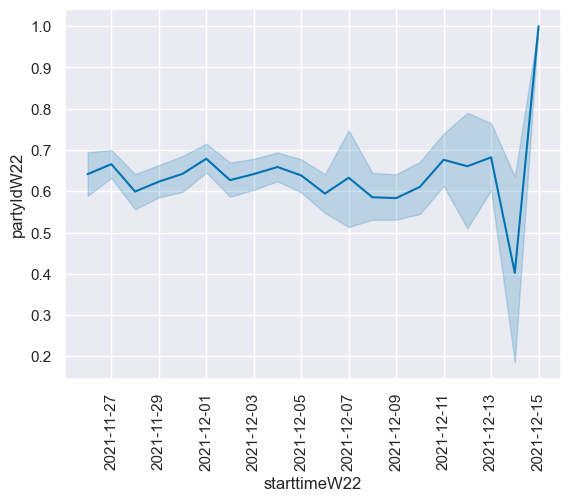

In [308]:
wave = "W22"
var_name = "partyId"
mask = BES_PanelW25_comb["p_past_vote_2019"]=="Conservative"
mask = mask&(BES_PanelW25_comb["country"+wave]=="England")

sns.lineplot(x=BES_PanelW25_comb["starttime"+wave][mask].dt.date,
             y=BES_PanelW25_comb[var_name+wave][mask]=="Conservative",
            weights = BES_PanelW25_comb["wt_new_"+wave][mask]);
plt.xticks(rotation=90);

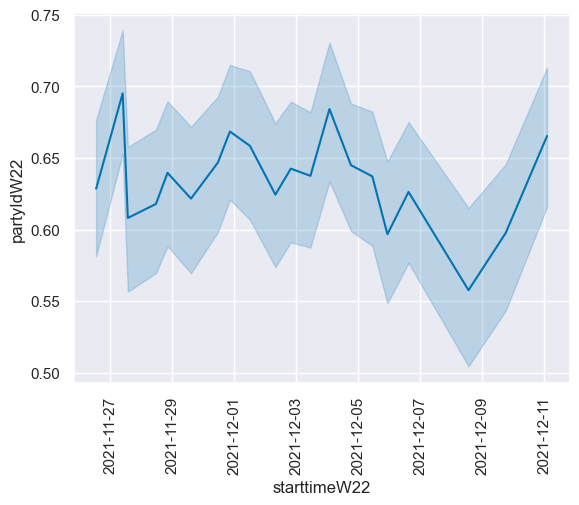

In [496]:


wave = "W22"
var_name = "partyId"
mask = BES_PanelW25_comb["p_past_vote_2019"]=="Conservative"
mask = mask&(BES_PanelW25_comb["country"+wave]=="England")

sns.lineplot(x=pd.qcut(BES_PanelW25_comb["starttime"+wave][mask],q=20).apply(lambda x: x.left),
             y=BES_PanelW25_comb[var_name+wave][mask]=="Conservative",
            weights = BES_PanelW25_comb["wt_new_"+wave][mask]
            );
plt.xticks(rotation=90);

In [371]:
mask = BES_PanelW25_comb["p_past_vote_2019"]=="Conservative"
mask = mask&(BES_PanelW25_comb["country"+wave]=="England")
mask = mask&BES_PanelW25_comb["wt_new_"+wave].notnull()

After = BES_PanelW25_comb["starttimeW22"]>pd.to_datetime("2021-12-06")
After[BES_PanelW25_comb["starttimeW22"].isnull()]=np.nan
Before = After.replace({True:False,False:True})

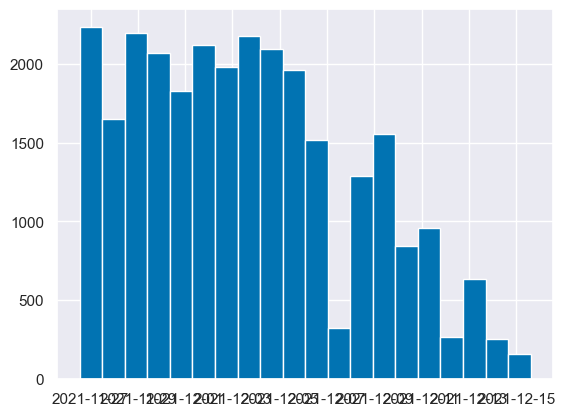

In [378]:
BES_PanelW25_comb["starttimeW22"].hist(bins=20);

In [372]:
BES_PanelW25_comb["starttimeW22"][After==True].sort_values()

id
105593   2021-12-06 00:01:54.149
39052    2021-12-06 00:03:07.837
62621    2021-12-06 00:04:53.017
106714   2021-12-06 00:08:25.204
85798    2021-12-06 00:10:19.393
                   ...          
104576   2021-12-15 14:13:41.591
105275   2021-12-15 14:17:22.735
88403    2021-12-15 14:19:43.570
94179    2021-12-15 14:31:27.144
45633    2021-12-15 14:37:28.905
Name: starttimeW22, Length: 7825, dtype: datetime64[ns]

In [328]:
After[mask].value_counts()

starttimeW22
False    6588
True     3010
Name: count, dtype: int64

In [339]:
Before[mask].value_counts()

starttimeW22
True     6588
False    3010
Name: count, dtype: int64

In [373]:
(BES_reduced_with_naW22[After&mask]*BES_PanelW25_comb["wt_new_W22"][After&mask]).mean()\
    -(BES_reduced_with_naW22[Before&mask]*BES_PanelW25_comb["wt_new_W22"][Before&mask]).mean()

2                                                             NaN
14                                                            NaN
15                                                            NaN
40                                                            NaN
44                                                            NaN
                                                               ..
workingStatus_Retired                                         NaN
workingStatus_Unemployed and looking for work                 NaN
workingStatus_Working full time (30 or more hours per week)   NaN
workingStatus_Working part time (8-29 hours per week)         NaN
workingStatus_Working part time (less than 8 hours a week)    NaN
Length: 10247, dtype: float64

In [413]:
Before_Means = BES_reduced_with_naW22[Before&mask].apply(lambda x: np.mean(x*BES_PanelW25_comb["wt_new_W22"][Before&mask]/BES_PanelW25_comb["wt_new_W22"][Before&mask].mean()))
After_Means = BES_reduced_with_naW22[After&mask].apply(lambda x: np.mean(x*BES_PanelW25_comb["wt_new_W22"][After&mask]/BES_PanelW25_comb["wt_new_W22"][After&mask].mean()))

In [379]:
Before_Means = BES_reduced_with_naW22[Before&mask].apply(lambda x: np.mean(x))
After_Means = BES_reduced_with_naW22[After&mask].apply(lambda x: np.mean(x))

In [414]:
(After_Means-Before_Means).dropna().sort_values().head(50)

age                                                                                                      -6.031634
redistSNP__Government should be less concerned about equal incomes                                       -5.359364
likeSNP__Strongly like                                                                                   -4.024942
scottishness__Very strongly Scottish                                                                     -3.749356
likeSturgeon__Strongly like                                                                              -3.516460
benchCoronaKorea__Very good                                                                              -3.470865
benchCoronaUK__Very good                                                                                 -3.177322
cvEconSNP__Save the economy even if it increases infections                                              -3.010271
EUIntegrationSNP__Protect our independence                                      

In [ ]:
integrityJohnson__Complete integrity                                                                     -0.761559
competentJohnson__A great deal of competence                                                             -0.650925
likeJohnson__Strongly like                                                                               -0.496970
likeCon__Strongly like                                                                                   -0.423239
ptvCon__Very likely                                                                                      -0.384140

In [415]:
(After_Means-Before_Means).dropna().sort_values().tail(50)

immigLab__Allow many more                                                0.084066
p_welsh_list_vote_2016_I would/did not vote                              0.086334
likeDavey__Strongly like                                                 0.087663
workingStatus_Working full time (30 or more hours per week)              0.092807
conLookAfterLocal__Very closely                                          0.093352
p_work_stat_Working full time (30 or more hours per week)                0.093400
europeanness__Very strongly European                                     0.096984
p_education_age__Still at school/Full time student                       0.098528
likeLab__Strongly like                                                   0.099157
p_scot_list_vote_2011_Labour                                             0.099952
p_hh_children__5 or more                                                 0.100732
EUIntegrationGreen__Protect our independence                             0.102526
ptvGrn__Very lik

In [366]:
search(pd.DataFrame((After_Means-Before_Means)).T,"ptvCon")

ptvCon__Very likely    1
dtype: int64

In [367]:
(After_Means-Before_Means)['ptvCon__Very likely']

0.6692718817322652

In [336]:
After

id
1           NaN
2         False
3           NaN
4           NaN
5           NaN
          ...  
113062      NaN
113063      NaN
113064      NaN
113065      NaN
113066      NaN
Name: starttimeW22, Length: 111621, dtype: object

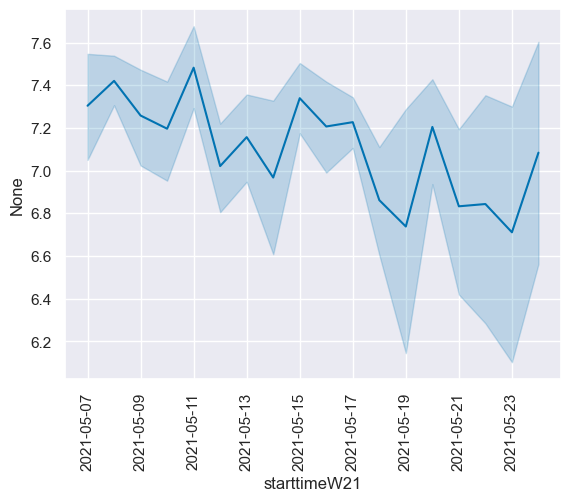

In [301]:
wave = "W21"
mask = BES_PanelW25_comb["p_past_vote_2019"]=="Conservative"
mask = mask&(BES_PanelW25_comb["country"+wave]=="England")

sns.lineplot(x=BES_PanelW25_comb["starttime"+wave][mask].dt.date,
             y=BES_PanelW25_comb["likeJohnson"+wave][mask].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan),
            weights = BES_PanelW25_comb["wt_new_"+wave][mask]);
plt.xticks(rotation=90);

In [300]:
BES_PanelW25_comb["likeJohnson"+wave][mask].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)

id
2          7.0
14         8.0
15         7.0
40         8.0
44        10.0
          ... 
106073     6.0
106075     9.0
106077     7.0
106079     7.0
106080     9.0
Length: 10216, dtype: float64

In [166]:
# in both, likeCon, gender, 

# w21 lr3, lr4, riskPoverty, age, taxSpend
# w23 al_scale, al4, immigSelf
    # likeJohnson!



# partygateCare&Anger W23 only pandemicEconImpact, 

id
2        -2.0
14        0.0
15       -1.0
18       -1.0
24        1.0
         ... 
106070    0.0
106072   -5.0
106076   -1.0
106079    0.0
106080    0.0
Name: trustMPs__A great deal of trust, Length: 17077, dtype: float64

In [243]:
search(BES_reduced_with_naW21_W23,"p_past_")

p_past_vote_2010_ConservativeW23                                 9320
p_past_vote_2010_LabourW23                                       9320
p_past_vote_2010_Liberal DemocratW23                             9320
p_past_vote_2010_United Kingdom Independence Party (UKIP)W23     9320
p_past_vote_2010_Scottish National Party (SNP)W23                9320
                                                                ...  
p_past_vote_2019_Green PartyW21                                 12741
p_past_vote_2019_Brexit Party/Reform UKW21                      12741
p_past_vote_2019_Plaid CymruW21                                 12741
p_past_vote_2019_An independent candidateW21                    12741
p_past_vote_2019_United Kingdom Independence Party (UKIP)W21    12741
Length: 80, dtype: int64

In [80]:
search(BES_PanelW23,"partyGate|satDemUK|leftRight")

leftRight         30949
satDemUK          30949
partygateAnger    30949
partygateCare     30949
dtype: int64

In [81]:
search(BES_PanelW21,"partyGate|satDemUK|leftRight")

leftRight    30281
satDemUK     30281
dtype: int64

In [74]:
corrsW21 = BES_reduced_with_naW21.corrwith(BES_reduced_with_naW21["trustMPsDiff"])

In [76]:
name = "trustMPsDiff"
df, corr_type = make_corr_summary(BES_reduced_with_naW21, name)
display_corr(df,name,corr_type)

,r,p,N
cvEconBrexit__Save the economy even if it[...],0.170000,0.00,6282
efficacyPolCare__Strongly agree,0.150000,0.00,16790
changeInequality__Getting much higher,0.140000,0.00,15869
vote2019Partner_Labour,0.140000,0.00,1670
lr4__Strongly agree,0.140000,0.00,16798
achieveReduceImmigNone_Yes,0.140000,0.00,2463
effectsRemainEcon__Much better,0.130000,0.00,15646
localElectionVote_Labour,0.130000,0.00,6899
redistBrexit__Government should be less concerned[...],0.130000,0.00,7012
redistCon__Government should be less concerned[...],0.130000,0.00,12934


In [77]:
name = "trustMPsDiff"
df, corr_type = make_corr_summary(BES_reduced_with_naW23, name)
display_corr(df,name,corr_type)

,r,p,N
trustMPs__A great deal of trust,0.250000,0.00,17077
lrBrexit__Right,0.130000,0.00,2302
p_past_vote_2019_Labour,0.120000,0.00,14829
redistBrexit__Government should be less concerned[...],0.120000,0.00,7235
grnLookAfterRetired__Very closely,0.120000,0.00,1870
pidCommonPartyb__Strongly agree,0.120000,0.00,1358
pidConnected__Strongly agree,0.110000,0.00,1443
immigSelf__Allow many more,0.110000,0.00,16053
redistCon__Government should be less concerned[...],0.110000,0.00,13521
effectsRemainEcon__Much better,0.110000,0.00,15991


In [122]:
search(BES_PanelW25_comb,"country")

abroadCountry_1W8               5258
abroadCountry_2W8               5258
motherCountryBornW8            24295
fatherCountryBornW8            24295
automationEffectsCountryW16     9330
environCountrysideW25           7636
countryW1                      30587
countryW2                      30221
countryW3                      28104
countryW4                      31552
countryW5                      30809
countryW6                      30131
countryW7                      30895
countryW8                      33502
countryW9                      30036
countryW10                     30214
countryW11                     30956
countryW12                     34394
countryW13                     31114
countryW14                     31063
countryW15                     30842
countryW16                     37959
countryW17                     34366
countryW18                     37825
countryW19                     32177
countryW20                     31468
countryW21                     30281
c

In [249]:
search(BES_PanelW25_comb,"trustMPs")
trust_df = pd.DataFrame(columns = ["wave","trustMPs","wt","p_past_vote","id"])


wave_list = [1,2,3,4, 6,7,8,9, 10, 12, 15,16,17,18,19,20,21, 23, 25]

wave_to_wt = {1:"wt_full_W1",2:"wt_full_W2",3:"wt_full_W3",4:"wt_full_W4",
              6:"wt_new_W6",7:"wt_new_W7",8:"wt_new_W8",9:"wt_new_W9", 10:"wt_new_W10", 12:"wt_new_W12",
              15:"wt_new_W15",16:"wt_new_W16",17:"wt_new_W17",18:"wt_new_W18",19:"wt_new_W19_result",20:"wt_new_W20",
              21:"wt_new_W21", 23:"wt_new_W23", 25:"wt_new_W25"}

wave_to_past_vote = {1:"p_past_vote_2010",2:"p_past_vote_2010",3:"p_past_vote_2010",4:"p_past_vote_2010",
              6:"p_past_vote_2015",7:"p_past_vote_2015",8:"p_past_vote_2015",9:"p_past_vote_2015", 10:"p_past_vote_2015", 12:"p_past_vote_2015",
              15:"p_past_vote_2017",16:"p_past_vote_2017",17:"p_past_vote_2017",18:"p_past_vote_2017",19:"p_past_vote_2019",20:"p_past_vote_2019",
              21:"p_past_vote_2019", 23:"p_past_vote_2019", 25:"p_past_vote_2019"}

# run through and build weighted crosstab for trustMPs (->) by 

for wave in wave_list:
    england_only = BES_PanelW25_comb["countryW"+str(wave)]=="England"
    
    
    temp_df = pd.DataFrame(columns = ["wave","trustMPs","wt","p_past_vote","id"])
    
    temp_df["trustMPs"] = BES_PanelW25_comb["trustMPsW"+str(wave)][england_only].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)
    temp_df["wt"] = BES_PanelW25_comb[wave_to_wt[wave]][england_only]
    temp_df["id"] = BES_PanelW25_comb[england_only].index
    temp_df["p_past_vote"] = BES_PanelW25_comb[wave_to_past_vote[wave]][england_only]
    temp_df["wave"] = wave
    temp_df = temp_df.dropna()
    trust_df = pd.concat([trust_df,temp_df],axis=0)
    
# build a dataset


# wave, trustMPs (num), wt, p_past_vote

trust_df["trustMPs_wt"] = list(zip(trust_df["trustMPs"],trust_df["wt"]))

trust_df["p_past_vote"].value_counts()

replace_dict = {"United Kingdom Independence Party (UKIP)":"BNP/UKIP/BXP",
                "Brexit Party/Reform UK":"BNP/UKIP/BXP",
                "British National Party (BNP)":"BNP/UKIP/BXP",
                "Other":np.nan,
                "An independent candidate":np.nan,
                "Don't know":np.nan,
                "Conservative":"CON",
                "Labour":"LAB",
                "Liberal Democrat":"LD",
                "Scottish National Party (SNP)":np.nan,
                "Green Party":"GP",
                "Plaid Cymru":np.nan,
               }

trust_df["p_past_vote_simple"] = trust_df["p_past_vote"].replace(replace_dict)

palette = {"BNP/UKIP/BXP":"purple","CON":"blue","LAB":"red","LD":"orange","GP":"green"}


trust_df

,wave,trustMPs,wt,p_past_vote,id,trustMPs_wt,p_past_vote_simple
1,1,0.0,0.619887,United Kingdom Independence Party (UKIP),1,"(0.0, 0.6198869798011676)",BNP/UKIP/BXP
2,1,4.0,0.848408,Conservative,2,"(4.0, 0.848407502369229)",CON
3,1,1.0,4.428796,Liberal Democrat,3,"(1.0, 4.428795847032336)",LD
4,1,1.0,3.020551,Conservative,4,"(1.0, 3.0205509142006077)",CON
5,1,3.0,0.562667,Liberal Democrat,5,"(3.0, 0.5626672982209618)",LD
...,...,...,...,...,...,...,...
113038,25,5.0,0.845612,Liberal Democrat,113038,"(5.0, 0.8456120088631678)",LD
113040,25,0.0,1.832596,Liberal Democrat,113040,"(0.0, 1.8325960146570752)",LD
113055,25,2.0,0.765386,Labour,113055,"(2.0, 0.7653863249044105)",LAB
113057,25,0.0,2.079381,Conservative,113057,"(0.0, 2.079381024955117)",CON


In [126]:
trust_df["p_past_vote_simple"].value_counts()

p_past_vote_simple
CON             139528
LAB             105974
LD               46173
BNP/UKIP/BXP     20733
GP               11635
SNP                154
PC                  93
Name: count, dtype: int64

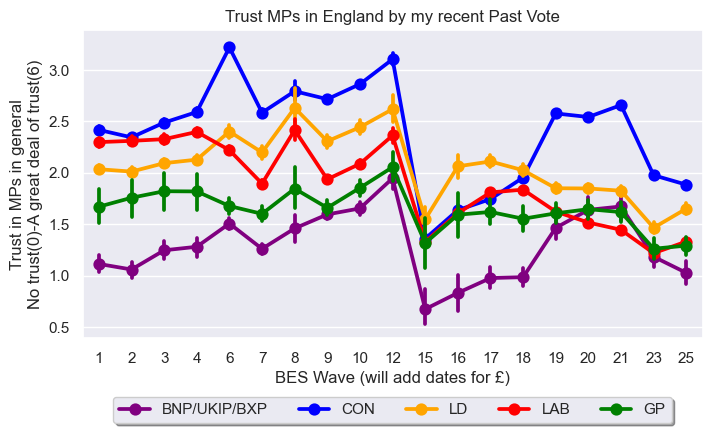

In [142]:
plt.figure(figsize=(8,4));
sns.pointplot(
    data=trust_df,
    x="wave", y="trustMPs", hue="p_past_vote_simple",
    estimator=np.mean,palette=palette
#     markers=["o", "s"], linestyles=["-", "--"],
);
plt.ylabel("Trust in MPs in general\nNo trust(0)-A great deal of trust(6)");
plt.xlabel("BES Wave (will add dates for £)");
plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.3),
          ncol=5, fancybox=True, shadow=True);
plt.title("Trust MPs in England by recent Past Vote");

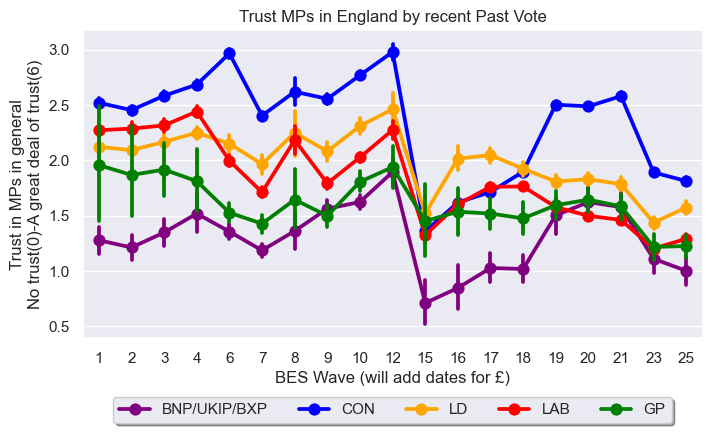

In [250]:
plt.figure(figsize=(8,4));
sns.pointplot(
    data=trust_df,
    x="wave", y="trustMPs", hue="p_past_vote_simple",weights="wt",
    palette=palette
#     markers=["o", "s"], linestyles=["-", "--"],
);
plt.ylabel("Trust in MPs in general\nNo trust(0)-A great deal of trust(6)");
plt.xlabel("BES Wave (will add dates for £)");
plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.3),
          ncol=5, fancybox=True, shadow=True);
plt.title("Trust MPs in England by recent Past Vote");

In [171]:
search(BES_PanelW25_comb,"trustMPs")
trust_df = pd.DataFrame(columns = ["wave","trustMPs","wt","gender","id"])


wave_list = [1,2,3,4, 6,7,8,9, 10, 12, 15,16,17,18,19,20,21, 23, 25]

wave_to_wt = {1:"wt_full_W1",2:"wt_full_W2",3:"wt_full_W3",4:"wt_full_W4",
              6:"wt_new_W6",7:"wt_new_W7",8:"wt_new_W8",9:"wt_new_W9", 10:"wt_new_W10", 12:"wt_new_W12",
              15:"wt_new_W15",16:"wt_new_W16",17:"wt_new_W17",18:"wt_new_W18",19:"wt_new_W19_result",20:"wt_new_W20",
              21:"wt_new_W21", 23:"wt_new_W23", 25:"wt_new_W25"}

wave_to_past_vote = {1:"p_past_vote_2010",2:"p_past_vote_2010",3:"p_past_vote_2010",4:"p_past_vote_2010",
              6:"p_past_vote_2015",7:"p_past_vote_2015",8:"p_past_vote_2015",9:"p_past_vote_2015", 10:"p_past_vote_2015", 12:"p_past_vote_2015",
              15:"p_past_vote_2017",16:"p_past_vote_2017",17:"p_past_vote_2017",18:"p_past_vote_2017",19:"p_past_vote_2019",20:"p_past_vote_2019",
              21:"p_past_vote_2019", 23:"p_past_vote_2019", 25:"p_past_vote_2019"}

# run through and build weighted crosstab for trustMPs (->) by 

for wave in wave_list:
    england_only = BES_PanelW25_comb["countryW"+str(wave)]=="England"
    
    
    temp_df = pd.DataFrame(columns = ["wave","trustMPs","wt","gender","id"])
    
    temp_df["trustMPs"] = BES_PanelW25_comb["trustMPsW"+str(wave)][england_only].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)
    temp_df["wt"] = BES_PanelW25_comb[wave_to_wt[wave]][england_only]
    temp_df["id"] = BES_PanelW25_comb[england_only].index
    temp_df["gender"] = BES_PanelW25_comb["gender"][england_only]
    temp_df["wave"] = wave
    temp_df = temp_df.dropna()
    trust_df = pd.concat([trust_df,temp_df],axis=0)
    
# build a dataset


# wave, trustMPs (num), wt, p_past_vote

# trust_df["trustMPs_wt"] = list(zip(trust_df["trustMPs"],trust_df["wt"]))

# trust_df["p_past_vote"].value_counts()

# replace_dict = {"United Kingdom Independence Party (UKIP)":"BNP/UKIP/BXP",
#                 "Brexit Party/Reform UK":"BNP/UKIP/BXP",
#                 "British National Party (BNP)":"BNP/UKIP/BXP",
#                 "Other":np.nan,
#                 "An independent candidate":np.nan,
#                 "Don't know":np.nan,
#                 "Conservative":"CON",
#                 "Labour":"LAB",
#                 "Liberal Democrat":"LD",
#                 "Scottish National Party (SNP)":np.nan,
#                 "Green Party":"GP",
#                 "Plaid Cymru":np.nan,
#                }

# trust_df["p_past_vote_simple"] = trust_df["p_past_vote"].replace(replace_dict)

# palette = {"BNP/UKIP/BXP":"purple","CON":"blue","LAB":"red","LD":"orange","GP":"green"}

palette = {"Male":"blue","Female":"red"}
trust_df

,wave,trustMPs,wt,gender,id
1,1,0.0,0.619887,Male,1
2,1,4.0,0.848408,Female,2
3,1,1.0,4.428796,Female,3
4,1,1.0,3.020551,Female,4
5,1,3.0,0.562667,Female,5
...,...,...,...,...,...
113060,25,2.0,0.699284,Male,113060
113061,25,1.0,1.941033,Male,113061
113062,25,0.0,1.281519,Female,113062
113063,25,1.0,1.941033,Male,113063


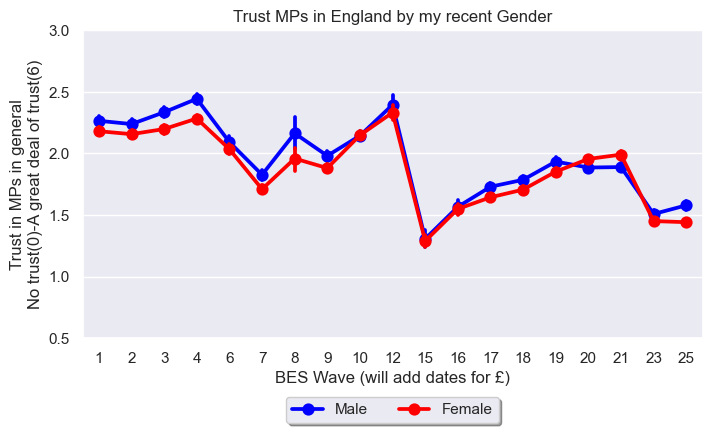

In [173]:
plt.figure(figsize=(8,4));
sns.pointplot(
    data=trust_df,
    x="wave", y="trustMPs", hue="gender",weights="wt",
    palette=palette
#     markers=["o", "s"], linestyles=["-", "--"],
);
plt.ylabel("Trust in MPs in general\nNo trust(0)-A great deal of trust(6)");
plt.xlabel("BES Wave (will add dates for £)");
plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.3),
          ncol=5, fancybox=True, shadow=True);
plt.title("Trust MPs in England by my recent Gender");
plt.ylim([.5,3.0]);

In [489]:
%%time
dataset_name = "W12_only"
df_list = "BES_Panel|BES_reduced_with_na"

%matplotlib inline 
%run BES_header.py {dataset_name} {df_list}

global BES_label_list, BES_df_list

BES_PanelW12 = BES_Panel
BES_reduced_with_naW12 = pd.get_dummies( BES_Panel.select_dtypes(["float","category","object"]) )
BES_reduced_with_naW12 = BES_reduced_with_naW12.astype(float)

Toggle code

var_type (423, 13)
CPU times: total: 1.06 s
Wall time: 1.06 s


In [488]:
%%time
dataset_name = "W15_only"
df_list = "BES_Panel|BES_reduced_with_na"

%matplotlib inline 
%run BES_header.py {dataset_name} {df_list}

global BES_label_list, BES_df_list

BES_PanelW15 = BES_Panel
BES_reduced_with_naW15 = pd.get_dummies( BES_Panel.select_dtypes(["float","category","object"]) )
BES_reduced_with_naW15 = BES_reduced_with_naW15.astype(float)

Toggle code

var_type (495, 13)
CPU times: total: 1.28 s
Wall time: 1.28 s


In [487]:
%%time
dataset_name = "W4_only"
df_list = "BES_Panel|BES_reduced_with_na"

%matplotlib inline 
%run BES_header.py {dataset_name} {df_list}

global BES_label_list, BES_df_list

BES_PanelW4 = BES_Panel
BES_reduced_with_naW4 = pd.get_dummies( BES_Panel.select_dtypes(["float","category","object"]) )
BES_reduced_with_naW4 = BES_reduced_with_naW4.astype(float)

Toggle code

var_type (651, 13)
CPU times: total: 1.41 s
Wall time: 1.4 s


In [486]:
%%time
dataset_name = "W7_only"
df_list = "BES_Panel|BES_reduced_with_na"

%matplotlib inline 
%run BES_header.py {dataset_name} {df_list}

global BES_label_list, BES_df_list

BES_PanelW7 = BES_Panel
BES_reduced_with_naW7 = pd.get_dummies( BES_Panel.select_dtypes(["float","category","object"]) )
BES_reduced_with_naW7 = BES_reduced_with_naW7.astype(float)

Toggle code

var_type (614, 13)
CPU times: total: 1.17 s
Wall time: 1.17 s


<Figure size 640x480 with 0 Axes>

,wt,warmDenmark,warmFrance,warmPoland,warmRomania,warmGreece,warmSpain,warmUK,jobzone,pano,...,"profile_eurefturnout_No, did not vote","profile_eurefturnout_Yes, voted",profile_eurefturnout_Don't know,"profile_scotref_turnout_Yes, I voted","profile_scotref_turnout_No, I did not vote","profile_scotref_turnout_No, I was not eligible to vote",profile_scotref_turnout_Don't know,profile_scotref_vote_I voted 'No' (Scotland should not be an independent country),profile_scotref_vote_I voted 'Yes' (Scotland should be an independent country),profile_scotref_vote_Don't know
id,,,,,,,,,,,,,,,,,,,,,
1,1.407584,43.0,0.0,7.0,1.0,39.0,2.0,75.0,2.0,607.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.193967,94.0,57.0,56.0,56.0,93.0,66.0,91.0,4.0,552.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.546880,60.0,31.0,51.0,53.0,11.0,25.0,81.0,2.0,80.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0.184099,95.0,97.0,97.0,96.0,96.0,96.0,98.0,NaN,127.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.611095,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,24.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51063,0.536944,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,590.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
51064,0.856889,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,119.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
51065,0.394520,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,608.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [492]:
wave1 = "W4"
wave2 = "W7"
BES_reduced_with_naW4_W7 = BES_reduced_with_naW7.copy()
BES_reduced_with_naW4_W7.columns = [x+wave2 for x in BES_reduced_with_naW4_W7.columns]
BES_reduced_with_naW4_W7[[x+wave1 for x in BES_reduced_with_naW4.columns]] = BES_reduced_with_naW4
englandMask = (BES_reduced_with_naW4_W7[search(BES_reduced_with_naW4_W7,"^CountryW").index]==1.0).all(axis=1)
BES_reduced_with_naW4_W7 = BES_reduced_with_naW4_W7[englandMask]

BES_reduced_with_naW4_W7["trustMPsDiff"] = BES_PanelW7["trustMPs"].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)\
    - BES_PanelW4["trustMPs"].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)

In [493]:
wave1 = "W12"
wave2 = "W15"
BES_reduced_with_naW12_W15 = BES_reduced_with_naW15.copy()
BES_reduced_with_naW12_W15.columns = [x+wave2 for x in BES_reduced_with_naW12_W15.columns]
BES_reduced_with_naW12_W15[[x+wave1 for x in BES_reduced_with_naW12.columns]] = BES_reduced_with_naW12
englandMask = (BES_reduced_with_naW12_W15[search(BES_reduced_with_naW12_W15,"^CountryW").index]==1.0).all(axis=1)
BES_reduced_with_naW12_W15 = BES_reduced_with_naW12_W15[englandMask]

BES_reduced_with_naW12_W15["trustMPsDiff"] = BES_PanelW15["trustMPs"].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)\
    - BES_PanelW12["trustMPs"].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)

In [490]:
# BES_reduced_with_naW12_W15 = BES_reduced_with_naW12_W15.select_dtypes('number')

In [471]:
mask.sum()

5853

MSE: 1.93, MAE: 1.10, EV: 0.17, R2: 0.17


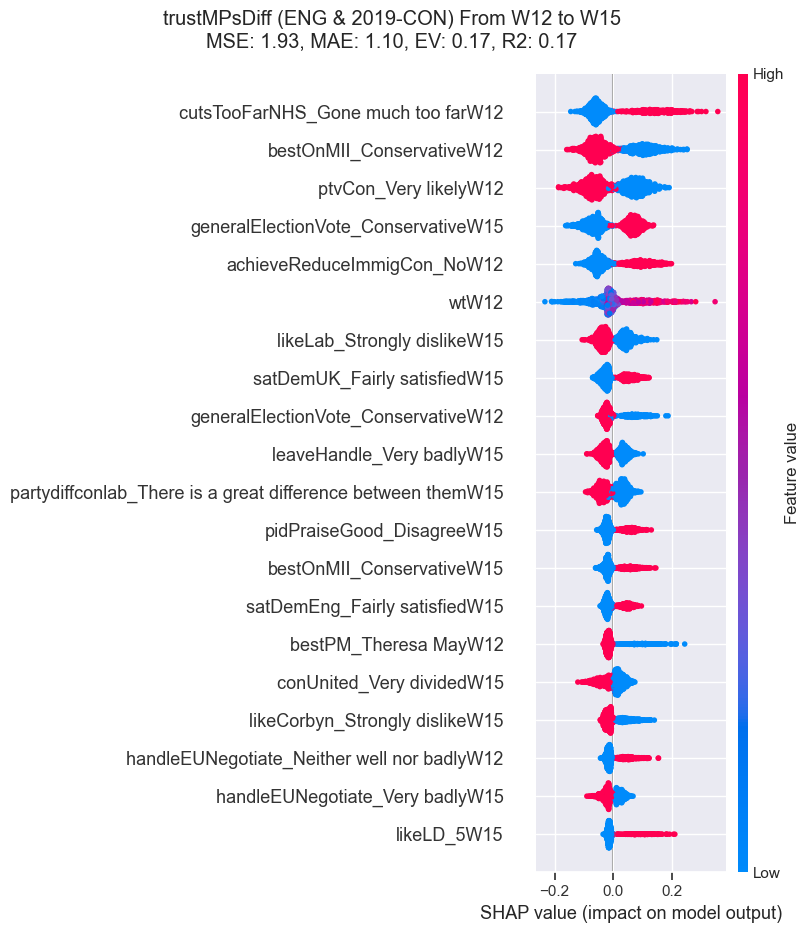

In [494]:
name = "trustMPsDiff"

title = "trustMPsDiff (ENG & 2019-CON) From W12 to W15"
# print(title)
mask = (BES_reduced_with_naW12_W15[search(BES_reduced_with_naW12_W15,"p_past_vote_2019_Conservative").index]==1.0).all(axis=1)




# BES_reduced_with_naW21["trustMPsDiff"] = BES_reduced_with_naW23["trustMPs__A great deal of trust"]\
#     - BES_reduced_with_naW21["trustMPs__A great deal of trust"]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics) = xgboost_run(
    title = title,dataset=BES_reduced_with_naW12_W15[mask],
                                                    var_list = [name],
                                                    var_stub_list = [name,"trustMPs",
#                                                                      "approveUKGovt", "happyScotIndep", "areaCrime", 
#                                                                     "benchCorona","changeEconomyLab",
#                                                                      "approveUKGovt","ukGovtEcon",
#                                                                     "likeCon__","efficacyPolCare__","efficacyNoMatter__",
#                                                                      "lr4__","likeJohnson__","ptvCon__","likeCon__","lr_scale",
                                                                    ],
                                                    verbosity=0,min_features=20)

MSE: 1.36, MAE: 0.86, EV: 0.09, R2: 0.09


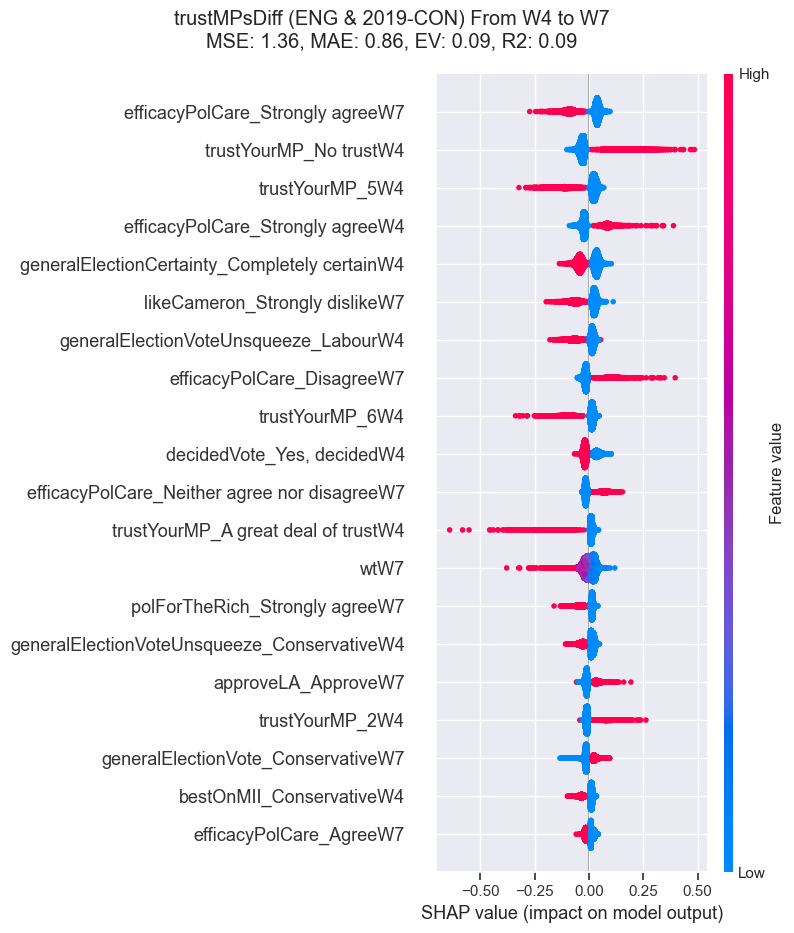

In [495]:
name = "trustMPsDiff"

title = "trustMPsDiff (ENG & 2019-CON) From W4 to W7"
# print(title)
mask = (BES_reduced_with_naW4_W7[search(BES_reduced_with_naW4_W7,"p_past_vote_2019_Conservative").index]==1.0).all(axis=1)




# BES_reduced_with_naW21["trustMPsDiff"] = BES_reduced_with_naW23["trustMPs__A great deal of trust"]\
#     - BES_reduced_with_naW21["trustMPs__A great deal of trust"]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics) = xgboost_run(
    title = title,dataset=BES_reduced_with_naW4_W7[mask],
                                                    var_list = [name],
                                                    var_stub_list = [name,"trustMPs",
#                                                                      "approveUKGovt", "happyScotIndep", "areaCrime", 
#                                                                     "benchCorona","changeEconomyLab",
#                                                                      "approveUKGovt","ukGovtEcon",
#                                                                     "likeCon__","efficacyPolCare__","efficacyNoMatter__",
#                                                                      "lr4__","likeJohnson__","ptvCon__","likeCon__","lr_scale",
                                                                    ],
                                                    verbosity=0,min_features=20)

In [577]:
search(BES_PanelW25_comb,"partygate")

partygateAngerW23    30949
partygateCareW23     30949
dtype: int64

MSE: 1.10, MAE: 0.84, EV: 0.39, R2: 0.39


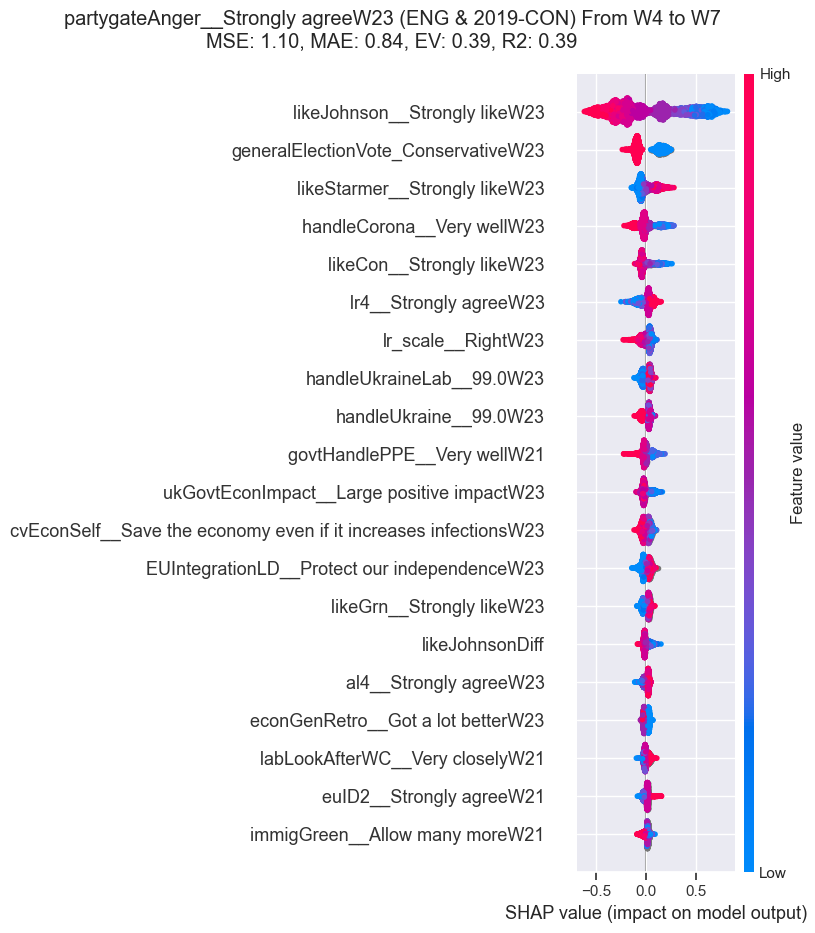

In [571]:
name = "partygateAnger__Strongly agreeW23"

title = "partygateAnger__Strongly agreeW23 (ENG & 2019-CON) From W4 to W7"
# print(title)
mask = (BES_reduced_with_naW21_W23[search(BES_reduced_with_naW21_W23,"p_past_vote_2019_Conservative").index]==1.0).all(axis=1)




# BES_reduced_with_naW21["trustMPsDiff"] = BES_reduced_with_naW23["trustMPs__A great deal of trust"]\
#     - BES_reduced_with_naW21["trustMPs__A great deal of trust"]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics) = xgboost_run(
    title = title,dataset=BES_reduced_with_naW21_W23[mask],
                                                    var_list = [name],
                                                    var_stub_list = [name,
#                                                                      "approveUKGovt", "happyScotIndep", "areaCrime", 
#                                                                     "benchCorona","changeEconomyLab",
#                                                                      "approveUKGovt","ukGovtEcon",
#                                                                     "likeCon__","efficacyPolCare__","efficacyNoMatter__",
#                                                                      "lr4__","likeJohnson__","ptvCon__","likeCon__","lr_scale",
                                                                     "partygateCare",
                                                                    ],
                                                    verbosity=0,min_features=20)

MSE: 1.10, MAE: 0.83, EV: 0.43, R2: 0.43


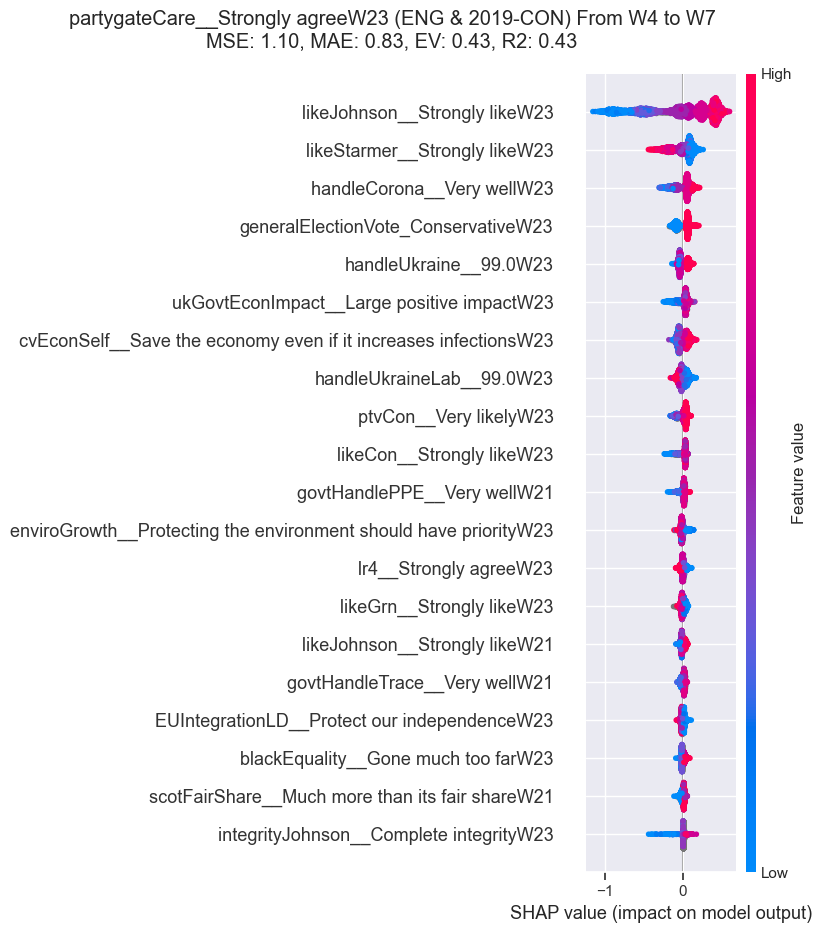

In [573]:
name = "partygateCare__Strongly agreeW23"

title = "partygateCare__Strongly agreeW23 (ENG & 2019-CON) From W4 to W7"
# print(title)
mask = (BES_reduced_with_naW21_W23[search(BES_reduced_with_naW21_W23,"p_past_vote_2019_Conservative").index]==1.0).all(axis=1)




# BES_reduced_with_naW21["trustMPsDiff"] = BES_reduced_with_naW23["trustMPs__A great deal of trust"]\
#     - BES_reduced_with_naW21["trustMPs__A great deal of trust"]

(explainer, shap_values, train_columns, train_index, alg,output_subfolder,metrics) = xgboost_run(
    title = title,dataset=BES_reduced_with_naW21_W23[mask],
                                                    var_list = [name],
                                                    var_stub_list = [name,
#                                                                      "approveUKGovt", "happyScotIndep", "areaCrime", 
#                                                                     "benchCorona","changeEconomyLab",
#                                                                      "approveUKGovt","ukGovtEcon",
#                                                                     "likeCon__","efficacyPolCare__","efficacyNoMatter__",
#                                                                      "lr4__","likeJohnson__","ptvCon__","likeCon__","lr_scale",
                                                                     "partygateAnger",
                                                                    ],
                                                    verbosity=0,min_features=20)

In [610]:
search(BES_PanelW25_comb,"generalElectionVote")

generalElectionVoteW1              30546
generalElectionVoteW2              30882
generalElectionVoteW3              28561
generalElectionVoteW4              31547
generalElectionVoteUnsqueezeW4     20884
generalElectionVoteSqueezeW4        9399
generalElectionVoteW5              30508
generalElectionVotePostW5           3241
generalElectionVoteUnsqueezeW5     19487
generalElectionVoteSqueezeW5        6814
generalElectionVoteW6              27838
generalElectionVoteW7              30895
generalElectionVoteW8              33502
generalElectionVoteW9              30036
generalElectionVoteW10             30237
generalElectionVoteW11             30956
generalElectionVoteUnsqueezeW11    20488
generalElectionVoteSqueezeW11       9330
generalElectionVoteW12             34394
generalElectionVotePostW12          4335
generalElectionVoteUnsqueezeW12    21316
generalElectionVoteSqueezeW12       7389
generalElectionVoteW13             28296
generalElectionVoteW14             31063
generalElectionV

In [614]:
pd.crosstab(BES_PanelW25_comb["immigSelfW25"],BES_PanelW25_comb["generalElectionVoteW25"],
            values=BES_PanelW25_comb["wt_new_W25"],aggfunc=sum,normalize='all',margins=True)*100

generalElectionVoteW25,I would/did not vote,Conservative,Labour,Liberal Democrat,Scottish National Party (SNP),Plaid Cymru,Green Party,Other,Brexit Party/Reform UK,Don't know,All
immigSelfW25,,,,,,,,,,,
Allow many fewer,3.665292,6.013635,3.347607,0.636844,0.144335,0.058298,0.402278,0.629484,3.138626,4.569891,22.606290
1,0.450654,1.294962,0.790647,0.206333,0.053975,0.007174,0.154260,0.063750,0.324020,0.969313,4.315087
2,0.567232,2.070244,1.291904,0.411051,0.093862,0.020513,0.193717,0.127662,0.265660,1.360530,6.402375
3,0.716286,1.947575,1.986957,0.498126,0.102769,0.024574,0.247407,0.111690,0.197515,1.800474,7.633373
4,0.391274,1.375523,1.841589,0.576475,0.091099,0.021004,0.266460,0.105568,0.093531,1.233138,5.995661
5,1.158705,2.257613,6.262164,1.534021,0.332241,0.055331,0.892078,0.233633,0.146882,2.870672,15.743337
6,0.336579,0.865614,3.174564,0.934469,0.194823,0.036156,0.517588,0.115067,0.058615,1.035925,7.269399
7,0.281309,0.561799,4.304153,0.949322,0.326777,0.028567,0.692656,0.106584,0.056404,0.969895,8.277467
8,0.205003,0.202686,2.433571,0.652139,0.235560,0.039117,0.487286,0.075111,0.022055,0.380921,4.733448


In [615]:
(pd.crosstab(BES_PanelW25_comb["immigSelfW25"],BES_PanelW25_comb["generalElectionVoteW25"],
            values=BES_PanelW25_comb["wt_new_W25"],aggfunc=sum,normalize='all',margins=True)*100)["All"].cumsum()

immigSelfW25
Allow many fewer     22.606290
1                    26.921377
2                    33.323752
3                    40.957125
4                    46.952786
5                    62.696123
6                    69.965522
7                    78.242989
8                    82.976436
9                    84.125882
Allow many more      88.771470
Don't know          100.000000
All                 200.000000
Name: All, dtype: float64